In [2]:
options(warn=-1)
library(dplyr)
library(Seurat)
library(SeuratWrappers)
library(tidyverse)
library(RColorBrewer)
library(patchwork)
library(wesanderson)
library(pheatmap)
library(ggrepel)
library(ggplot2)
library(reshape2)
library(Hmisc)
library(EnhancedVolcano)
library(ggsci)
library(gprofiler2)
library(clusterProfiler)
library(org.Hs.eg.db)
library(msigdbr)
library(enrichplot)
library(spacexr)
library(harmony)
library(homologene)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0          ✔ readr     2.1.4     
✔ ggplot2   3.5.0.9000     ✔ stringr   1.5.1     
✔ lubridate 1.9.3          ✔ tibble    3.2.1     
✔ purrr     1.0.2          ✔ tidyr     1.3.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘Hmisc’


The following object is masked from ‘package:SeuratObject’:

    Key


The following object is masked fr

In [3]:
pal <- wes_palette("Zissou1", 100, type = "continuous")
pal1<-wes_palette("Zissou1")
currentcol<-c('#B40F20',"#E59D07","lightgrey","#6C5B4E","#F69572","#84B678","#E49417","#5BBCD6","#FB7069","#C1BB7B","#F1DD7B","black","dark grey","#6C261C","#A14C29")

In [4]:
readRDS('RDS/CZI_processed.rds')->czi

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


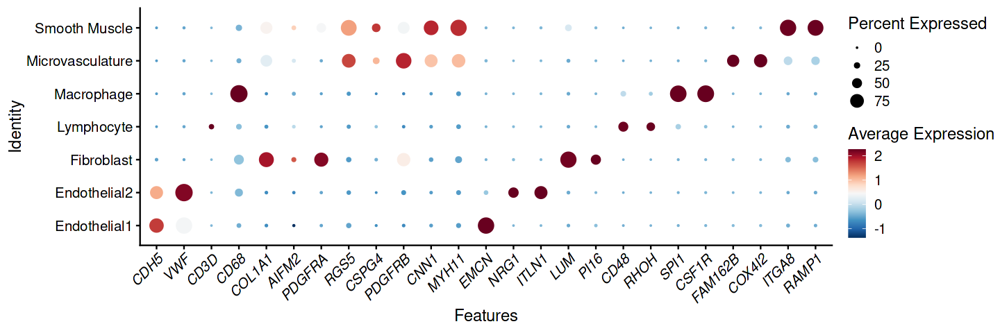

In [8]:
DefaultAssay(czi)<-'RNA'
czi$celltype2->Idents(czi)
levels(czi)<-c("Endothelial1","Endothelial2","Fibroblast", "Lymphocyte", "Macrophage","Microvasculature","Smooth Muscle")
options(repr.plot.width=12, repr.plot.height=4)
DotPlot(czi, features = c("CDH5","VWF","CD31",#EC,
                          "CD3D","CD68", #Lymphocyte
                          "COL1A1", "AIFM2","PDGFRA",#FB,
                          "RGS5", "CSPG4","PDGFRB",#Microvasculature
                          "CNN1","MYH11",#SMC,
                          "EMCN","NRG1","ITLN1",#EC,
                          "LUM","PI16",#FB
                          "CD48","RHOH", #Lymphocyte
                          "SPI1","CSF1R",#MP
                          "FAM162B","COX4I2",#Microvasculature
                          "ITGA8","RAMP1"#SMC,
                        ))+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
     theme( axis.text.x = element_text(face='italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

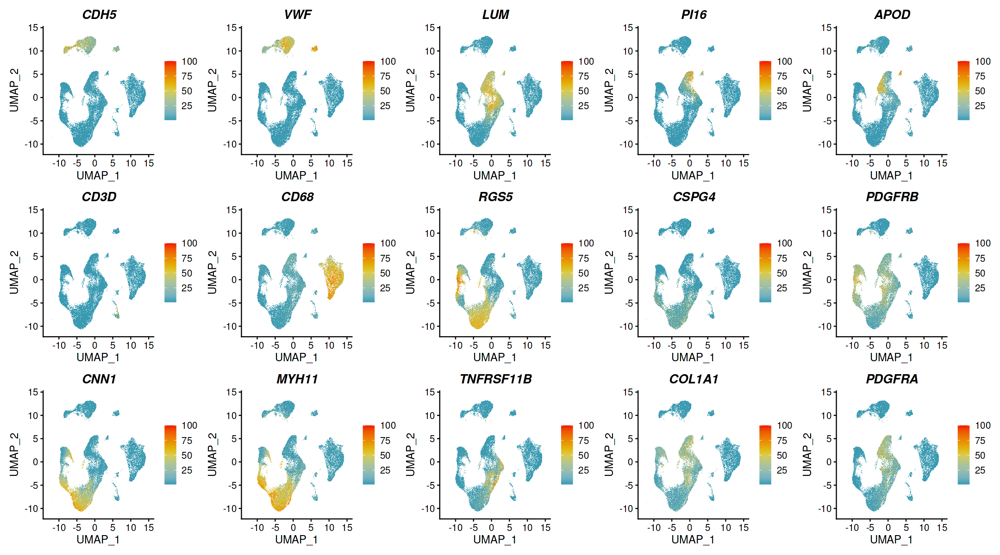

In [6]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=18, repr.plot.height=10)
FeaturePlot(czi,features = c("CDH5","VWF",#EC,
                          "LUM",'PI16',"APOD",#FB
                         "CD3D",'CD68', #Lymphocyte                        
                          "RGS5","CSPG4","PDGFRB",#Microvasculature
                         "CNN1","MYH11","TNFRSF11B","COL1A1", "FSP1","PDGFRA"#SMC
                        ), cols = pal, ncol=5,  min.cutoff = 0.01) &theme( plot.title = element_text(face='bold.italic'))

In [43]:
czi@meta.data$celltype3 <- as.character(czi@meta.data$celltype3)
czi@meta.data$celltype2 <- as.character(czi@meta.data$celltype2)

In [44]:
na_idx <- is.na(czi@meta.data$celltype3)
czi@meta.data$celltype3[na_idx] <- czi@meta.data$celltype2[na_idx]

In [45]:
Idents(czi)<-czi$celltype3
levels(czi)<- c("Endothelial1", "Endothelial2","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle_Intimal","Smooth Muscle_Medial","Macrophage", "Other Mesencyhmal cells")
Idents(czi)->czi$celltype3

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



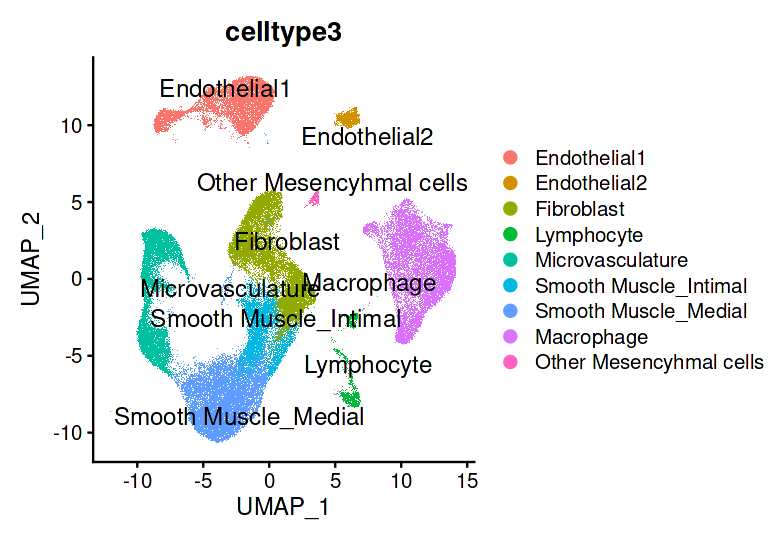

In [46]:
options(repr.plot.width=6.5, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'celltype3')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



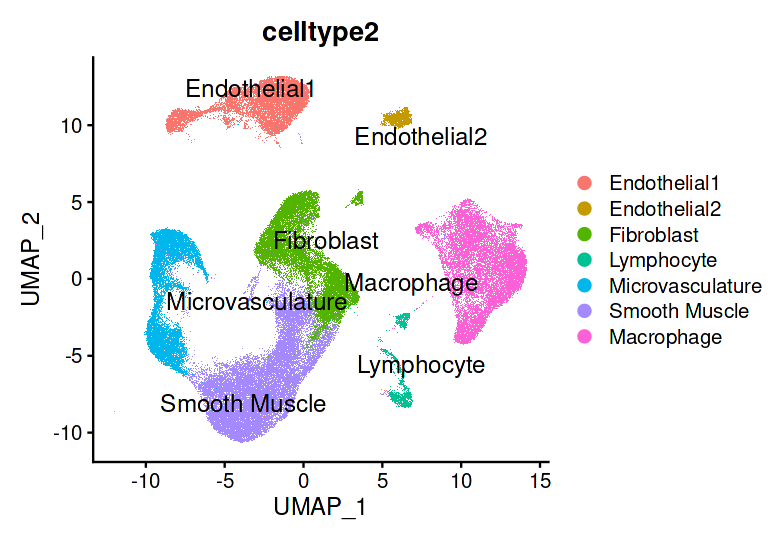

In [198]:
options(repr.plot.width=6.5, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'celltype2')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



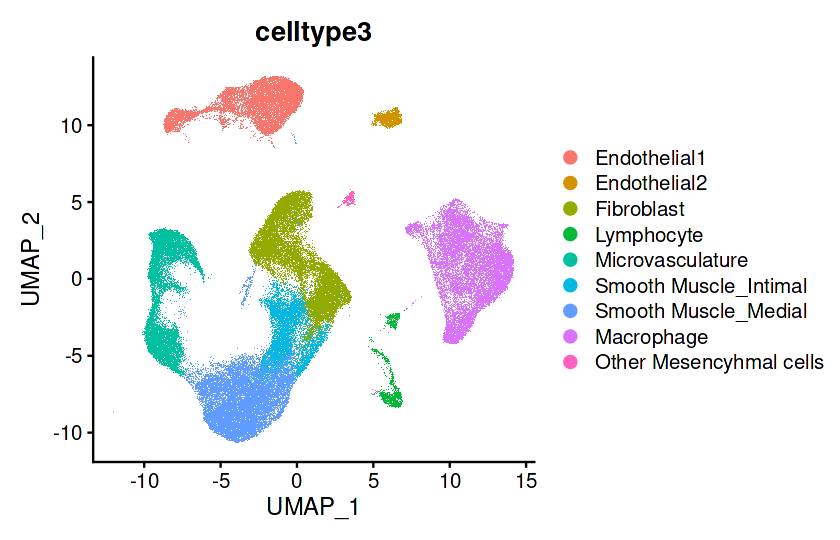

In [47]:
options(repr.plot.width=7, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = F, label.size = 5,repel = TRUE,group.by = 'celltype3')

In [69]:
czi$celltype->Idents(czi)
subset(czi, ident=c('Smooth Muscle','Microvasculature'))->smc_micro

In [70]:
DefaultAssay(smc_micro)<-'integrated'
smc_micro<-FindVariableFeatures(smc_micro,verbose = F)
smc_micro<-RunPCA(smc_micro,verbose = F)
smc_micro<-FindNeighbors(smc_micro, dims = 1:20,verbose = F)
smc_micro<-RunUMAP(smc_micro, dims = 1:20,verbose = F)

In [71]:
smc_micro<-FindClusters(smc_micro, resolution=0.1, dims = 1:20,verbose = F)

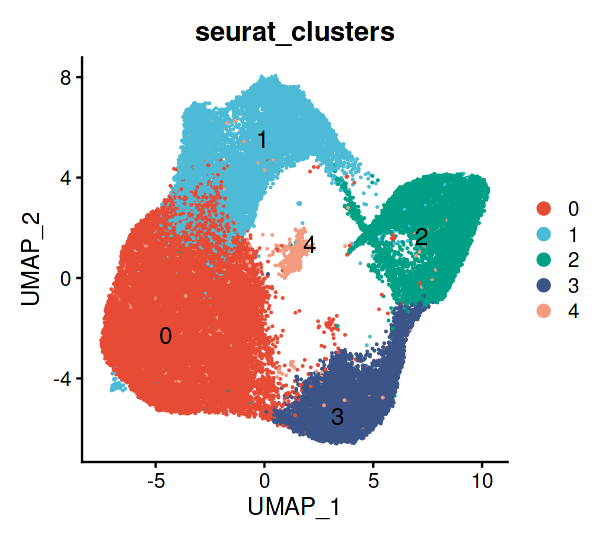

In [72]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(smc_micro, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')+scale_color_npg()

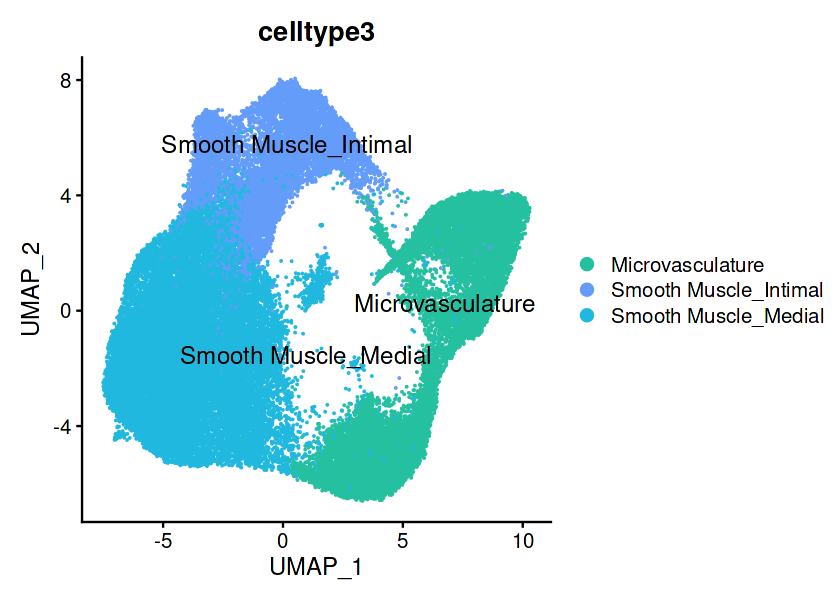

In [142]:
options(repr.plot.width=7 , repr.plot.height=5)
DimPlot(smc_micro, reduction = "umap", label =T, label.size = 5,repel = TRUE,group.by = 'celltype3')+
scale_color_manual(values=c('#24C0A0','#639CF9','#21B8E0'))

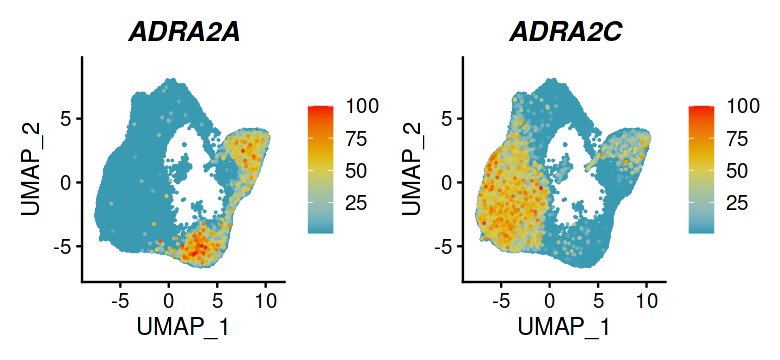

In [153]:
DefaultAssay(smc_micro)<-'RNA'
options(repr.plot.width=6.5, repr.plot.height=3)
FeaturePlot(smc_micro,features=c("ADRA2A","ADRA2C"),ncol=2,order=T, cols = pal,reduction = 'umap',min.cutoff=1)&theme( plot.title = element_text(face='bold.italic'))

In [140]:
czi

An object of class Seurat 
50048 features across 113304 samples within 3 assays 
Active assay: integrated (4000 features, 1841 variable features)
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

In [45]:
czi<-FindSubCluster(czi,c('Smooth Muscle','Microvasculature'), 'integrated_snn',subcluster.name = "smc_micro_sub", resolution = 0.1,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 49154
Number of edges: 1782263

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9523
Number of communities: 5
Elapsed time: 31 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



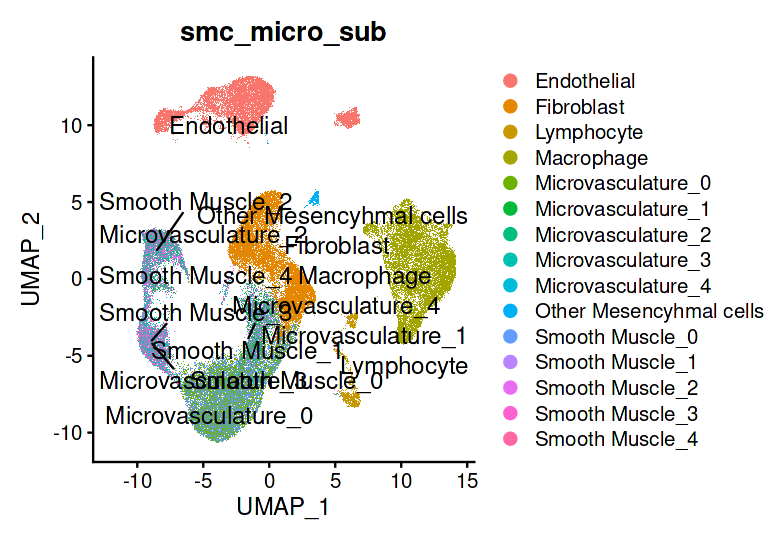

In [47]:
options(repr.plot.width=6.5, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'smc_micro_sub')

In [94]:
czi$celltype->Idents(czi)
subset(czi, idents='Smooth Muscle')->smc

In [135]:
DefaultAssay(smc)<-'integrated'
smc<-FindVariableFeatures(smc,verbose = F)
smc<-RunPCA(smc,verbose = F)
smc<-FindNeighbors(smc, dims = 1:20,verbose = F)
smc<-RunUMAP(smc, dims = 1:20,verbose = F)

In [136]:
smc<-FindClusters(smc, resolution=0.1, dims = 1:20,verbose = F)

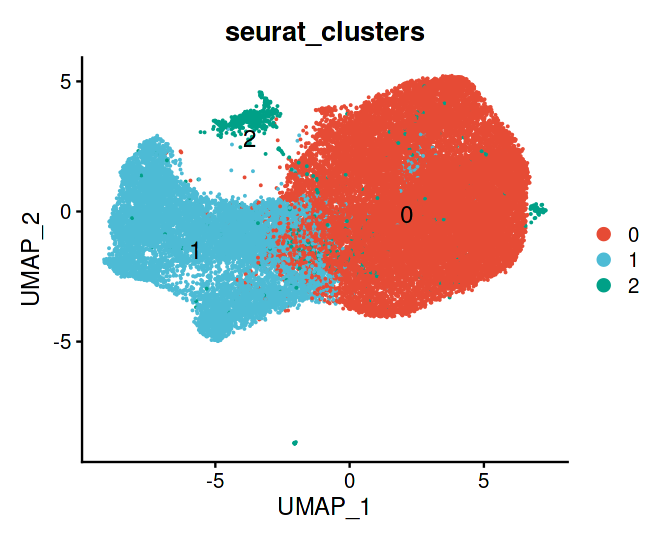

In [137]:
options(repr.plot.width=5.5, repr.plot.height=4.5)
DimPlot(smc, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')+scale_color_npg()

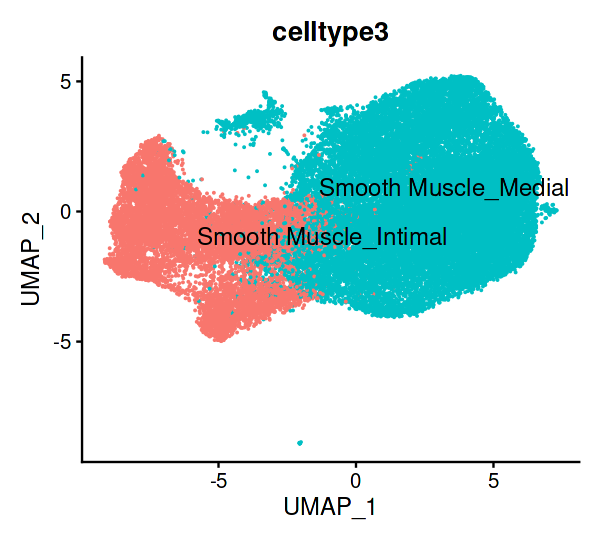

In [138]:
options(repr.plot.width=5 , repr.plot.height=4.5)
DimPlot(smc, reduction = "umap", label =T, label.size = 5,repel = TRUE,group.by = 'celltype3')+NoLegend()

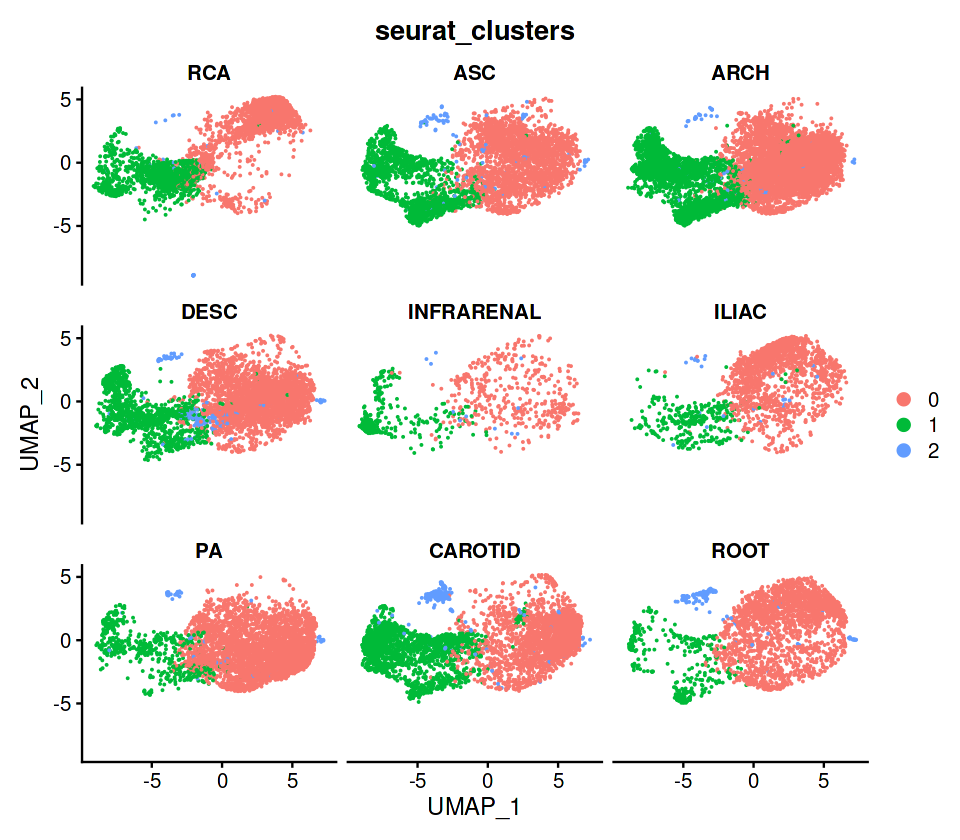

In [248]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(smc, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [139]:
ModScore=c('FN1','LUM','TNFRSF11B', "COL15A1", "IGFBP2", "ANXA2", "COL14A1", "COL12A1", "IGFBP6", "MMP2", "COL1A1", "COL3A1","COL1A2", "COL4A2", "COL5A1", "COL4A1", "COL5A2", "SERPINH1", "FMOD",
           "ECM1", "CSF1", "CLEC11A", "LRRC17", "FSTL3", "COL1A1", "TWSG1", "MGP", "COL5A2", "CDH11", "SOST", "GPM6B", "PDLIM7")
smc <- AddModuleScore(object = smc,features = list(ModScore),ctrl = 5,name = 'ModulationScore')

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


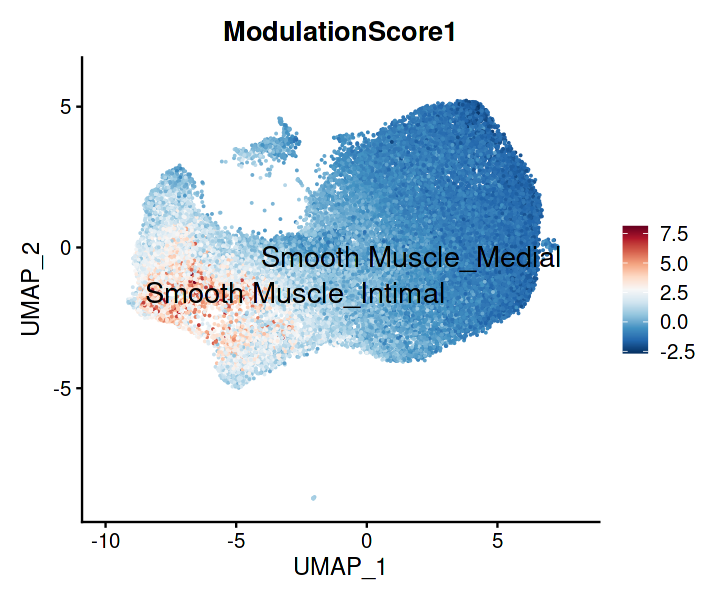

In [140]:
options(repr.plot.width=6, repr.plot.height=5)
Idents(smc)<-smc$celltype3
FeaturePlot(smc,features = "ModulationScore1", label = T, repel = TRUE,label.size = 6) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

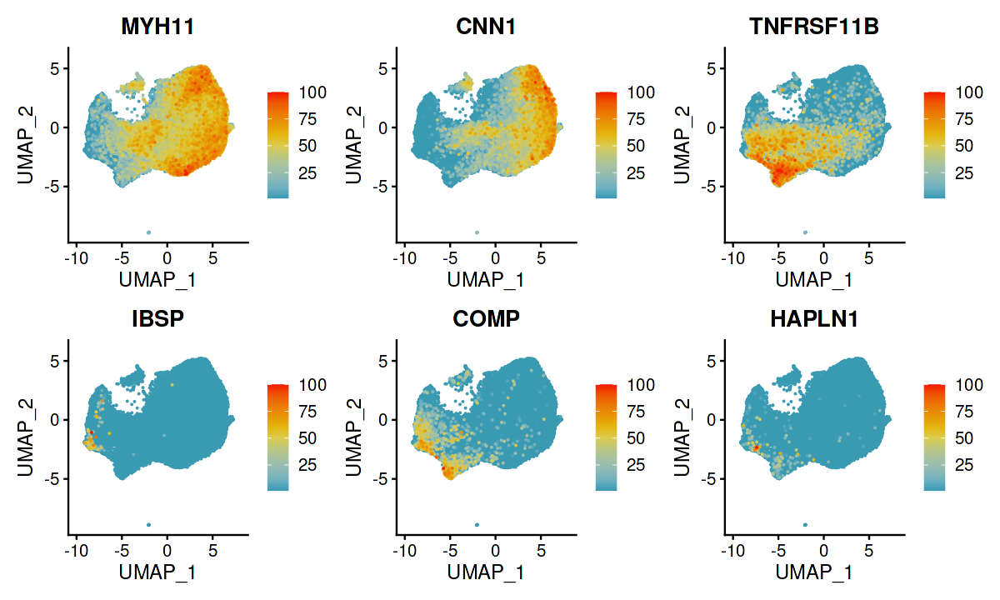

In [62]:
DefaultAssay(smc)<-'SCT'
options(repr.plot.width=10, repr.plot.height=6)
FeaturePlot(smc,features=c("MYH11","CNN1","TNFRSF11B","IBSP","COMP","HAPLN1"),ncol=3,order=T, cols = pal,min.cutoff = 2)

In [63]:
smc$seurat_clusters->Idents(smc)
FindAllMarkers(smc,assay = 'RNA',verbose = F,only.pos = T)->smc_cluster_marker
write.table(smc_cluster_marker,'Markers/smc_clu_mk.txt',sep = '\t',quote=F)

In [65]:
smc_cluster_marker[which(smc_cluster_marker$avg_log2FC>0.58&smc_cluster_marker$p_val_adj<0.05),]->smc_clu_mk_f1

In [74]:
AverageExpression(smc,features = smc_clu_mk_f1$gene)$SCT->dat

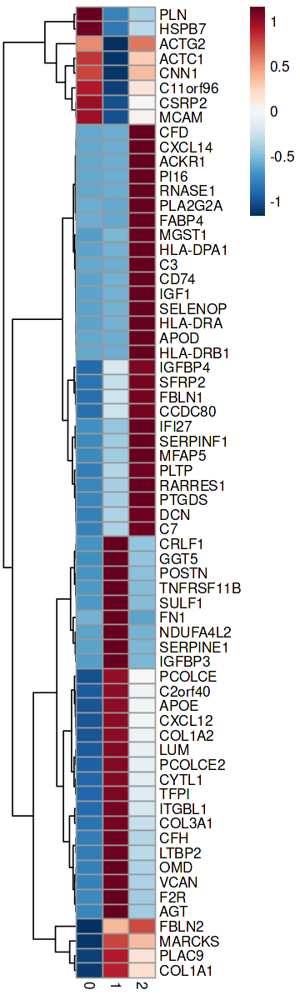

In [76]:
options(repr.plot.width=3, repr.plot.height=10)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,scale='row')

In [287]:
smc_cluster_marker[which(smc_cluster_marker$p_val_adj<0.05),]->smc_clu_sig

In [288]:
clu_gene <- split(smc_clu_sig$gene, smc_clu_sig$cluster)

In [289]:
go_res <- lapply(clu_gene, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='GO:BP',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

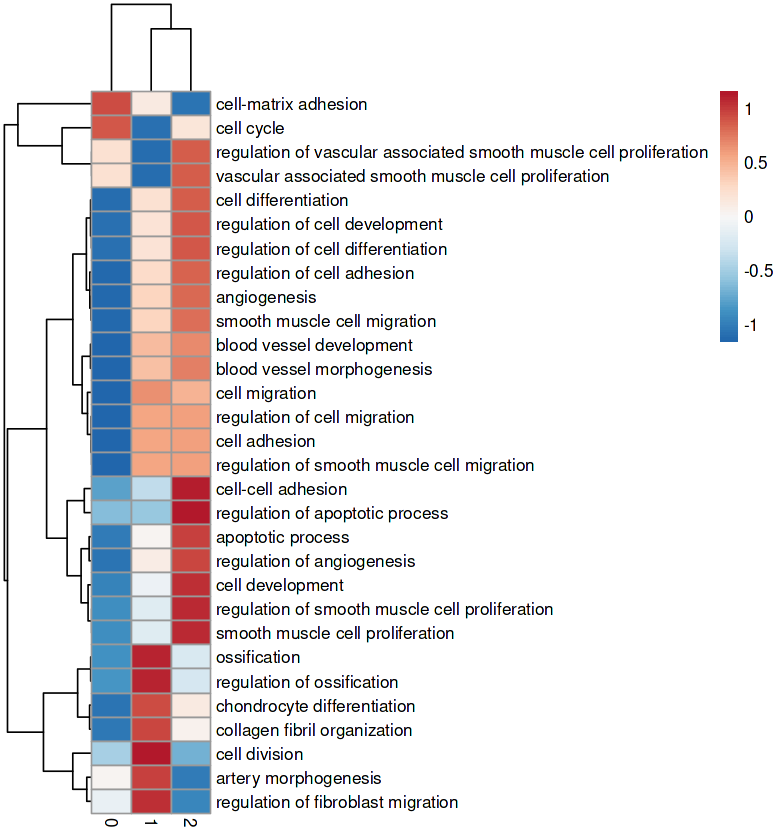

In [292]:
go_res_merge <- bind_rows(go_res, .id = "Source")
read.table('~/baldar/SplitPool/300Pilot2/cNMF/terms',sep='\t')->smc_term
go_res_merge[which(go_res_merge$term_name %in% smc_term$V1),]->go_res_merge_smc
dcast(go_res_merge_smc,term_name~Source,value.var = 'FoldEnrichment',fun.aggregate = mean)->dat_smc_go
dat_smc_go[is.na(dat_smc_go)] <- 0
dat_smc_go$term_name->rownames(dat_smc_go)
options(repr.plot.width=6.5, repr.plot.height=7)
pheatmap(dat_smc_go[,2:ncol(dat_smc_go)],cluster_rows =T,cluster_cols = T,show_rownames = T,scale='row',
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [157]:
go_res$`0`->c0_go
c0_go$cluster<-'0'
go_res$`1`->c1_go
c1_go$cluster<-'1'
go_res$`2`->c2_go
c2_go$cluster<-'2'

In [158]:
c0_go <- c0_go[order(c0_go$p_value), ]
c1_go <- c1_go[order(c1_go$p_value), ]
c2_go <- c2_go[order(c2_go$p_value), ]

In [163]:
rbind( head(c0_go, 10),head(c1_go, 10),head(c2_go, 10))->res

In [164]:
res[29, 11]<-' cell adhesion'
res[28, 11]<-' multicellular oraanismal process'
res[25, 11]<-' vasculature development'

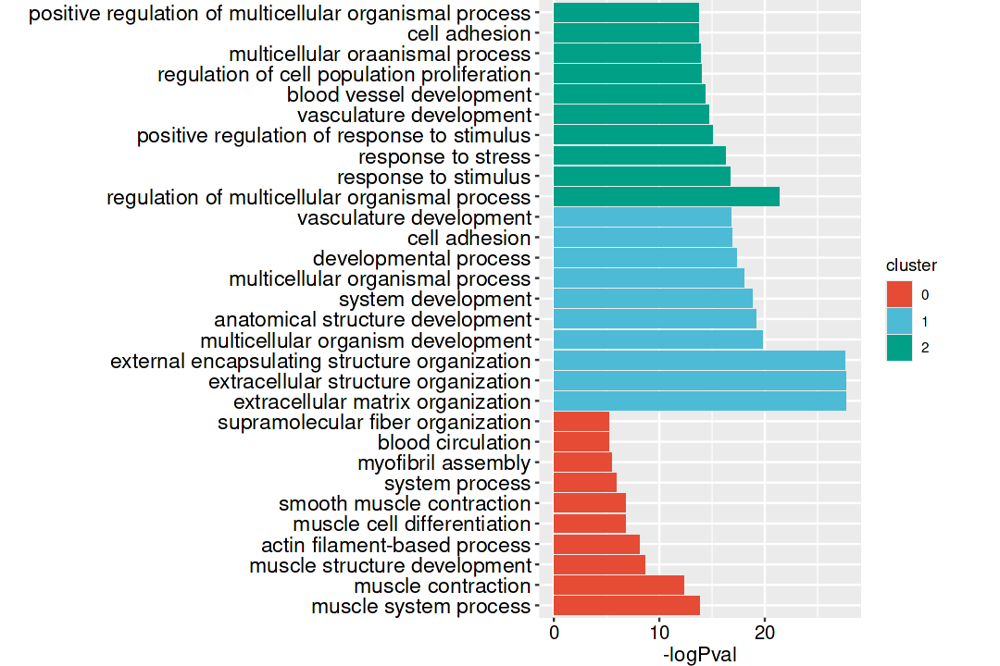

In [166]:
res<- res[seq(dim(res)[1],1),]
res<-transform(res,term_name=factor(term_name,levels=unique(term_name)))
options(repr.plot.width=9, repr.plot.height=6)
ggplot(res,aes(x=term_name,y=-log10(p_value),fill = cluster))+
	geom_bar(stat= 'identity')+
	coord_flip()+
	theme(
		axis.text.y = element_text(size=13.5,colour = 'black'),
		axis.title.x = element_text(size=13,colour = 'black'),
		axis.text.x = element_text(size=12,colour = 'black'),
		plot.margin = unit(c(0,0.5,0,0), "in")
		)+
	xlab("")+
	ylab("-logPval")+
    #scale_y_log10()+
    scale_fill_npg()

In [177]:
Idents(smc)<-smc$celltype3

In [178]:
FindMarkers(smc, ident.1='Smooth Muscle_Intimal',ident.2='Smooth Muscle_Medial',only.pos = F,assay = 'RNA',verbose = F)->smc_im_deg
write.table(smc_im_deg,'Markers/smc_im_deg.txt',sep='\t',quote = F)

In [186]:
czi$celltype->Idents(czi)
subset(czi, idents='Microvasculature')->micro

In [187]:
DefaultAssay(micro)<-'integrated'
micro<-FindVariableFeatures(micro,verbose = F)
micro<-RunPCA(micro,verbose = F)
micro<-FindNeighbors(micro, dims = 1:20,verbose = F)
micro<-RunUMAP(micro, dims = 1:20,verbose = F)

Warning message:
“Not all features provided are in this Assay object, removing the following feature(s): MROH8, GPHA2, HLA-DQA2, CRABP1, HIST1H3B, CDH7, WIF1, SOX10, SPRR2F, LYPD2, AADAC, SLC1A2, CYB5D2, AC010319.3, KIF1A, FOXD3-AS1, MAG, DNAJC18, GFRA3, NKX6-2, LGALS2, FSTL5, HCN1, FRMD6-AS1, TRIM63, NPY, TPSD1, DIRC3, Z95114.1, PEX5L, LINC01748, SYT10, CCL22, KIF25, AC120193.1, KCNG1, AGTR2, SIX3, UPK3B, CDH1, DCX, OR51M1, XIST, SLC6A4, AC022081.1, PMEL, GPC5-AS1, PROK1, CTXND1, BIRC7, POU3F2, C10orf82, TNFSF4, HIST1H3F, ZNF536, AC116345.1, XCR1, TMEM196, LINC00337, PI3, SVOPL, SLITRK6, PRND, PCDH8, ANKRD30B, MSTN, RHAG, KLF3, POU3F4, AL121936.1, KRT1, DUOXA2, RRP12, SIGLEC6, TMEM215, HIST1H3G, AC008080.4, AC004156.1, GRIK3, TRH, SCT, EIF4E, SLC27A6, MMP10, GATA1, ZNF683, CCK, LINC02502, AC097103.2, NPTX1, CAPN6, AC008105.3, CD22, RD3, ETV3, CYB561, DEC1, COL22A1, KLK6, RASGEF1C, CD207, ARHGAP11A, AC015660.2, ASCL1, CYP2J2, CLEC3A, AL662860.1, FADS6, AL603756.1, STAP1, IFNG, BDKRB1, 

In [191]:
micro<-FindClusters(micro, resolution=0.05, dims = 1:20,verbose = F)

Warning message:
“The following arguments are not used: dims”
Warning message:
“The following arguments are not used: dims”


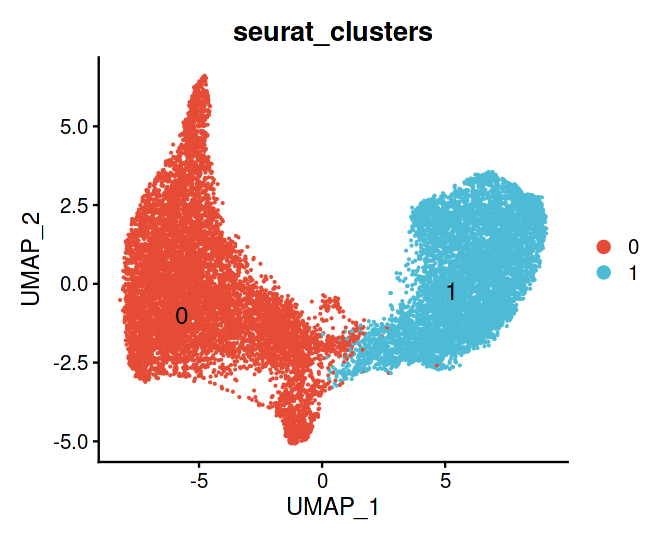

In [192]:
options(repr.plot.width=5.5, repr.plot.height=4.5)
DimPlot(micro, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')+scale_color_npg()

In [197]:
micro$seurat_clusters->Idents(micro)
FindMarkers(micro, ident.1='0',ident.2='1',only.pos = F,assay = 'RNA',verbose = F)->micro_clu_deg
write.table(micro_clu_deg,'Markers/micro_clu_mk.txt',sep='\t',quote = F)

In [72]:
read.table('Markers/micro_clu_mk.txt',sep='\t',fill=NA,header=T)->micro_clu_deg
micro_clu_deg <- micro_clu_deg[order(-micro_clu_deg$avg_log2FC), ]  
micro_clu_deg$Rank <- 1:nrow(micro_clu_deg)

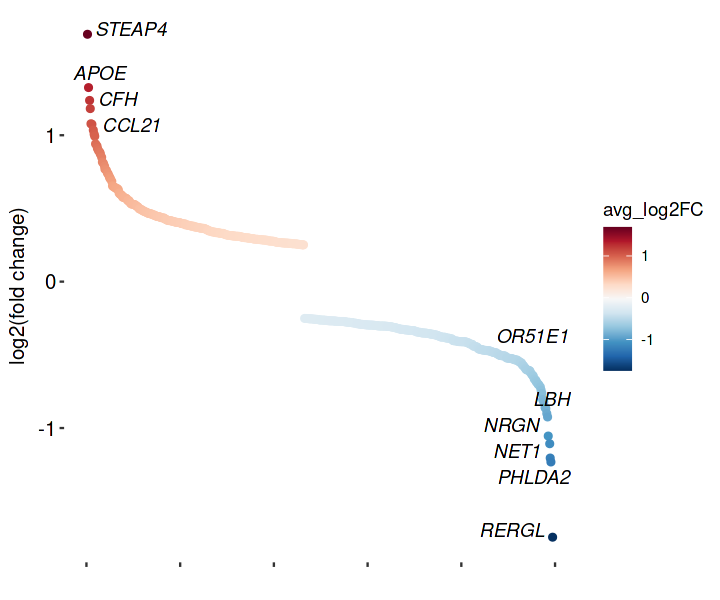

In [128]:
options(repr.plot.width=6, repr.plot.height=5)
ggplot(micro_clu_deg,aes(x=Rank,y=avg_log2FC,label = label))+
    geom_jitter(aes(color=avg_log2FC))+
    geom_text_repel(max.overlaps = 100,fontface = "italic")+
     scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
    theme_classic() +
	theme( 
		axis.text.y = element_text(size=12,colour = 'black'),
		axis.title = element_text(size=12,colour = 'black'),
		axis.text.x =element_blank(),
        panel.grid = element_blank(),
        axis.line = element_blank()
	)+
	xlab("")+
	ylab("log2(fold change)")

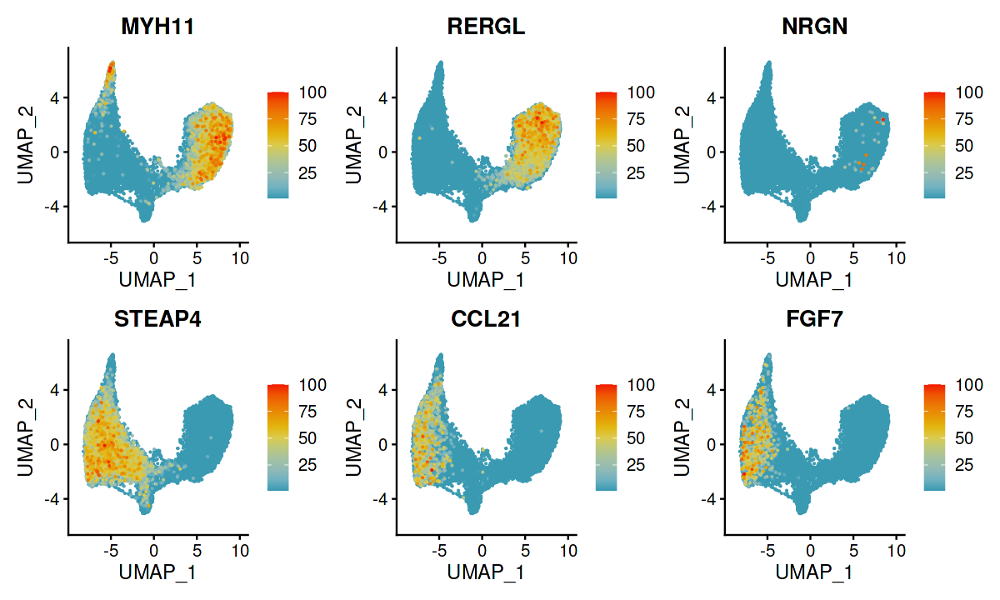

In [219]:
DefaultAssay(micro)<-'SCT'
options(repr.plot.width=10, repr.plot.height=6)
FeaturePlot(micro,features=c("MYH11","RERGL","NRGN","STEAP4","CCL21","FGF7"),ncol=3,order=T, cols = pal,min.cutoff = 3)

In [215]:
micro_clu_deg[which(micro_clu_deg$p_val_adj<0.05),]->micro_clu_sig
clu_gene <- split(micro_clu_sig$label, micro_clu_sig$avg_log2FC>0)
go_res <- lapply(clu_gene, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='GO:BP',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

In [220]:
go_res$`FALSE`->c1_go
c1_go$cluster<-'1'
go_res$`TRUE`->c0_go
c0_go$cluster<-'0'

In [224]:
c0_go <- c0_go[order(c0_go$p_value), ]
c1_go <- c1_go[order(c1_go$p_value), ]
rbind(head(c0_go, 10),head(c1_go, 10))->res

In [226]:
res[10, 11]<-' biological regulation'
res[6, 11]<-' anatomical structure development'
res[4, 11]<-' regulation of biological process'

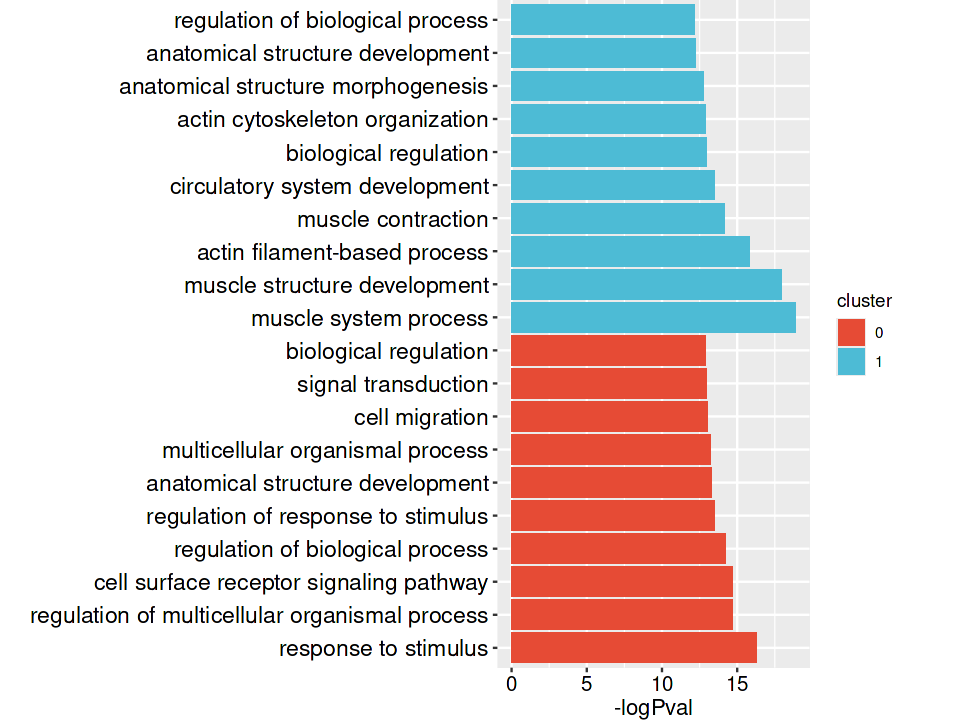

In [228]:
res<- res[seq(dim(res)[1],1),]
res<-transform(res,term_name=factor(term_name,levels=unique(term_name)))
options(repr.plot.width=8, repr.plot.height=6)
ggplot(res,aes(x=term_name,y=-log10(p_value),fill = cluster))+
	geom_bar(stat= 'identity')+
	coord_flip()+
	theme(
		axis.text.y = element_text(size=13.5,colour = 'black'),
		axis.title.x = element_text(size=13,colour = 'black'),
		axis.text.x = element_text(size=12,colour = 'black'),
		plot.margin = unit(c(0,0.5,0,0), "in")
		)+
	xlab("")+
	ylab("-logPval")+
    #scale_y_log10()+
    scale_fill_npg()

In [232]:
go_res_merge <- bind_rows(go_res, .id = "Source")

In [234]:
read.table('~/baldar/SplitPool/300Pilot2/cNMF/terms',sep='\t')->smc_term
go_res_merge[which(go_res_merge$term_name %in% smc_term$V1),]->go_res_merge_smc
dcast(go_res_merge_smc,term_name~Source,value.var = 'FoldEnrichment',fun.aggregate = mean)->dat_smc_go
dat_smc_go[is.na(dat_smc_go)] <- 0
dat_smc_go$term_name->rownames(dat_smc_go)

In [236]:
colnames(dat_smc_go)<-c('term_name','0','1')

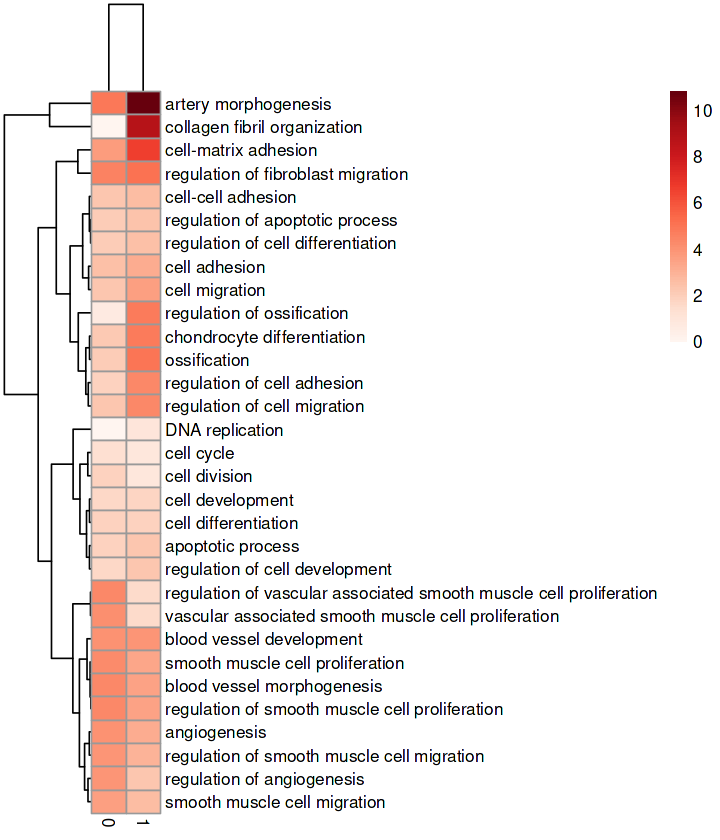

In [245]:
options(repr.plot.width=6, repr.plot.height=7)
pheatmap(dat_smc_go[,2:ncol(dat_smc_go)],cluster_rows =T,cluster_cols = T,show_rownames = T,scale='none',
         color=colorRampPalette(brewer.pal(9,"Reds"))(100))

In [141]:
czi$celltype->Idents(czi)
subset(czi, idents='Fibroblast')->fb

In [142]:
DefaultAssay(fb)<-'integrated'
fb<-FindVariableFeatures(fb,verbose = F)
fb<-RunPCA(fb,verbose = F)
fb<-FindNeighbors(fb, dims = 1:20,verbose = F)
fb<-RunUMAP(fb, dims = 1:20,verbose = F)

In [143]:
fb<-FindClusters(fb, resolution=0.2, dims = 1:20,verbose = F)

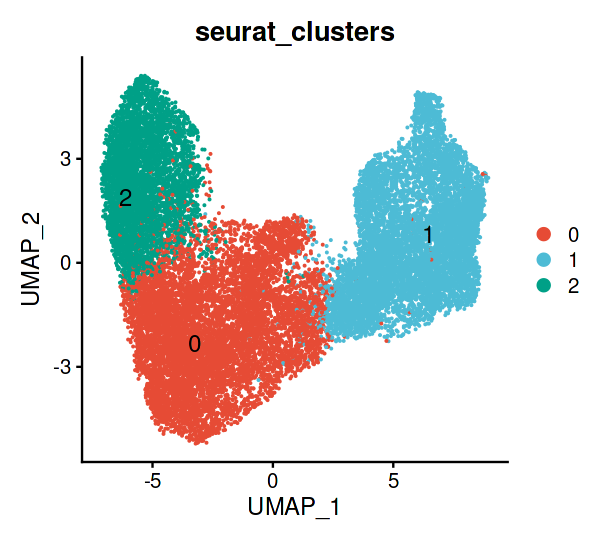

In [144]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(fb, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')+scale_color_npg()

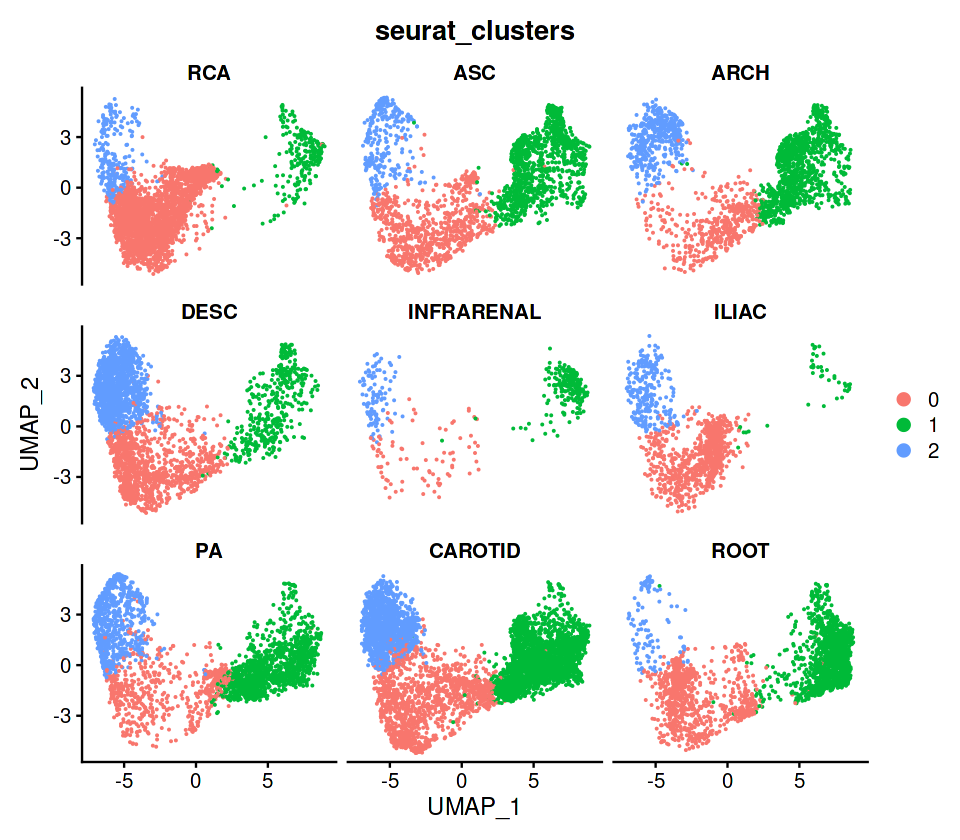

In [145]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(fb, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [257]:
fb$seurat_clusters->Idents(fb)
FindAllMarkers(fb,assay = 'RNA',verbose = F,only.pos = T)->fb_cluster_marker
write.table(fb_cluster_marker,'Markers/fb_clu_mk.txt',sep = '\t',quote=F)

In [146]:
read.table('Markers/fb_clu_mk.txt',sep = '\t',header=T)->fb_cluster_marker

In [147]:
fb_cluster_marker[which(fb_cluster_marker$avg_log2FC>0.58&fb_cluster_marker$p_val_adj<0.05),]->fb_clu_mk_f1
AverageExpression(fb,features = fb_clu_mk_f1$gene)$SCT->dat

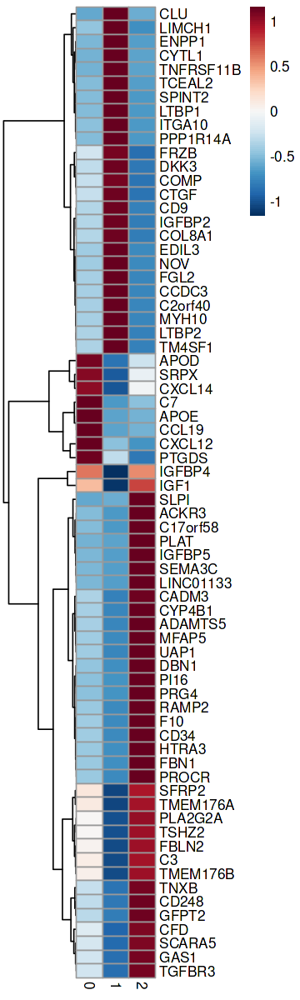

In [148]:
options(repr.plot.width=3, repr.plot.height=10)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,scale='row')

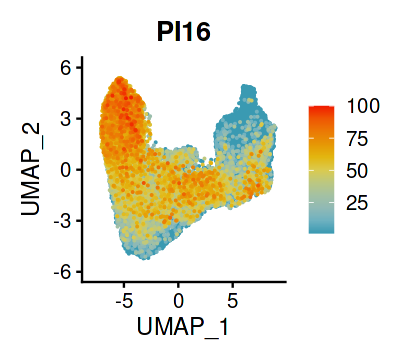

In [120]:
DefaultAssay(fb)<-'SCT'
options(repr.plot.width=3.33, repr.plot.height=3)
FeaturePlot(fb,features=c("PI16"),ncol=1,order=T, cols = pal,min.cutoff = 0.1)

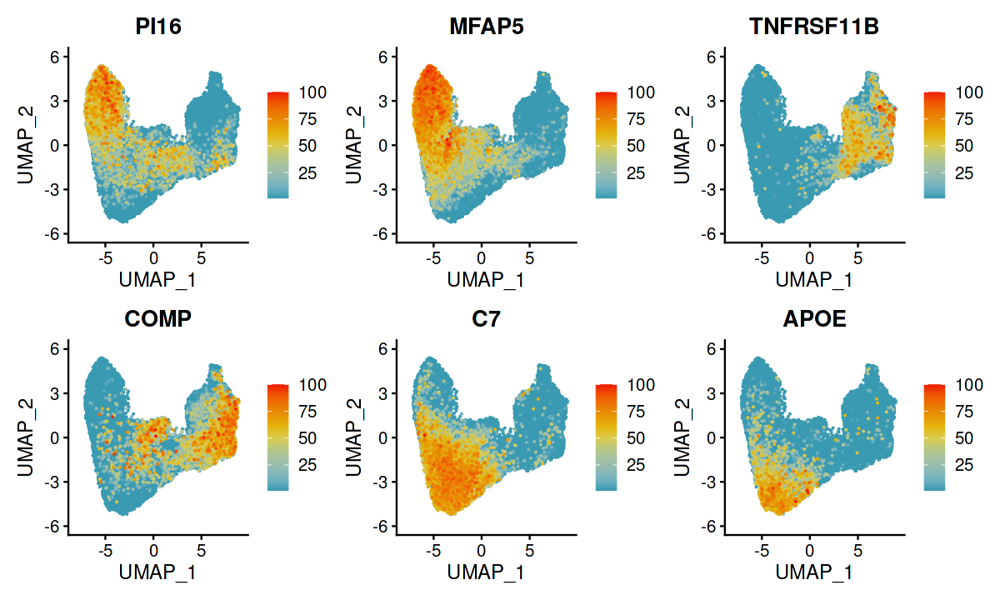

In [123]:
DefaultAssay(fb)<-'SCT'
options(repr.plot.width=10, repr.plot.height=6)
FeaturePlot(fb,features=c("PI16","MFAP5","TNFRSF11B","COMP","C7","APOE"),ncol=3,order=T, cols = pal,min.cutoff = 2)

In [149]:
fb_cluster_marker[which(fb_cluster_marker$p_val_adj<0.05),]->fb_clu_sig
clu_gene <- split(fb_clu_sig$gene, fb_clu_sig$cluster)
go_res <- lapply(clu_gene, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='GO:BP',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

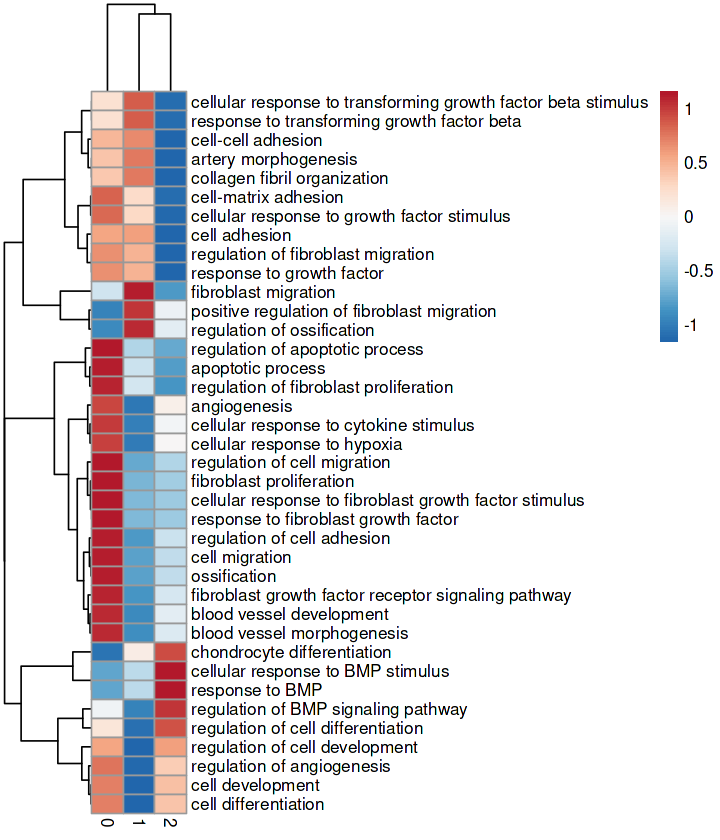

In [150]:
go_res_merge <- bind_rows(go_res, .id = "Source")
read.table('~/baldar/SplitPool/300Pilot2/Markers/terms_fb',sep='\t')->fb_term
go_res_merge[which(go_res_merge$term_name %in% fb_term$V1),]->go_res_merge_fb
dcast(go_res_merge_fb,term_name~Source,value.var = 'FoldEnrichment',fun.aggregate = mean)->dat_fb_go
dat_fb_go[is.na(dat_fb_go)] <- 0
dat_fb_go$term_name->rownames(dat_fb_go)
options(repr.plot.width=6, repr.plot.height=7)
pheatmap(dat_fb_go[,2:ncol(dat_fb_go)],cluster_rows =T,cluster_cols = T,show_rownames = T,scale='row',
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

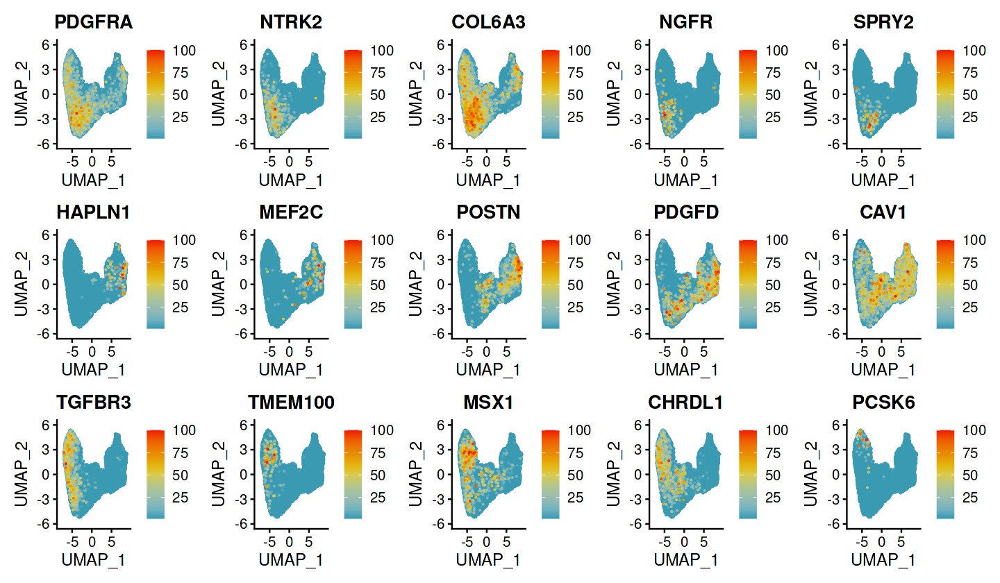

In [168]:
DefaultAssay(fb)<-'SCT'
options(repr.plot.width=12, repr.plot.height=7)
FeaturePlot(fb,features=c("PDGFRA","NTRK2","COL6A3","NGFR", "SPRY2", 
                         'HAPLN1', 'MEF2C', 'POSTN', 'PDGFD', 'CAV1',
                         'TGFBR3', 'TMEM100', 'MSX1', 'CHRDL1','PCSK6'),ncol=5,order=T, cols = pal,min.cutoff = 2)

In [283]:
go_res$`0`->c0_go
c0_go$cluster<-'0'
go_res$`1`->c1_go
c1_go$cluster<-'1'
go_res$`2`->c2_go
c2_go$cluster<-'2'
c0_go <- c0_go[order(c0_go$p_value), ]
c1_go <- c1_go[order(c1_go$p_value), ]
c2_go <- c2_go[order(c2_go$p_value), ]
rbind( head(c0_go, 10),head(c1_go, 10),head(c2_go, 10))->res

In [285]:
res[19, 11]<-' developmental process'
res[16, 11]<-' anatomical structure morphogenesis'
res[8, 11]<-' circulatory system development'
res[1, 11]<-' vasculature development'
res[10, 11]<-' blood vessel development'
res[5, 11]<-' tube development'

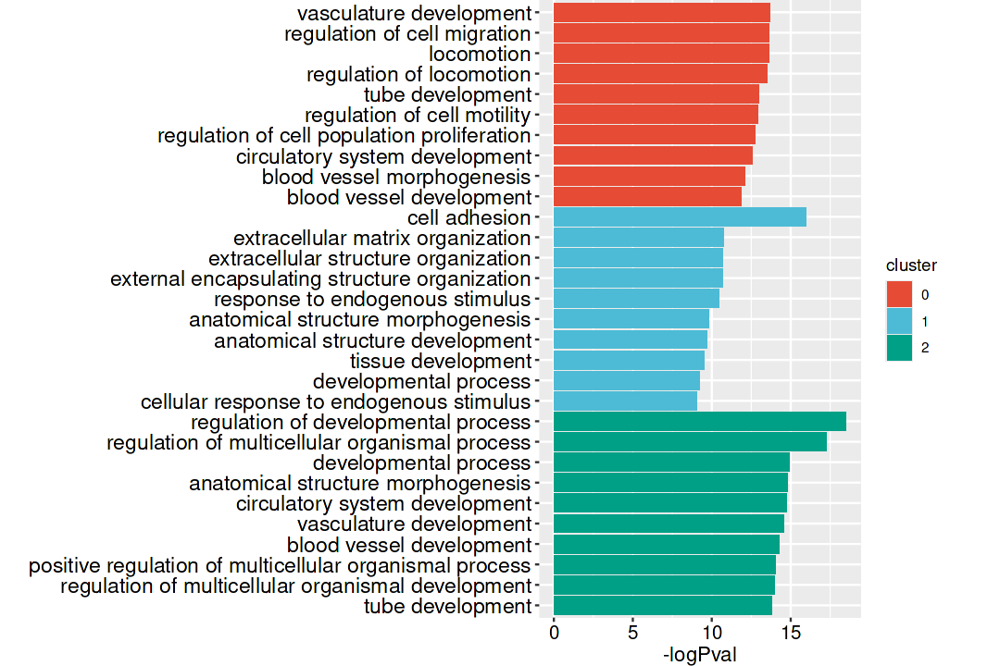

In [286]:
res<- res[seq(dim(res)[1],1),]
res<-transform(res,term_name=factor(term_name,levels=unique(term_name)))
options(repr.plot.width=9, repr.plot.height=6)
ggplot(res,aes(x=term_name,y=-log10(p_value),fill = cluster))+
	geom_bar(stat= 'identity')+
	coord_flip()+
	theme(
		axis.text.y = element_text(size=13.5,colour = 'black'),
		axis.title.x = element_text(size=13,colour = 'black'),
		axis.text.x = element_text(size=12,colour = 'black'),
		plot.margin = unit(c(0,0.5,0,0), "in")
		)+
	xlab("")+
	ylab("-logPval")+
    #scale_y_log10()+
    scale_fill_npg()

In [299]:
czi$celltype2->Idents(czi)
subset(czi, idents='Endothelial2')->ec2

In [300]:
DefaultAssay(ec2)<-'integrated'
ec2<-FindVariableFeatures(ec2,verbose = F)
ec2<-RunPCA(ec2,verbose = F)
ec2<-FindNeighbors(ec2, dims = 1:20,verbose = F)
ec2<-RunUMAP(ec2, dims = 1:20,verbose = F)

Warning message:
“Not all features provided are in this Assay object, removing the following feature(s): MROH8, GPHA2, HLA-DQA2, CRABP1, HIST1H3B, CDH7, WIF1, SOX10, SPRR2F, LYPD2, AADAC, SLC1A2, CYB5D2, AC010319.3, KIF1A, FOXD3-AS1, MAG, DNAJC18, GFRA3, NKX6-2, LGALS2, FSTL5, HCN1, FRMD6-AS1, TRIM63, NPY, TPSD1, DIRC3, Z95114.1, PEX5L, LINC01748, SYT10, CCL22, KIF25, AC120193.1, KCNG1, AGTR2, SIX3, UPK3B, CDH1, DCX, OR51M1, XIST, SLC6A4, AC022081.1, PMEL, GPC5-AS1, PROK1, CTXND1, BIRC7, POU3F2, C10orf82, TNFSF4, HIST1H3F, ZNF536, AC116345.1, XCR1, TMEM196, LINC00337, PI3, SVOPL, SLITRK6, PRND, PCDH8, ANKRD30B, MSTN, RHAG, KLF3, POU3F4, AL121936.1, KRT1, DUOXA2, RRP12, SIGLEC6, TMEM215, HIST1H3G, AC008080.4, AC004156.1, GRIK3, TRH, SCT, EIF4E, SLC27A6, MMP10, GATA1, ZNF683, CCK, LINC02502, AC097103.2, NPTX1, CAPN6, AC008105.3, CD22, RD3, ETV3, CYB561, DEC1, COL22A1, KLK6, RASGEF1C, CD207, ARHGAP11A, AC015660.2, ASCL1, CYP2J2, CLEC3A, AL662860.1, FADS6, AL603756.1, STAP1, IFNG, BDKRB1, 

In [301]:
ec2<-FindClusters(ec2, resolution=0.1, dims = 1:20,verbose = F)

Warning message:
“The following arguments are not used: dims”
Warning message:
“The following arguments are not used: dims”


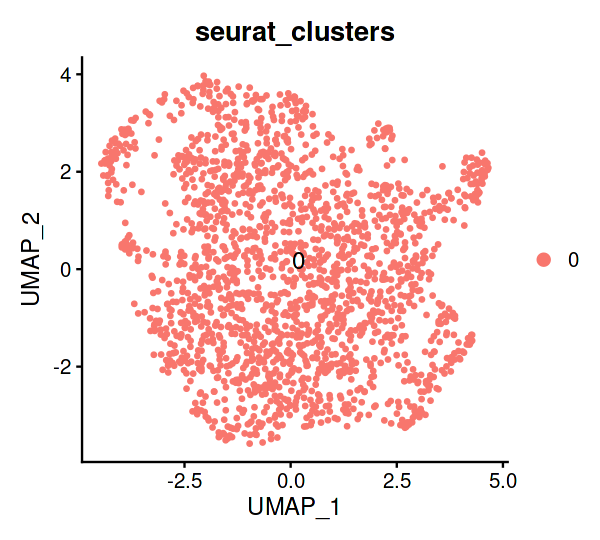

In [303]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(ec2, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')

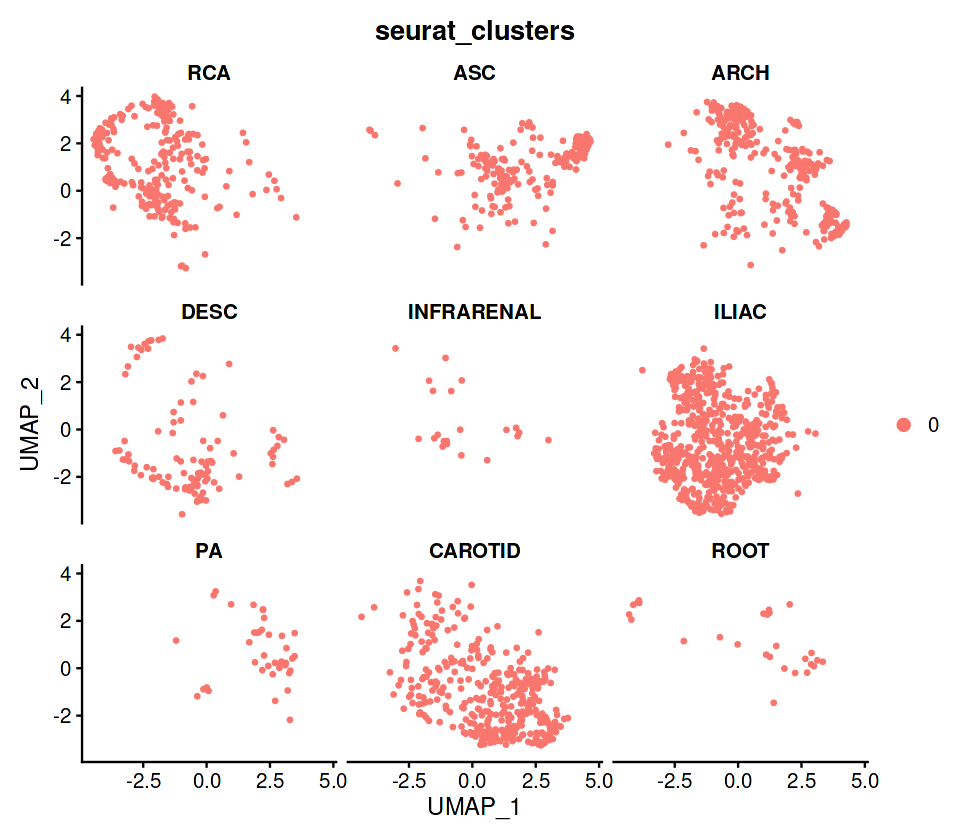

In [304]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(ec2, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [217]:
as.data.frame(table(czi$celltype2, czi$Site,czi$Pt))->cell_num

In [218]:
cell_num <- cell_num %>%
  group_by(Var3, Var2) %>%
  mutate(Freq = replace_na(Freq, 0), 
         percent = Freq / sum(Freq, na.rm = TRUE) * 100) %>%
  ungroup()

In [229]:
as.data.frame(cell_num)->cell_num

In [236]:
write.table(cell_num,'Meta/cell_num.txt',sep='\t',quote=F,row.names = F)

In [35]:
result <- cell_num %>%
  group_by(Var1) %>%
  summarise(
    mean_percent = mean(percent, na.rm = TRUE),
    sd_percent = sd(percent, na.rm = TRUE)
  ) %>%
  ungroup()

In [36]:
result

Var1,mean_percent,sd_percent
<fct>,<dbl>,<dbl>
Endothelial1,14.53608,8.136069
Endothelial2,1.95321,4.318876
Fibroblast,18.86829,10.907813
Lymphocyte,2.26970,2.106445
Microvasculature,13.75383,7.519419
Smooth Muscle,28.02765,15.562100
Macrophage,20.59124,12.387652


In [37]:
cell_num[cell_num$Var2=="RCA",]->cell_num_rca

In [38]:
cell_num_rca %>%
  group_by(Var1) %>%
  summarise(
    mean_percent = mean(percent, na.rm = TRUE),
    sd_percent = sd(percent, na.rm = TRUE)
  ) %>%
  ungroup()

Var1,mean_percent,sd_percent
<fct>,<dbl>,<dbl>
Endothelial1,13.907039,5.447304
Endothelial2,1.396875,1.586742
Fibroblast,19.618575,12.602542
Lymphocyte,4.585147,3.550586
Microvasculature,12.700225,6.629732
Smooth Muscle,25.769920,18.652257
Macrophage,22.022219,6.712745


In [39]:
unique(cell_num$Var2)

[1] RCA        ASC        ARCH       DESC       INFRARENAL ILIAC      PA        
[8] CAROTID    ROOT      
Levels: RCA ASC ARCH DESC INFRARENAL ILIAC PA CAROTID ROOT

In [50]:
cell_num[cell_num$Var2=="ROOT",]->cell_num_aorta
cell_num_aorta %>%
  group_by(Var1) %>%
  summarise(
    mean_percent = mean(percent, na.rm = TRUE),
    sd_percent = sd(percent, na.rm = TRUE)
  ) %>%
  ungroup()

Var1,mean_percent,sd_percent
<fct>,<dbl>,<dbl>
Endothelial1,13.9138211,5.85274283
Endothelial2,0.3176968,0.40244738
Fibroblast,35.4537662,1.29526781
Lymphocyte,0.4816918,0.07224597
Microvasculature,9.0286996,5.59425026
Smooth Muscle,33.3964998,17.10923573
Macrophage,7.4078247,4.84166818


In [111]:
cell_num <- cell_num %>%
  group_by(Var3, Var2) %>%
  mutate(Freq = replace_na(Freq, 0), 
         percent = Freq / sum(Freq, na.rm = TRUE) * 100) %>%
  ungroup() %>%
  filter(Var1 == "Endothelial2") 
cell_num[which(cell_num$Var2 %in% c('RCA', 'ASC', 'DESC',  'PA', 'CAROTID')),]->cell_num
df_mean <- cell_num %>%
  group_by(Var2) %>%
  summarise(mean_percent = mean(percent, na.rm = TRUE))
df_mean[which(df_mean$Var2 %in% c('RCA', 'ASC', 'DESC',  'PA', 'CAROTID')),]->df_mean

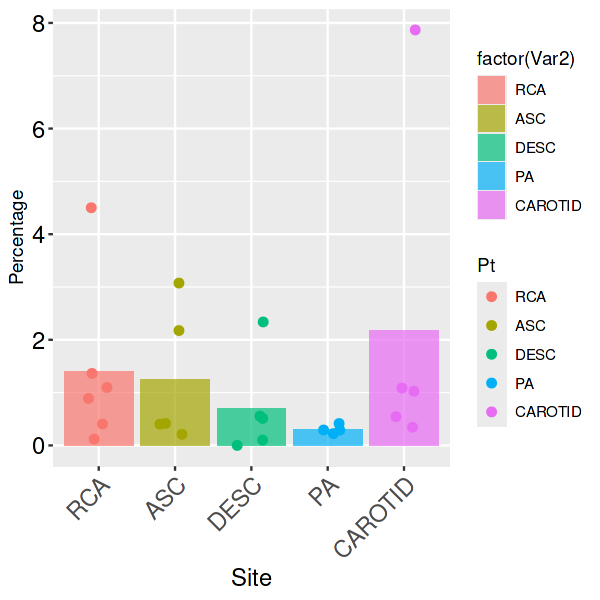

In [113]:
options(repr.plot.width=5, repr.plot.height=5)
ggplot(cell_num, aes(x = Var2, y = percent)) +
  geom_bar(data = df_mean, aes(y = mean_percent,fill = factor(Var2)), stat = "identity",  alpha = 0.7) +
  geom_point(aes(color = factor(Var2)), position = position_jitter(width = 0.2), size = 2) + 
  labs(x = "Site", y = "Percentage", color = "Pt") +
  	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [323]:
dcast(cell_num,Var1~Var2)->cell_num
rownames(cell_num)<-cell_num$Var1
cell_num[,2:ncol(cell_num)]->cell_num

Using Freq as value column: use value.var to override.



In [324]:
cell_per <- sweep(cell_num, 2, colSums(cell_num), FUN = "/") * 100

In [328]:
melt(cell_per[2,])->ec2_per

No id variables; using all as measure variables



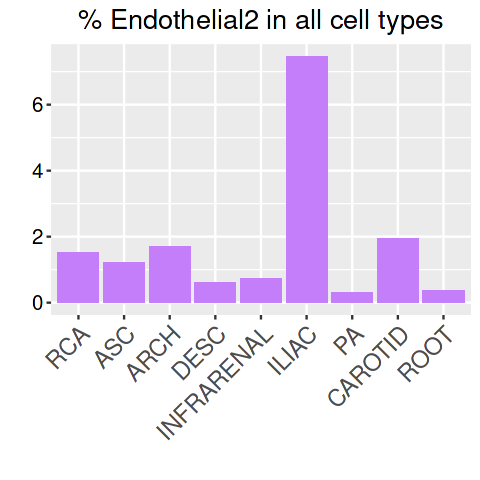

In [330]:
as.data.frame(table(ec2$Site))->ec2_num
options(repr.plot.width=4, repr.plot.height=4)
ggplot(ec2_per, aes(x=variable, y=value)) + 
	geom_bar(stat= 'identity',fill='#C57EF9')+
	labs(x="",y='',
		title="% Endothelial2 in all cell types")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [333]:
ec2$Site->Idents(ec2)
FindAllMarkers(ec2,assay = 'RNA',verbose = F,only.pos = T)->ec2_site_marker
write.table(ec2_site_marker,'Markers/ec2_site_mk.txt',sep = '\t',quote=F)

In [334]:
ec2_site_marker[which(ec2_site_marker$avg_log2FC>0.58&ec2_site_marker$p_val_adj<0.05),]->ec2_site_mk_f1
AverageExpression(ec2,features = ec2_site_mk_f1$gene)$SCT->dat

Warning message:
“The following 1 features were not found in the integrated assay: LYPD2”


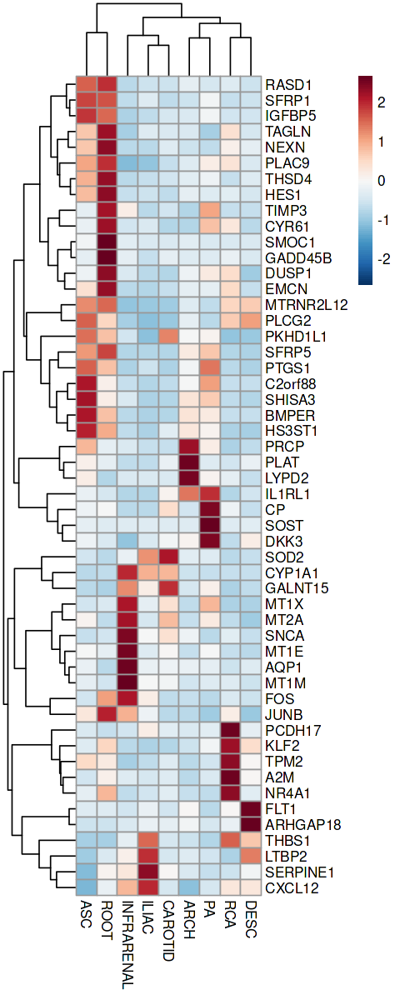

In [340]:
options(repr.plot.width=4, repr.plot.height=10)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = T,scale='row')

In [341]:
ec2_site_marker[which(ec2_site_marker$p_val_adj<0.05),]->ec2_site_sig
clu_gene <- split(ec2_site_sig$gene, ec2_site_sig$cluster)
go_res <- lapply(clu_gene, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='GO:BP',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

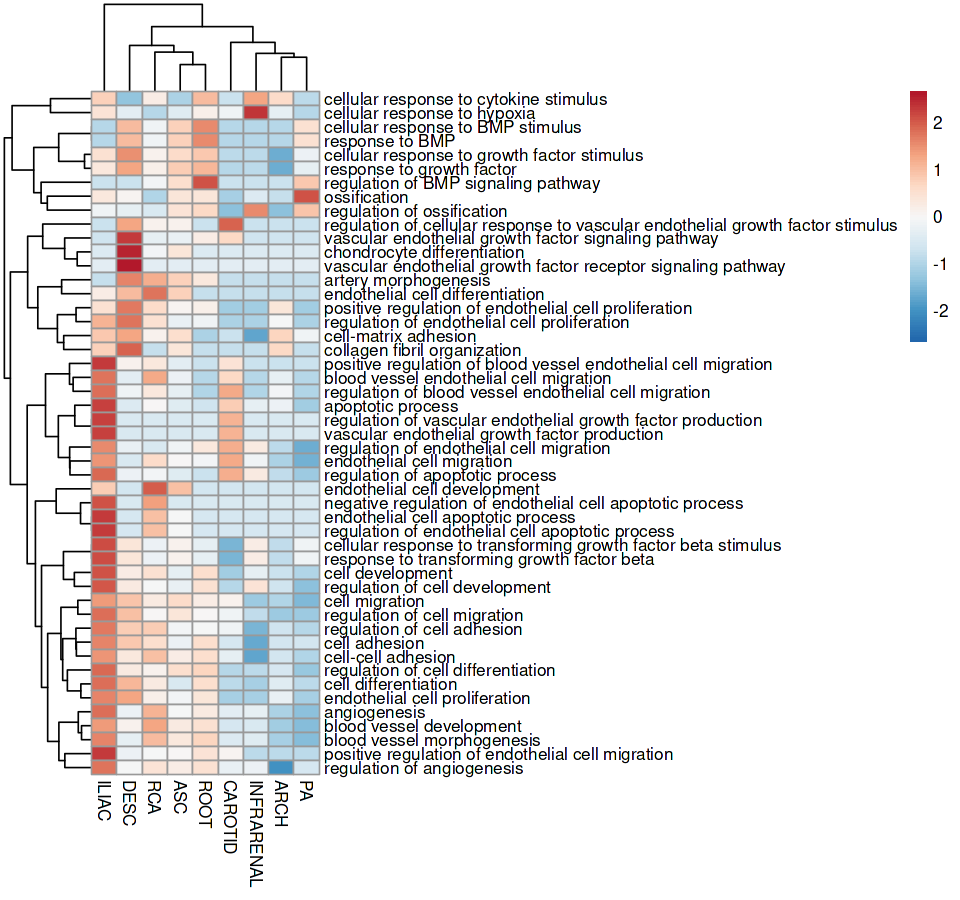

In [344]:
go_res_merge <- bind_rows(go_res, .id = "Source")
read.table('~/baldar/SplitPool/300Pilot2/Markers/terms_ec',sep='\t')->ec_term
go_res_merge[which(go_res_merge$term_name %in% ec_term$V1),]->go_res_merge_ec
dcast(go_res_merge_ec,term_name~Source,value.var = 'FoldEnrichment',fun.aggregate = mean)->dat_ec_go
dat_ec_go[is.na(dat_ec_go)] <- 0
dat_ec_go$term_name->rownames(dat_ec_go)
options(repr.plot.width=8, repr.plot.height=7.5)
pheatmap(dat_ec_go[,2:ncol(dat_ec_go)],cluster_rows =T,cluster_cols = T,show_rownames = T,scale='row',
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [169]:
czi$celltype2->Idents(czi)
subset(czi, idents='Endothelial1')->ec1

In [170]:
DefaultAssay(ec1)<-'integrated'
ec1<-FindVariableFeatures(ec1,verbose = F)
ec1<-RunPCA(ec1,verbose = F)
ec1<-FindNeighbors(ec1, dims = 1:20,verbose = F)
ec1<-RunUMAP(ec1, dims = 1:20,verbose = F)

Warning message:
“Not all features provided are in this Assay object, removing the following feature(s): MROH8, GPHA2, HLA-DQA2, CRABP1, HIST1H3B, CDH7, WIF1, SOX10, SPRR2F, LYPD2, AADAC, SLC1A2, CYB5D2, AC010319.3, KIF1A, FOXD3-AS1, MAG, DNAJC18, GFRA3, NKX6-2, LGALS2, FSTL5, HCN1, FRMD6-AS1, TRIM63, NPY, TPSD1, DIRC3, Z95114.1, PEX5L, LINC01748, SYT10, CCL22, KIF25, AC120193.1, KCNG1, AGTR2, SIX3, UPK3B, CDH1, DCX, OR51M1, XIST, SLC6A4, AC022081.1, PMEL, GPC5-AS1, PROK1, CTXND1, BIRC7, POU3F2, C10orf82, TNFSF4, HIST1H3F, ZNF536, AC116345.1, XCR1, TMEM196, LINC00337, PI3, SVOPL, SLITRK6, PRND, PCDH8, ANKRD30B, MSTN, RHAG, KLF3, POU3F4, AL121936.1, KRT1, DUOXA2, RRP12, SIGLEC6, TMEM215, HIST1H3G, AC008080.4, AC004156.1, GRIK3, TRH, SCT, EIF4E, SLC27A6, MMP10, GATA1, ZNF683, CCK, LINC02502, AC097103.2, NPTX1, CAPN6, AC008105.3, CD22, RD3, ETV3, CYB561, DEC1, COL22A1, KLK6, RASGEF1C, CD207, ARHGAP11A, AC015660.2, ASCL1, CYP2J2, CLEC3A, AL662860.1, FADS6, AL603756.1, STAP1, IFNG, BDKRB1, 

In [171]:
ec1<-FindClusters(ec1, resolution = 0.05,verbose = F)

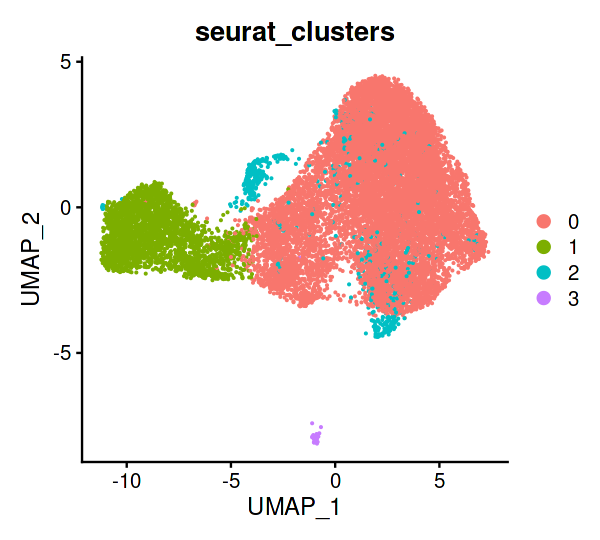

In [174]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(ec1, reduction = "umap", label = F, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')

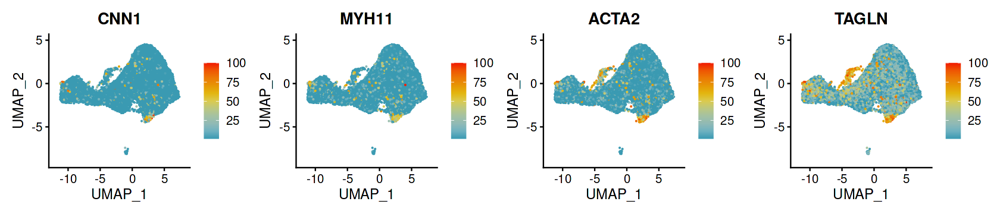

In [362]:
DefaultAssay(ec1)<-'RNA'
options(repr.plot.width=14, repr.plot.height=3)
FeaturePlot(ec1, features = c('CNN1','MYH11','ACTA2','TAGLN'), ncol=4, col=pal,order=F,min.cutoff=0.5)

In [176]:
ec1$acta2<-ec1@assays$RNA@data["ACTA2",]
ec1$tagln<-ec1@assays$RNA@data["TAGLN",]

In [177]:
as.data.frame(ec1$acta2)->acta2
colnames(acta2)<-'values'
as.data.frame(ec1$tagln)->tagln
colnames(tagln)<-'values'
quantile(acta2$values, 0.95)
quantile(tagln$values, 0.95)

95% 
2.013111

95% 
3.551848

In [178]:
ec1$smc_stat <- ifelse(ec1$acta2 > 2.01 & ec1$tagln>3.55, 'SMC+', 'SMC-')

In [179]:
table(ec1$smc_stat)


 SMC-  SMC+ 
15578   649 

In [366]:
colnames(ec1@meta.data)

[1] "orig.ident"              "nCount_RNA"             
 [3] "nFeature_RNA"            "percent.mt"             
 [5] "percent.rb"              "Pt"                     
 [7] "Site"                    "Gender"                 
 [9] "Age"                     "nCount_SCT"             
[11] "nFeature_SCT"            "integrated_snn_res.0.08"
[13] "seurat_clusters"         "celltype"               
[15] "celltype2"               "type_site"              
[17] "celltype3"               "integrated_snn_res.0.1" 
[19] "type_tmp"                "celltype4"              
[21] "smc_micro_sub"           "integrated_snn_res.0.05"

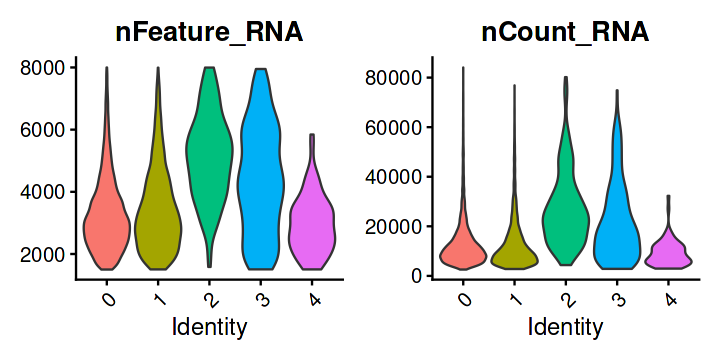

In [47]:
options(repr.plot.width=6, repr.plot.height=3)
VlnPlot(ec1, features = c('nFeature_RNA','nCount_RNA'),  ncol=2,pt.size=0 ,group.by = 'subcsluter')

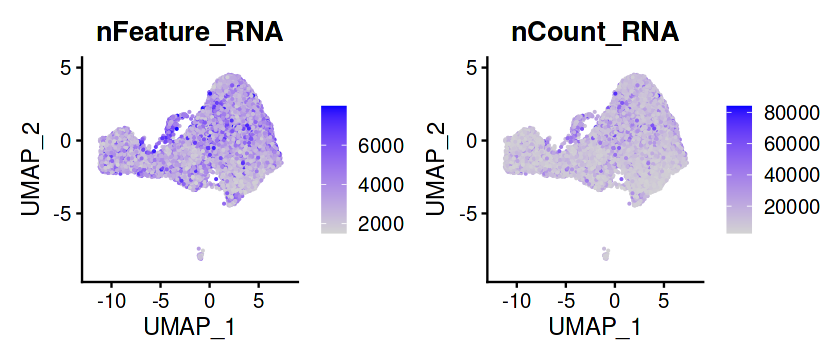

In [372]:
options(repr.plot.width=7, repr.plot.height=3)
FeaturePlot(ec1, features = c('nFeature_RNA','nCount_RNA'), ncol=2)

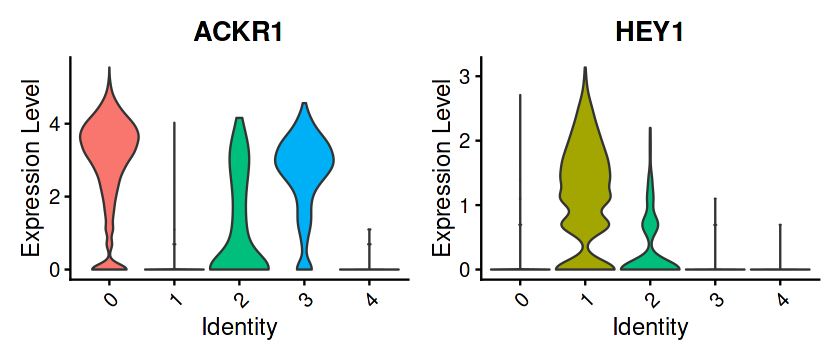

In [49]:
DefaultAssay(ec1)<-'SCT'
options(repr.plot.width=7, repr.plot.height=3)
VlnPlot(ec1, features = c('ACKR1','HEY1'), ncol=2,pt.size=0,group.by = 'subcsluter')

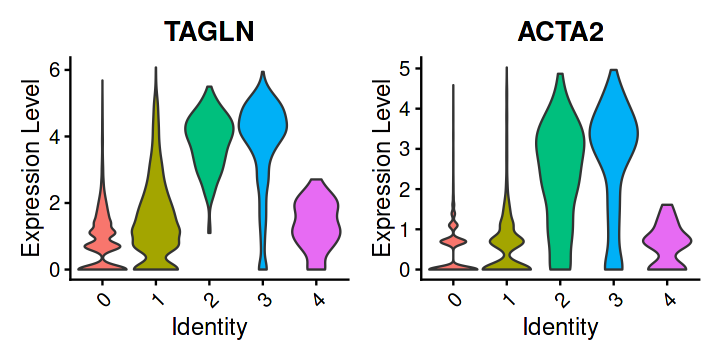

In [51]:
options(repr.plot.width=6, repr.plot.height=3)
VlnPlot(ec1, features = c('TAGLN','ACTA2'),  ncol=2,pt.size=0)

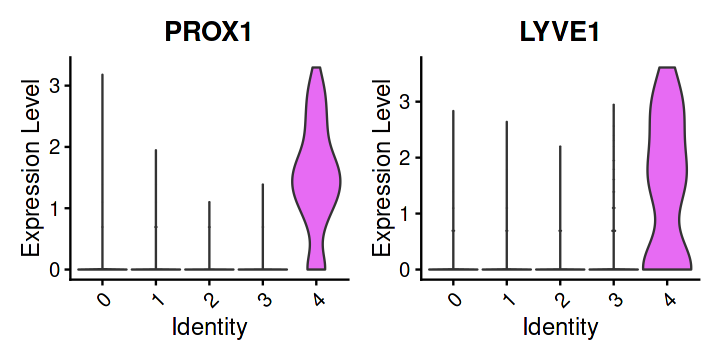

In [52]:
options(repr.plot.width=6, repr.plot.height=3)
VlnPlot(ec1, features = c('PROX1','LYVE1'),  ncol=2,pt.size=0)

In [209]:
drs_score <- read.table(gzfile("/home/lidaniel/scDRS_output/Res_0.075/CZI/CAD-MVP.score.gz"), 
                        row.names = 1,header = TRUE, sep = "\t", stringsAsFactors = FALSE)

In [210]:
AddMetaData(czi,metadata = drs_score)->czi

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


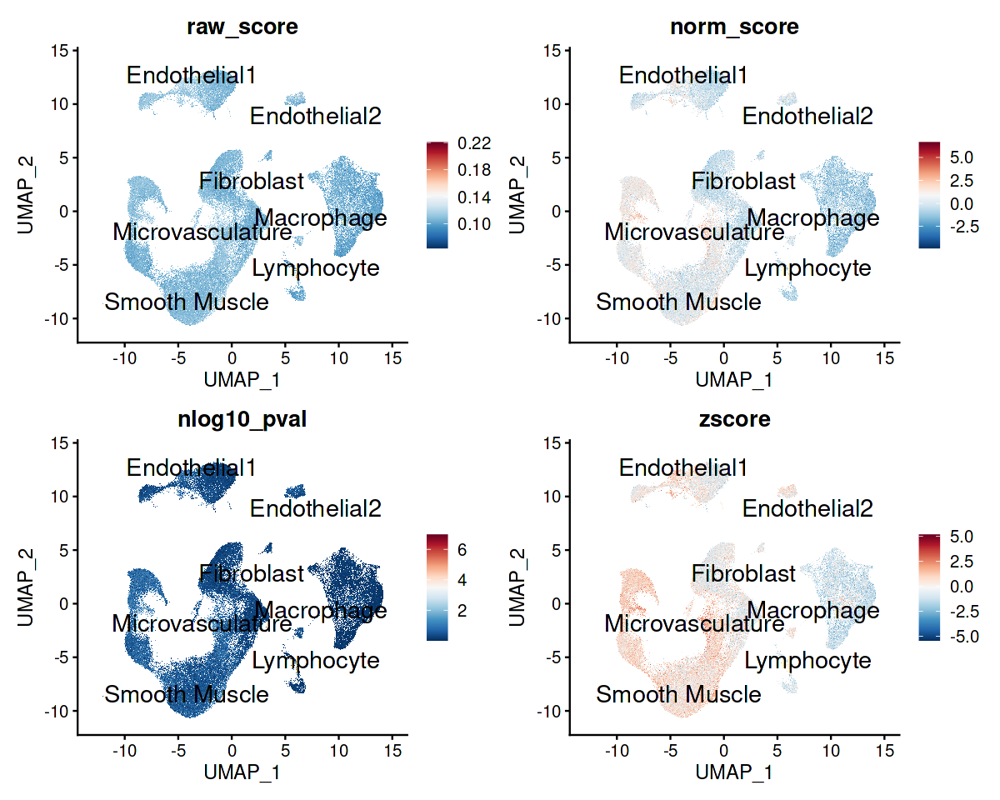

In [126]:
options(repr.plot.width=10, repr.plot.height=8)
FeaturePlot(czi,features = c('raw_score','norm_score','nlog10_pval','zscore'),  ncol=2,
            label = T, repel = TRUE,label.size = 6,order=T) &
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


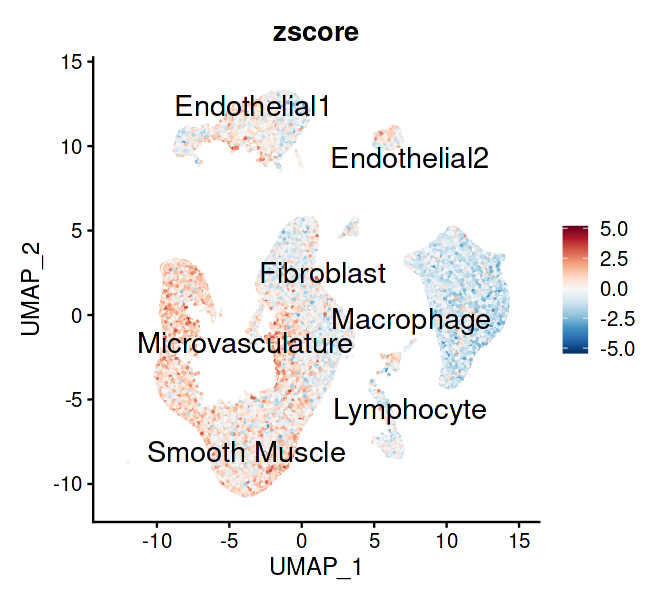

In [129]:
czi$celltype2->Idents(czi)
options(repr.plot.width=5.5, repr.plot.height=5)
FeaturePlot(czi,features = "zscore", label = T, repel = TRUE,label.size = 6,raster=FALSE,order=F) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [20]:
anu_score <- read.table(gzfile("scDRS/Aneurysm.score.gz"), 
                        row.names = 1,header = TRUE, sep = "\t", stringsAsFactors = FALSE)

In [21]:
AddMetaData(czi,metadata = anu_score)->czi

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


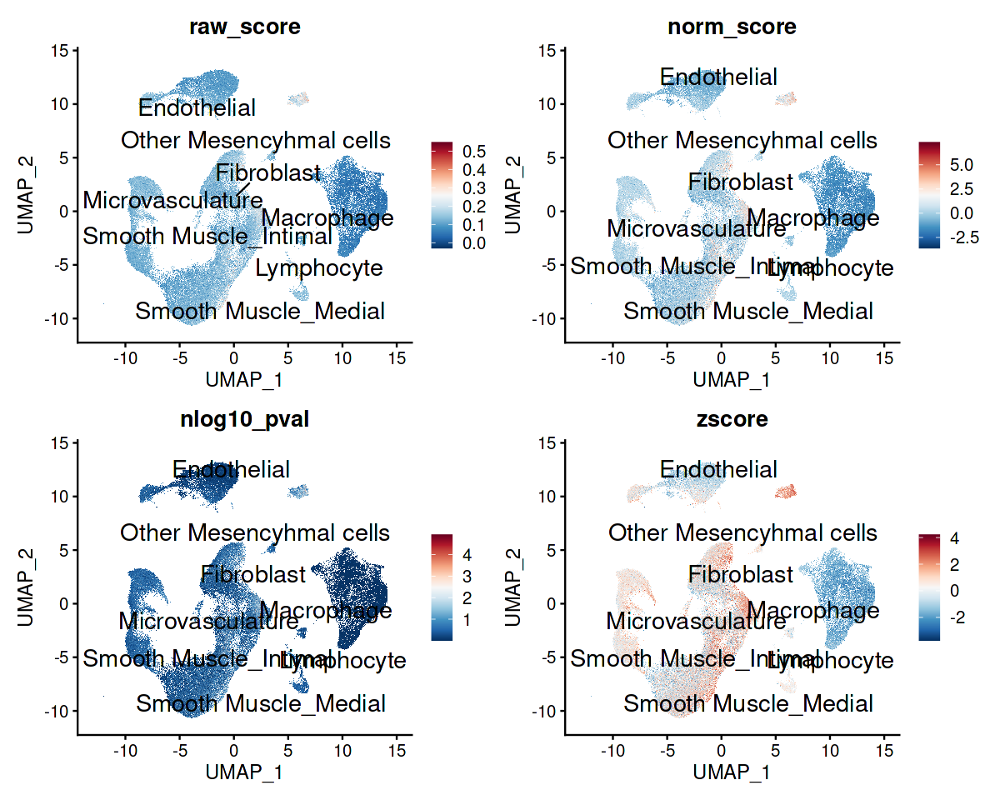

In [22]:
options(repr.plot.width=10, repr.plot.height=8)
FeaturePlot(czi,features = c('raw_score','norm_score','nlog10_pval','zscore'),  ncol=2,
            label = T, repel = TRUE,label.size = 6,order=T) &
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


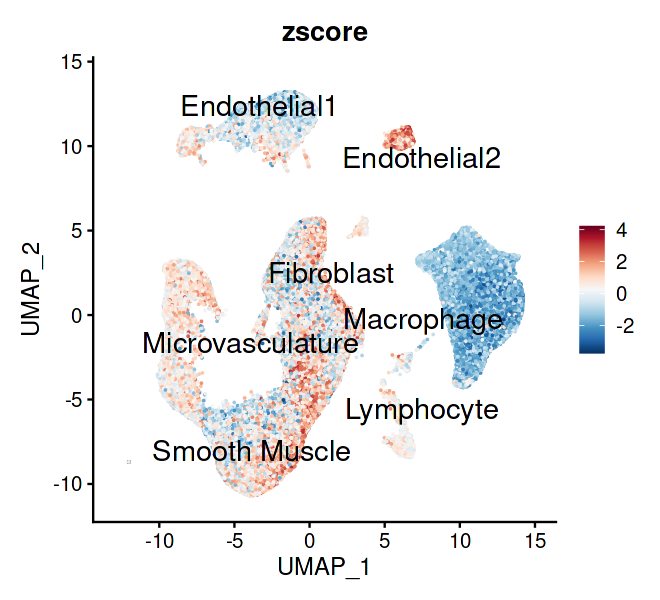

In [23]:
czi$celltype2->Idents(czi)
options(repr.plot.width=5.5, repr.plot.height=5)
FeaturePlot(czi,features = "zscore", label = T, repel = TRUE,label.size = 6,raster=FALSE,order=F) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [204]:
names(czi@graphs)

[1] "integrated_nn"  "integrated_snn"

In [205]:
czi$celltype->Idents(czi)
czi<-FindSubCluster(czi,c('Fibroblast'), 'integrated_snn',subcluster.name = "fb_sub", resolution = 0.2,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22291
Number of edges: 803172

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9063
Number of communities: 3
Elapsed time: 3 seconds


Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


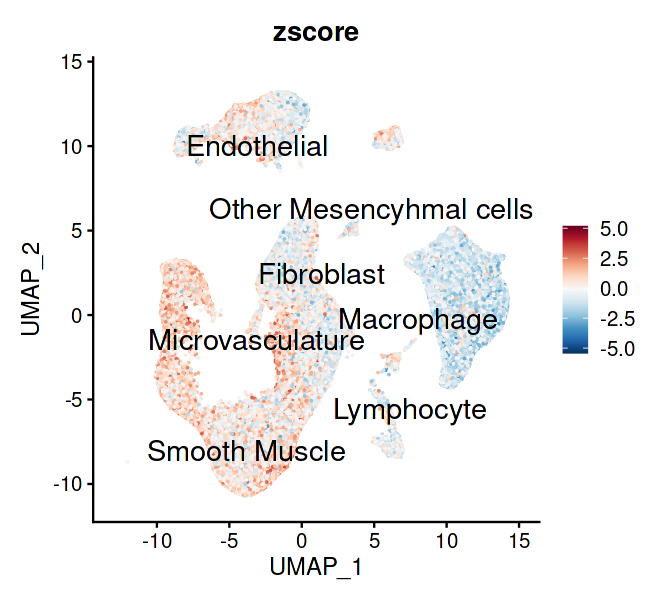

In [215]:
czi$celltype->Idents(czi)
options(repr.plot.width=5.5, repr.plot.height=5)
FeaturePlot(czi,features = "zscore", label = T, repel = TRUE,label.size = 6,raster=FALSE,order=F) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



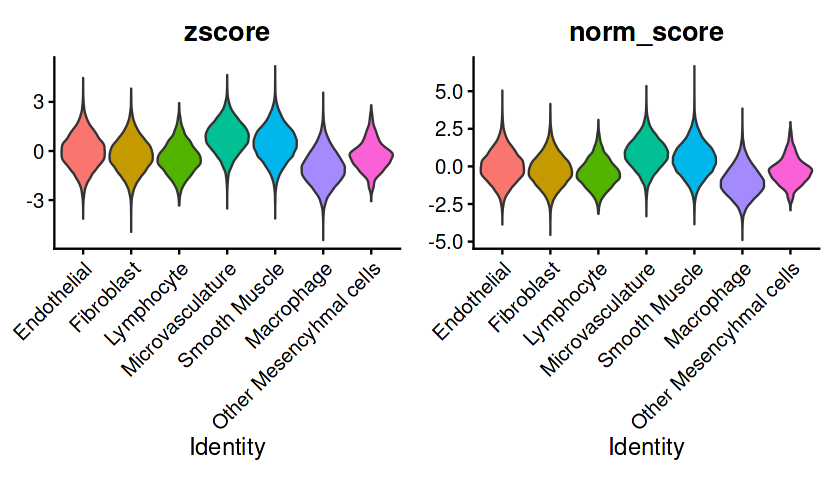

In [213]:
options(repr.plot.width=7, repr.plot.height=4)
VlnPlot(czi, features = c('zscore','norm_score'),group.by='celltype',ncol=2,pt.size=0)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



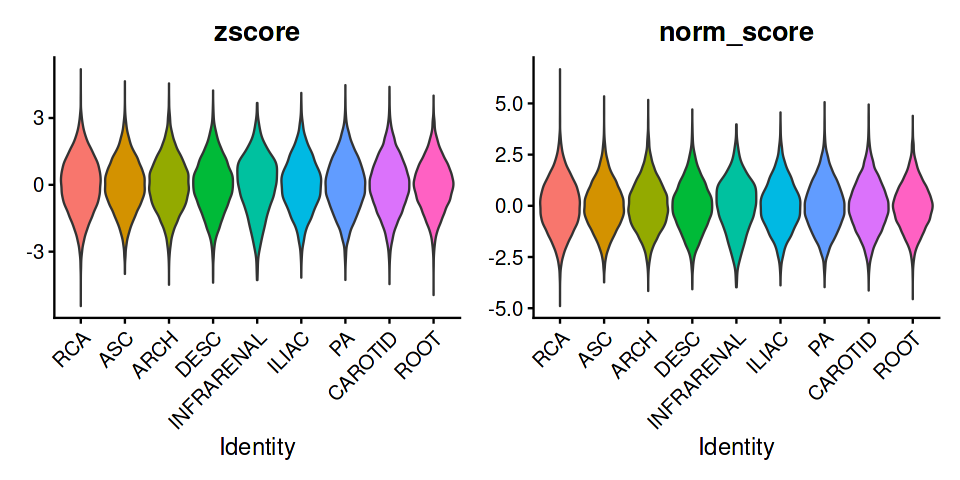

In [402]:
options(repr.plot.width=8, repr.plot.height=4)
VlnPlot(czi, features = c('zscore','norm_score'),group.by='Site',ncol=2,pt.size=0)

In [133]:
czi@meta.data->dat
dat_avg <- dat %>%
  group_by(Site, celltype4) %>%
  summarise(norm_score = mean(norm_score, na.rm = TRUE), .groups = "drop")

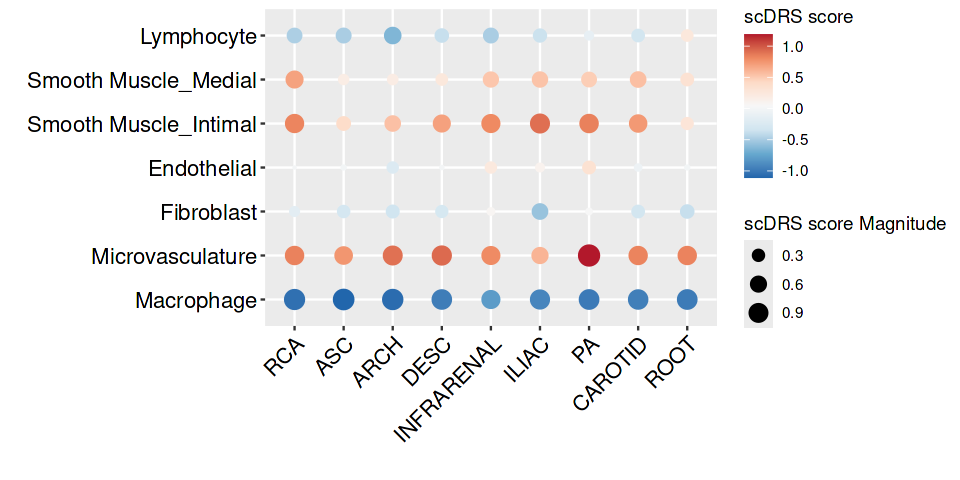

In [134]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(dat_avg, aes(x = Site, y = celltype4, size = abs(norm_score), color = norm_score)) +
  geom_point(shape = 16, stroke = 0)+
  scale_color_distiller(palette = "RdBu", direction = -1)+
  labs(x = "", y = "", color = "scDRS score", size = "scDRS score Magnitude")+
	theme(
		axis.text.y = element_text(size=13,colour = 'black'),
		axis.title.x = element_text(size=13,colour = 'black'),
		axis.text.x = element_text(size=13,angle=45,hjust=1,colour = 'black')
		)

In [135]:
dcast(dat_avg,celltype4~Site,value.var = 'norm_score')->dat2
rownames(dat2)<-dat2$celltype4
dat2[,2:ncol(dat2)]->dat2

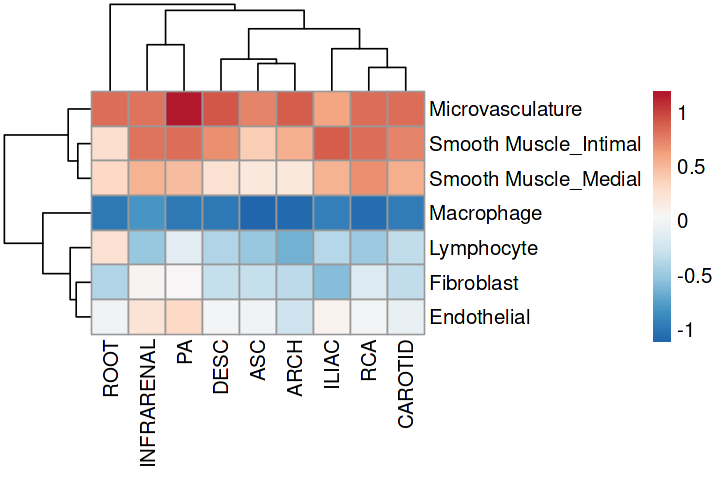

In [141]:
options(repr.plot.width=6, repr.plot.height=4)
pheatmap(dat2,cluster_rows =T,cluster_cols = T,show_rownames = T,scale='none',fontsize =12,angle_col = 90,
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [484]:
read.table('Markers/lnc/gwas/all_cat/total_de_cvd.tsv',sep='\t',header=T)->lnc_gwas_cvd

In [485]:
lnc_gwas_cvd$Pval<-dbinom(lnc_gwas_cvd$Overlaps,lnc_gwas_cvd$CatalogNumber,lnc_gwas_cvd$Fraction,log=F)
lnc_gwas_cvd$Padj<-p.adjust(lnc_gwas_cvd$Pval)

In [488]:
lnc_gwas_cvd[order(lnc_gwas_cvd$Odds), ]->lnc_gwas_cvd
lnc_gwas_cvd<- lnc_gwas_cvd[seq(dim(lnc_gwas_cvd)[1],1),]
lnc_gwas_cvd<-transform(lnc_gwas_cvd,Disease=factor(Disease,levels=rev(unique(Disease))))

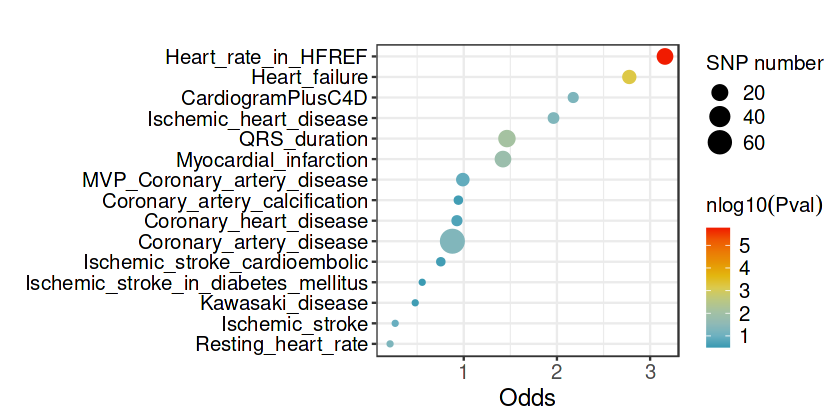

In [496]:
options(repr.plot.width=7, repr.plot.height=3.5)
ggplot(lnc_gwas_cvd, aes(x=Odds, y=Disease)) + 
	geom_point(aes(size=Overlaps, color=-log10(Pval)))+
    scale_colour_gradientn(colours =pal)+
	labs(
		color=expression(nlog10(Pval)), 
		size="SNP number",
		x="Odds",
        y='',
		title="")+
	theme_bw()+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
		legend.key.size = unit(0.2,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [5]:
paste(czi$celltype,czi$celltype2, sep='_')->czi$tmp

In [6]:
Idents(czi)<-czi$tmp
levels(czi)

[1] "Macrophage_Macrophage"              "Microvasculature_Microvasculature" 
[3] "Fibroblast_Fibroblast"              "Endothelial_Endothelial1"          
[5] "Smooth Muscle_Smooth Muscle"        "Lymphocyte_Lymphocyte"             
[7] "Other Mesencyhmal cells_Fibroblast" "Endothelial_Endothelial2"

In [7]:
cluster.ids <- c("Macrophage", "Microvasculature", "Fibroblast", "Endothelial", "Smooth Muscle",
                "Lymphocyte","Other Mesencyhmal cells","Endothelial")
names(cluster.ids) <- levels(czi)
czi <- RenameIdents(czi, cluster.ids)
levels(czi)<- c( "Endothelial", "Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage", "Other Mesencyhmal cells")
czi$celltype<-Idents(czi)

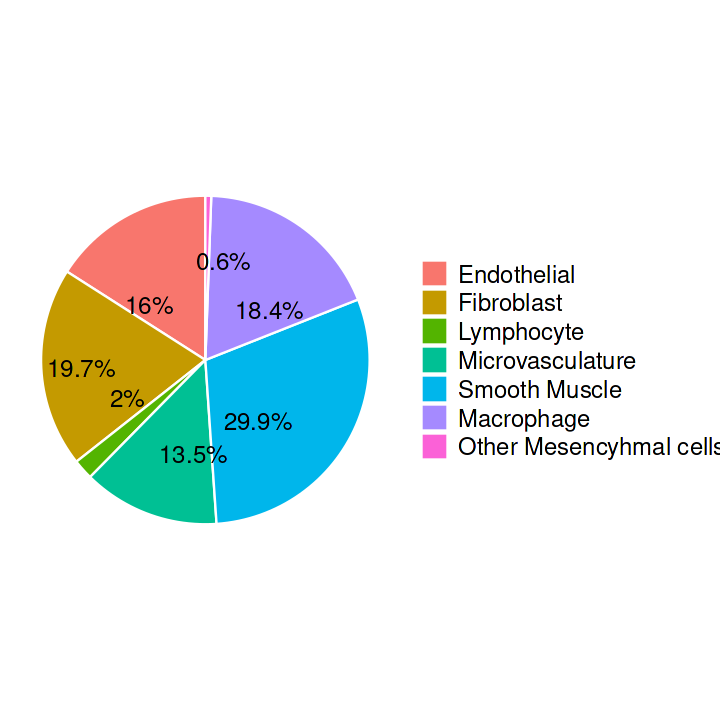

In [48]:
czi_cell_n <- as.data.frame(table(czi$celltype))
colnames(czi_cell_n) <- c("celltype", "Freq")
czi_cell_n <- czi_cell_n %>%
  mutate(Percent = round(Freq / sum(Freq) * 100, 1),
         Label = paste0(Percent, "%"))

options(repr.plot.width=6, repr.plot.height=6)
ggplot(czi_cell_n, aes(x="", y=Freq, fill=celltype)) +
  geom_bar(stat="identity", width=1, color="white") +
  coord_polar("y", start=0) +
  geom_text_repel(aes(label = Label), position = position_stack(vjust = 0.5), size = 5) +
 scale_color_manual(values=c('#F8766D','#CD9600','#7CAE00','#00BE67','#00BFC4','#00A9FF','#C77CFF'))+
  theme_void() +
  theme(
    legend.text = element_text(size=14),
    legend.title = element_blank()
  )

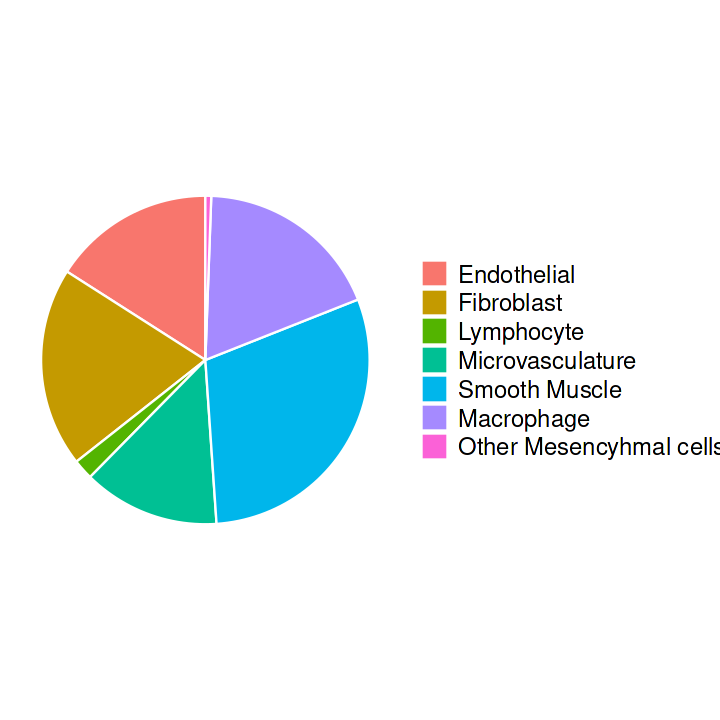

In [50]:
czi_cell_n <- as.data.frame(table(czi$celltype))
colnames(czi_cell_n) <- c("celltype", "Freq")
czi_cell_n <- czi_cell_n %>%
  mutate(Percent = round(Freq / sum(Freq) * 100, 1),
         Label = paste0(Percent, "%"))

options(repr.plot.width=6, repr.plot.height=6)
ggplot(czi_cell_n, aes(x="", y=Freq, fill=celltype)) +
  geom_bar(stat="identity", width=1, color="white") +
  coord_polar("y", start=0) +
 scale_color_manual(values=c('#F8766D','#CD9600','#7CAE00','#00BE67','#00BFC4','#00A9FF','#C77CFF'))+
  theme_void() +
  theme(
    legend.text = element_text(size=14),
    legend.title = element_blank()
  )

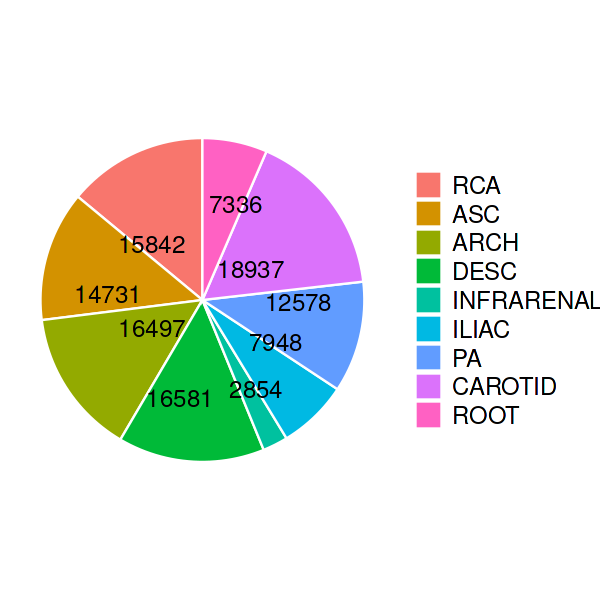

In [525]:
as.data.frame(table(czi$Site))->czi_site_n
options(repr.plot.width=5, repr.plot.height=5)
ggplot(czi_site_n, aes(x="", y=Freq, fill=Var1)) +
  geom_bar(stat="identity", width=1, color="white") +
  coord_polar("y", start=0) +
  geom_text_repel(aes(label = Freq),  position = position_stack(vjust = 0.5), size = 5)+
  theme_void() +
	theme(
		legend.text = element_text(size=14), 
		legend.title = element_blank()
		)


In [539]:
as.data.frame(table(czi$Site,czi$celltype))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]

In [541]:
czi_per <- czi_n / rowSums(czi_n) * 100

In [551]:
rownames(czi_per)->czi_per$Site
melt(czi_per,id.vars = 'Site')->czi_per2

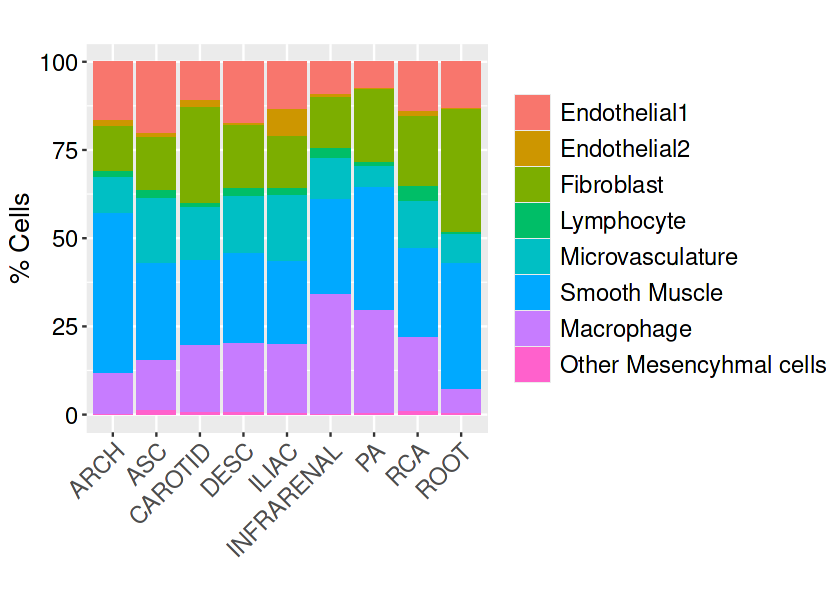

In [559]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(czi_per2, aes(x=Site, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='% Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

In [407]:
as.data.frame(table(czi$Pt,czi$celltype))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
czi_per <- czi_n / rowSums(czi_n) * 100
rownames(czi_per)->czi_per$Pt
melt(czi_per,id.vars = 'Pt')->czi_per2

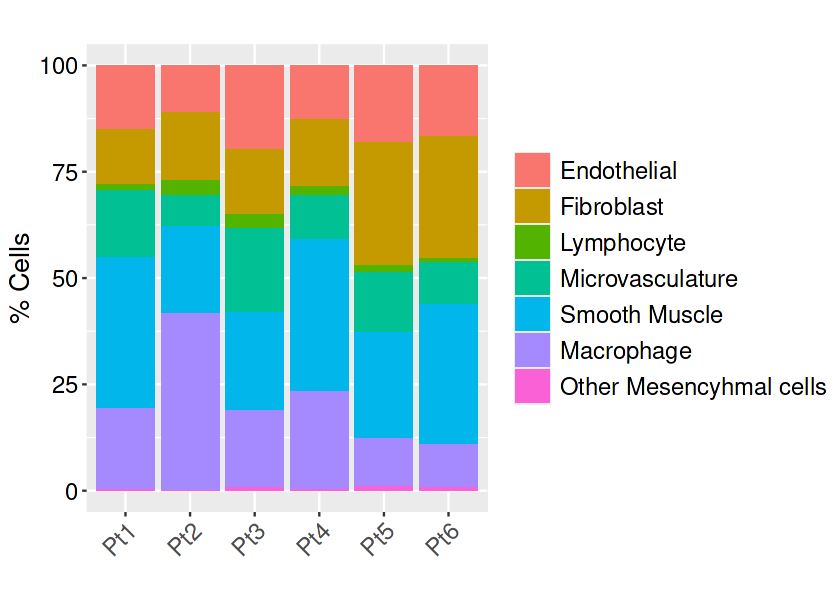

In [403]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(czi_per2, aes(x=Pt, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='% Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

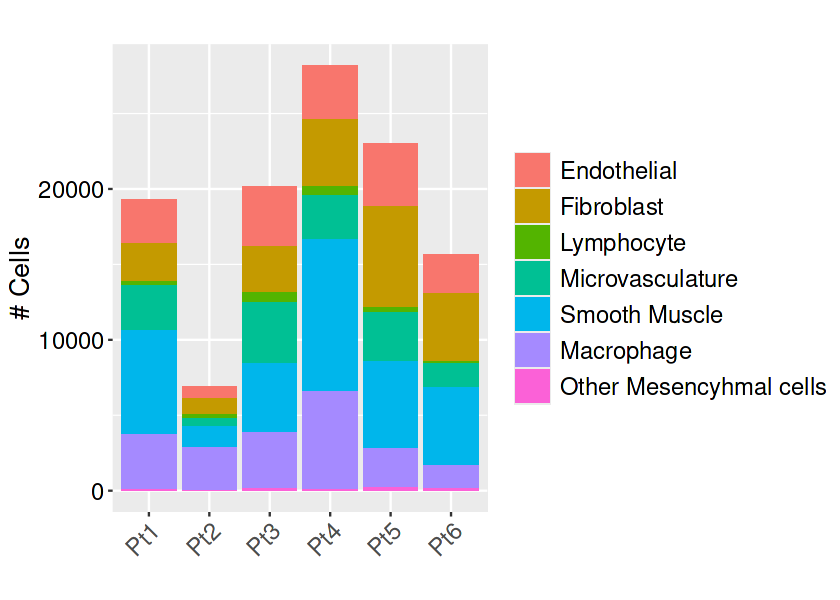

In [409]:
rownames(czi_n)->czi_n$Pt
melt(czi_n,id.vars = 'Pt')->czi_n2
options(repr.plot.width=7, repr.plot.height=5)
ggplot(czi_n2, aes(x=Pt, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

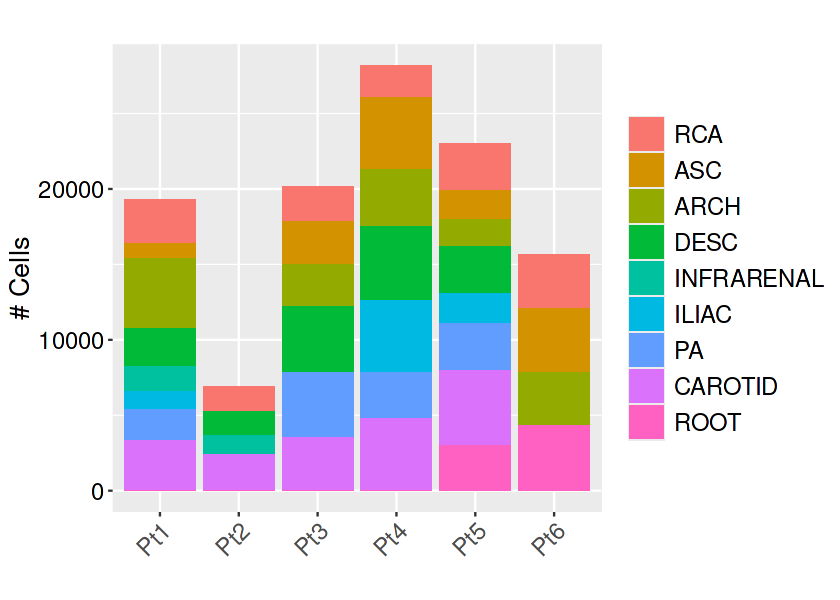

In [411]:
as.data.frame(table(czi$Pt,czi$Site))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
rownames(czi_n)->czi_n$Pt
melt(czi_n,id.vars = 'Pt')->czi_n2
options(repr.plot.width=7, repr.plot.height=5)
ggplot(czi_n2, aes(x=Pt, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

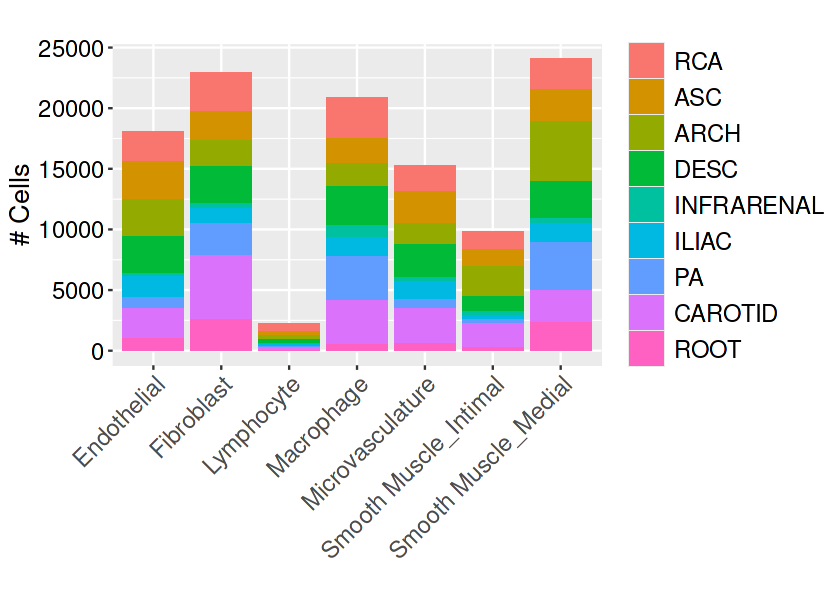

In [7]:
as.data.frame(table(czi$celltype4,czi$Site))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
rownames(czi_n)->czi_n$Pt
melt(czi_n,id.vars = 'Pt')->czi_n2
options(repr.plot.width=7, repr.plot.height=5)
ggplot(czi_n2, aes(x=Pt, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

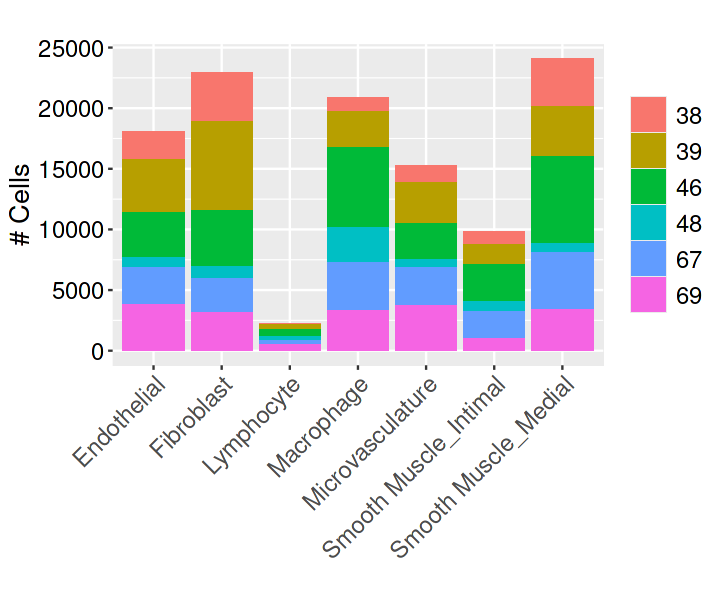

In [12]:
as.data.frame(table(czi$celltype4,czi$Age))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
rownames(czi_n)->czi_n$Age
melt(czi_n,id.vars = 'Age')->czi_n2
options(repr.plot.width=6, repr.plot.height=5)
ggplot(czi_n2, aes(x=Age, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

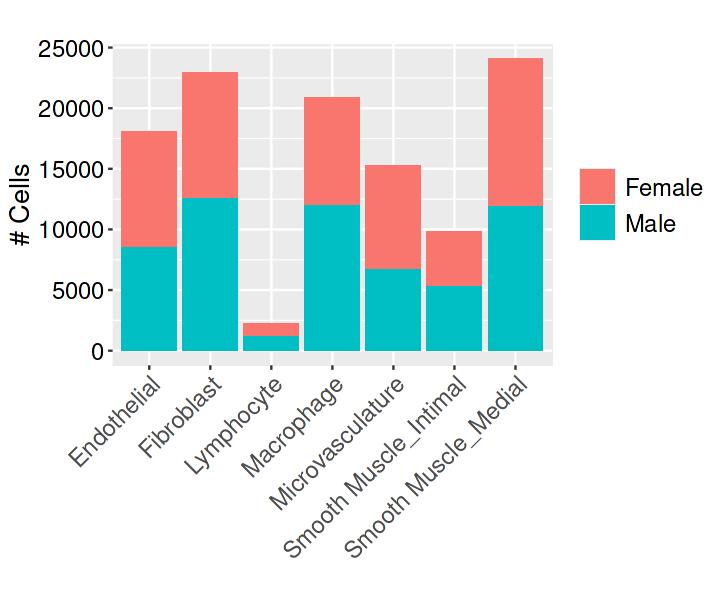

In [19]:
as.data.frame(table(czi$celltype4,czi$Gender))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
rownames(czi_n)->czi_n$Gender
melt(czi_n,id.vars = 'Gender')->czi_n2
options(repr.plot.width=6, repr.plot.height=5)
ggplot(czi_n2, aes(x=Gender, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

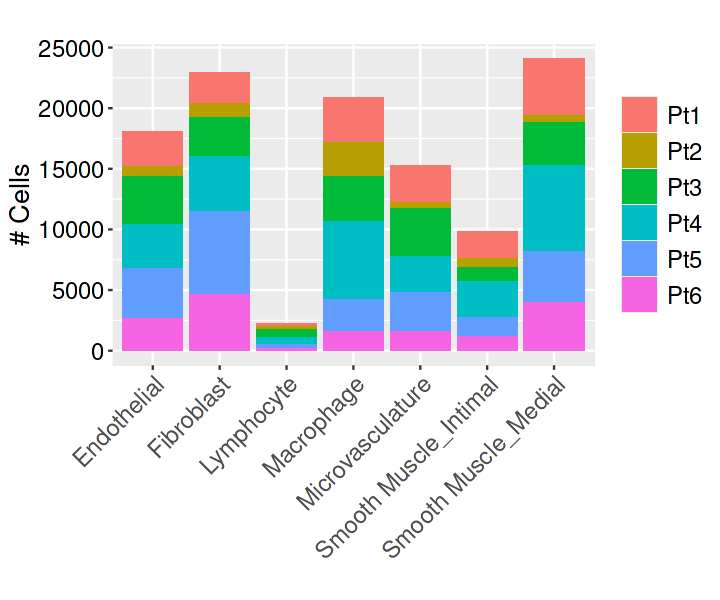

In [20]:
as.data.frame(table(czi$celltype4,czi$Pt))->czi_n
dcast(czi_n,Var1~Var2,value.var = 'Freq')->czi_n
rownames(czi_n)<-czi_n$Var1
czi_n<-czi_n[,2:ncol(czi_n)]
rownames(czi_n)->czi_n$Pt
melt(czi_n,id.vars = 'Pt')->czi_n2
options(repr.plot.width=6, repr.plot.height=5)
ggplot(czi_n2, aes(x=Pt, y=value,fill=variable)) + 
	geom_bar(stat= 'identity',position='stack')+
	labs(x=c(''),y='# Cells',title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.3,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
	)

In [93]:
devtools::load_all("~/baldar/app/monocle/")

ℹ Loading monocle
Loading required package: Matrix


Attaching package: ‘Matrix’


The following object is masked from ‘package:S4Vectors’:

    expand


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loading required package: VGAM

Loading required package: splines

Loading required package: DDRTree

Loading required package: irlba



In [96]:
set.seed(1234)

In [97]:
smc_10k <- smc[, sample(colnames(smc), size = 10000, replace=F)]

In [98]:
smc_10k

An object of class Seurat 
50048 features across 10000 samples within 3 assays 
Active assay: integrated (4000 features, 1841 variable features)
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

In [99]:
data <- as(as.matrix(smc_10k@assays$RNA@counts), 'sparseMatrix')
#data <- as(as.matrix(smc.combined@assays$integrated@data), 'sparseMatrix')
pd <- new('AnnotatedDataFrame', data = smc_10k@meta.data)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
fd <- new('AnnotatedDataFrame', data = fData)
cds <- newCellDataSet(data, phenoData = pd, featureData = fd,expressionFamily = negbinomial.size())
#cds <- newCellDataSet(data, phenoData = pd, featureData = fd)

In [100]:
cds <- estimateSizeFactors(cds)
cds <- estimateDispersions(cds)

Removing 38 outliers



In [101]:
cds <- detectGenes(cds, min_expr = 0.1)
expressed_genes <- row.names(subset(fData(cds),num_cells_expressed >= 10))

In [102]:
DefaultAssay(smc_10k)<-'RNA'
smc_10k <- FindVariableFeatures(smc_10k, selection.method = "vst", nfeatures = 2000)
ordering_genes<-smc_10k@assays$RNA@var.features

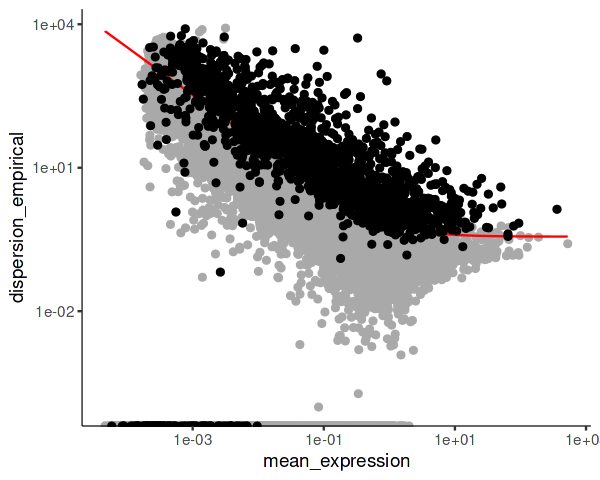

In [103]:
cds <- setOrderingFilter(cds, ordering_genes)
options(repr.plot.width=5, repr.plot.height=4)
plot_ordering_genes(cds)

In [104]:
cds <- reduceDimension(cds, max_components = 2, method = 'DDRTree')

In [105]:
cds <- orderCells(cds,reverse = T)

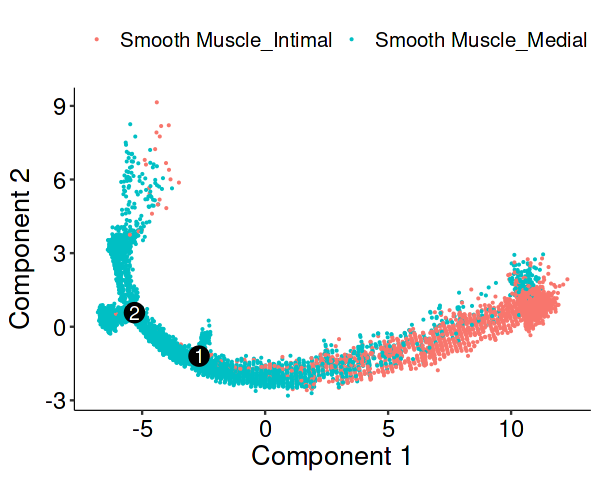

In [113]:
options(repr.plot.width=5, repr.plot.height=4)
p <- plot_cell_trajectory(cds, color_by = "celltype3",show_tree = FALSE, show_backbone = FALSE)

p$layers[[1]]$aes_params$size <- 0.1
p + theme(
  axis.text.y = element_text(size = 14, color = 'black'),
  axis.text.x = element_text(size = 14, color = 'black'),
  axis.title.x = element_text(size = 16),
  axis.title.y = element_text(size = 16),
  legend.text = element_text(size = 12),
  legend.title = element_blank()
)

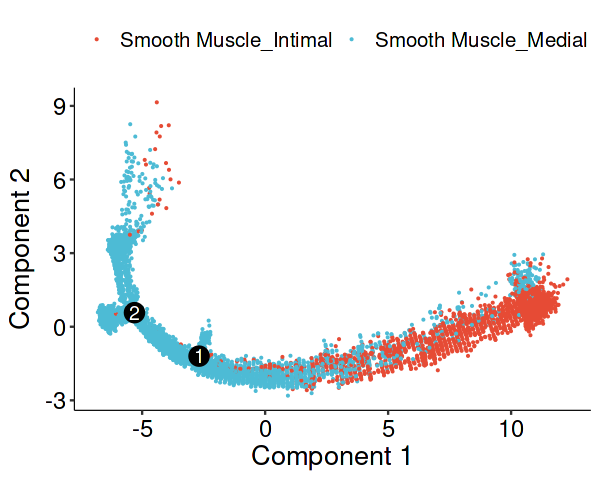

In [139]:
options(repr.plot.width=5, repr.plot.height=4)
p <- plot_cell_trajectory(cds, color_by = "celltype3",show_tree = FALSE, show_backbone = FALSE)

p$layers[[1]]$aes_params$size <- 0.1
p + theme(
  axis.text.y = element_text(size = 14, color = 'black'),
  axis.text.x = element_text(size = 14, color = 'black'),
  axis.title.x = element_text(size = 16),
  axis.title.y = element_text(size = 16),
  legend.text = element_text(size = 12),
  legend.title = element_blank()
)+scale_color_npg()

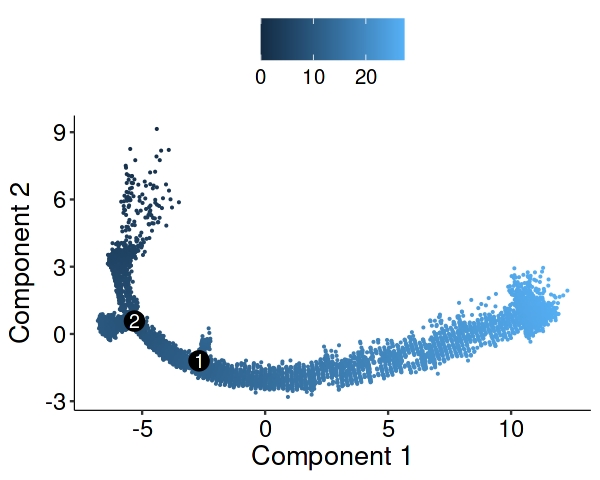

In [136]:
p<- plot_cell_trajectory(cds, color_by = "Pseudotime",show_tree = FALSE, show_backbone = FALSE)

p$layers[[1]]$aes_params$size <- 0.1
p + theme(
  axis.text.y = element_text(size = 14, color = 'black'),
  axis.text.x = element_text(size = 14, color = 'black'),
  axis.title.x = element_text(size = 16),
  axis.title.y = element_text(size = 16),
  legend.text = element_text(size = 12),
  legend.title = element_blank()
)

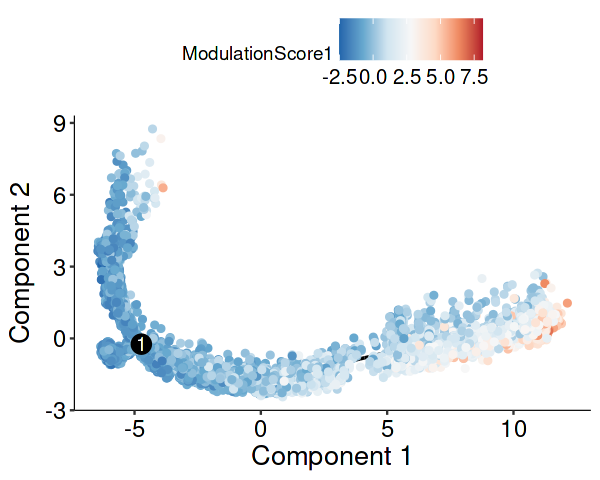

In [96]:
options(repr.plot.width=5, repr.plot.height=4)
plot_cell_trajectory(cds, color_by = "ModulationScore1")+
 scale_color_distiller(palette = "RdBu", direction = -1)+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,color='black'),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
        legend.text = element_text(size=12)
        )

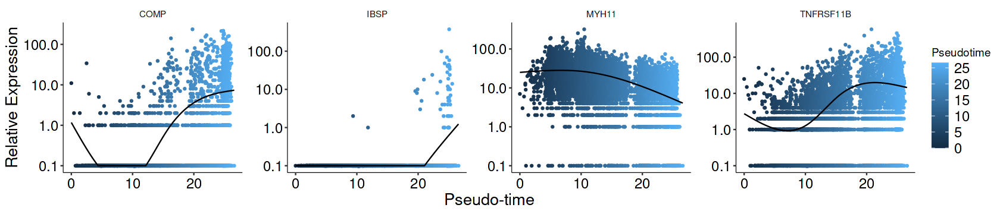

In [100]:
gene_list <- c("MYH11", "TNFRSF11B", "COMP","IBSP") 
cds_subset <- cds[gene_list, ]
options(repr.plot.width=14, repr.plot.height=3)
plot_genes_in_pseudotime(cds_subset,
                         color_by = "Pseudotime",
                         ncol = 4) &
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,color='black'),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
        legend.text = element_text(size=14), 
        plot.title = element_text(size=16)
        )

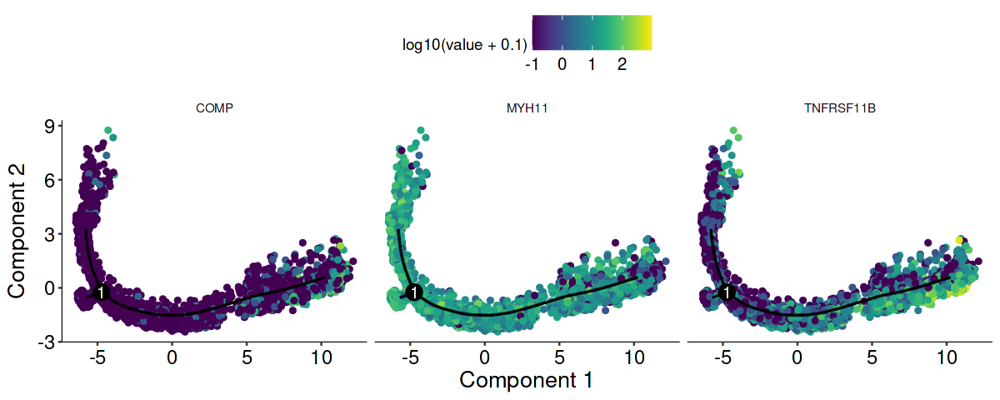

In [101]:
options(repr.plot.width=10, repr.plot.height=4)
plot_cell_trajectory(cds,use_color_gradient = T,markers =c("MYH11","COMP","TNFRSF11B"))+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,color='black'),
		axis.title.x = element_text(size=16),
        axis.title.y = element_text(size=16),
        legend.text = element_text(size=12), 
        plot.title = element_text(size=16)
        )

In [102]:
saveRDS(cds,'RDS/smc_cds.rds')

In [119]:
cell<-c("Fibroblast","Smooth Muscle", "Microvasculature","Macrophage", "Endothelial")
hits<-c(31,18,5,3,4)
total<-c(578,340,173,61,166)
as.data.frame(cbind(cell,hits,total))->dat
as.numeric(dat$hits)->dat$hits
as.numeric(dat$total)->dat$total

In [120]:
dat$per<-dat$hits/dat$total *100

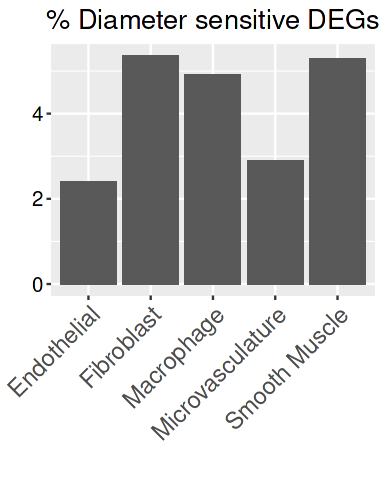

In [121]:
options(repr.plot.width=3.2, repr.plot.height=4)
ggplot(dat, aes(x=cell, y=per)) + 
	geom_bar(stat= 'identity')+
	labs(x="",y='',
		title="% Diameter sensitive DEGs")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [130]:
read.table('Markers/gwas_sig_prop2.txt',sep='\t',header=F)[1:6,]->dat

In [131]:
dat$total<-c(757,276,3856,1181,1835,2227)
dat$per<-dat$V1/dat$total *100

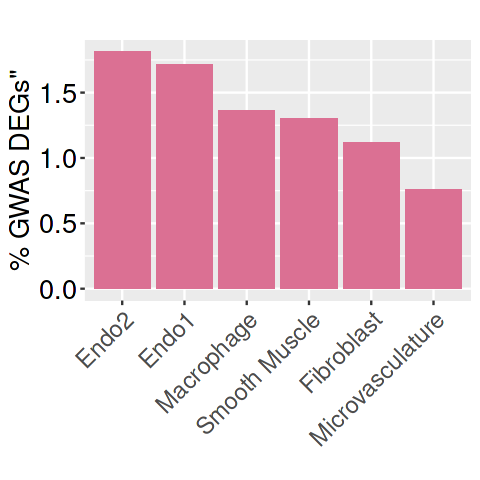

In [133]:
dat[order(dat$per,decreasing = T),]->dat
dat<-dat[seq(dim(dat)[1],1),]
dat<-transform(dat,V2=factor(dat$V2,levels=rev(unique(dat$V2))))
options(repr.plot.width=4, repr.plot.height=4)
ggplot(dat, aes(x=V2, y=per,fill=''))+ 
	geom_bar(stat='identity')+
	scale_fill_manual(values=c("palevioletred"))+
	labs(x="",y='% GWAS DEGs"',title="")+
	theme(
		axis.text.y = element_text(size=16,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.y = element_text(size=16),
		legend.position = 'none'
	)

In [137]:
path <- "~/baldar/CZI/Markers/" 
tsv_files <- list.files(path, pattern = "\\_site_DESmk_sig_carca.gene$", full.names = TRUE)
tsv_list <- lapply(tsv_files, function(file) {
  df <- read.delim(file, stringsAsFactors = FALSE)
  return(df[[1]])
})
names(tsv_list) <- c('Endo1','Endo2','Endo','Fibroblast','Lymphocyte','Microvasculature','Macrophage','Smooth Muscle')
tsv_list$Endo<-NULL

In [176]:
go_res <- lapply(tsv_list, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='KEGG',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

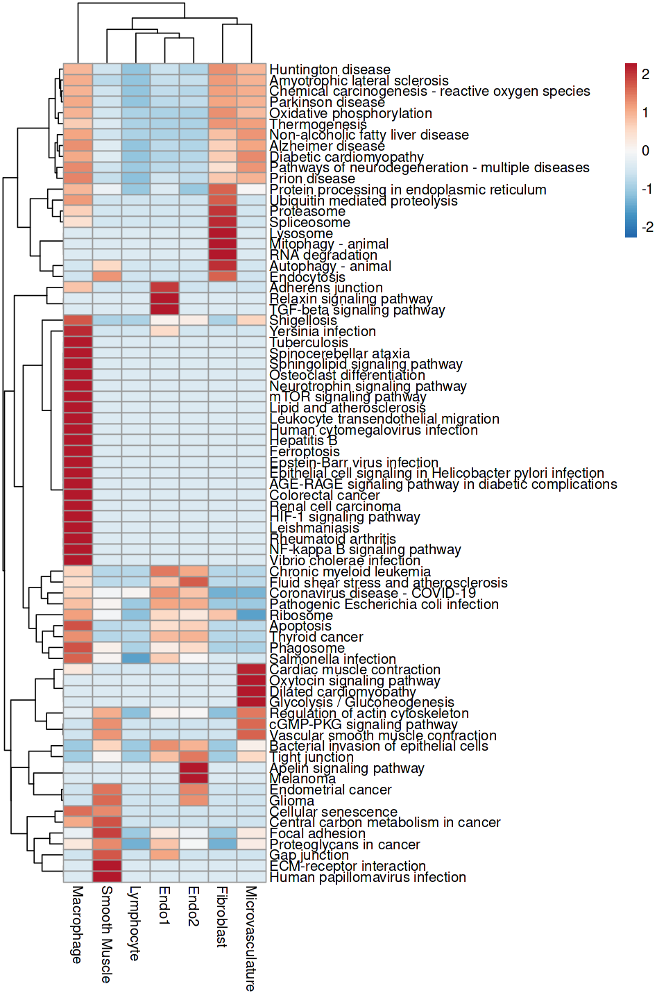

In [186]:
go_res_merge <- bind_rows(go_res, .id = "Source")
go_res_merge$nlogp<- -log10(go_res_merge$p_value)
go_res_merge[which(go_res_merge$nlogp>2),]->go_res_merge
dcast(go_res_merge,term_name~Source,value.var = 'nlogp',fun.aggregate = mean)->dat_go
dat_go[is.na(dat_go)] <- 0
dat_go$term_name->rownames(dat_go)
dat_go[,2:ncol(dat_go)]->dat_go
dat_go <- dat_go[rowSums(dat_go != 0) > 0, colSums(dat_go != 0) > 0]
options(repr.plot.width=8, repr.plot.height=12)
pheatmap(dat_go,cluster_rows =T,cluster_cols = T,show_rownames = T,scale='row', fontsize = 12,
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [188]:
go_res <- lapply(tsv_list, function(res) {
    gp <- gost(res, organism = "hsapiens", significant = FALSE)
    gp$result[gp$result$source=='GO:BP',]->gp_res
    (gp_res$intersection_size/gp_res$query_size)/(gp_res$term_size/gp_res$effective_domain_size)->gp_res$FoldEnrichment
    return(gp_res)
})

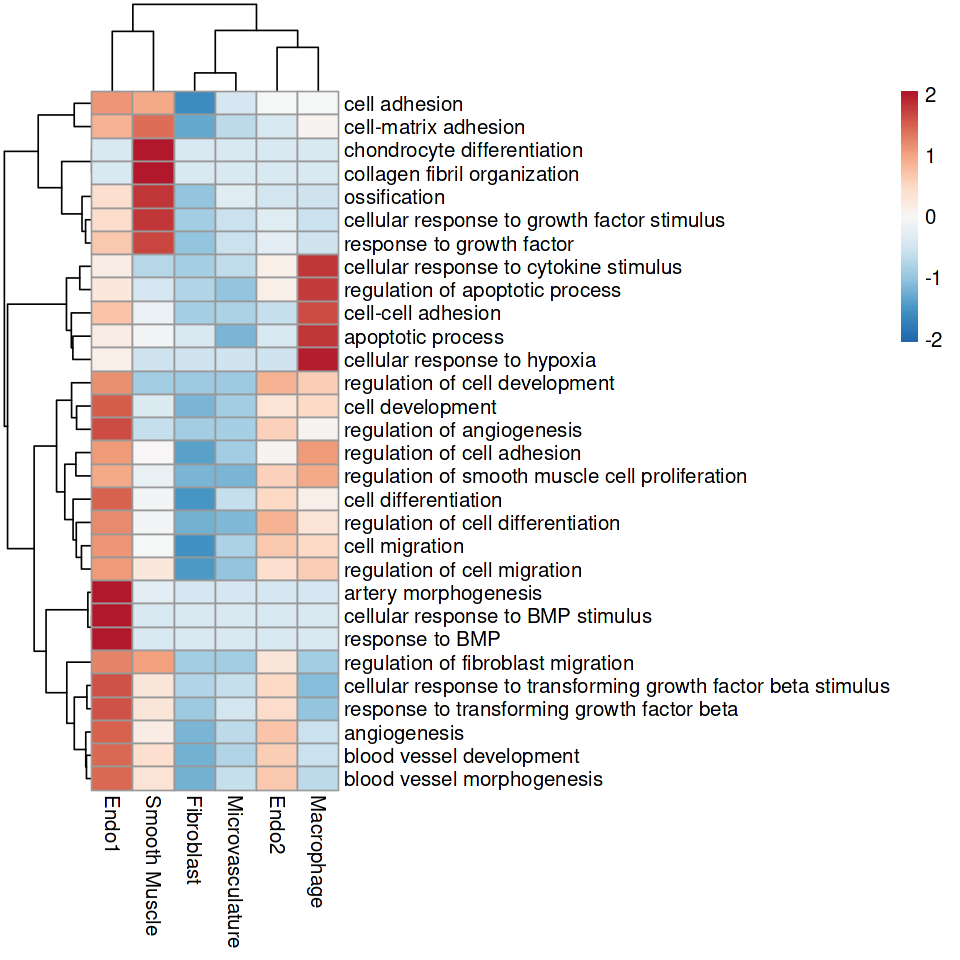

In [197]:
go_res_merge <- bind_rows(go_res, .id = "Source")
go_res_merge$nlogp<- -log10(go_res_merge$p_value)
read.table('~/baldar/SplitPool/300Pilot2/Markers/terms',sep='\t')$V1->term
go_res_merge[which(go_res_merge$term_name %in% term),]->go_res_merge
dcast(go_res_merge,term_name~Source,value.var = 'nlogp',fun.aggregate = mean)->dat_go
dat_go[is.na(dat_go)] <- 0
dat_go$term_name->rownames(dat_go)
dat_go[,2:ncol(dat_go)]->dat_go
dat_go <- dat_go[rowSums(dat_go != 0) > 0, colSums(dat_go != 0) > 0]
options(repr.plot.width=8, repr.plot.height=8)
pheatmap(dat_go,cluster_rows =T,cluster_cols = T,show_rownames = T,scale='row',fontsize = 12,
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [291]:
DA_gene <- read.table("Markers/PA_diameter.gene", header = F)$V1
DA_geneset <- data.frame(
  gs_name = "AORTIC_ANEURYSM",
  gene_ID = DA_gene  
)

In [320]:
path <- "~/baldar/CZI/Markers/" 
gene_list_all<-list()
file_list <- list.files(path, pattern = "\\_site_DESmk_sig_carca.txt$", full.names = TRUE)
for (file in file_list) {
  data <- read.table(file, header = F)
  gene_list <- data[order(data$V3, decreasing = TRUE), ]
  gene_list_all[[file]] <- gene_list
}
names(gene_list_all) <- c('Endo1','Endo2','Endo','Fibroblast','Lymphocyte','Microvasculature','Macrophage','Smooth Muscle')
gene_list_all$Endo<-NULL
gene_list_all$Lymphocyte<-NULL

In [356]:
gsea_plot<-function(gene,ref){
    gene_vec <- gene$V3
    names(gene_vec) <- gene$V8
    gsea_results <- GSEA(
        geneList = gene_vec,
        TERM2GENE = ref,      
        pvalueCutoff = 1,          
        minGSSize = 0,                       
        maxGSSize = 500)
    return(gsea_results)
    }

In [ ]:
gsea_res<-lapply(gene_list_all,gsea_plot,ref=DA_geneset)

In [339]:
combined_results <- do.call(rbind, lapply(gsea_res, function(df) {
  df@result[, c("enrichmentScore", "pvalue",'NES')]
}))
rownames(combined_results)->combined_results$cell

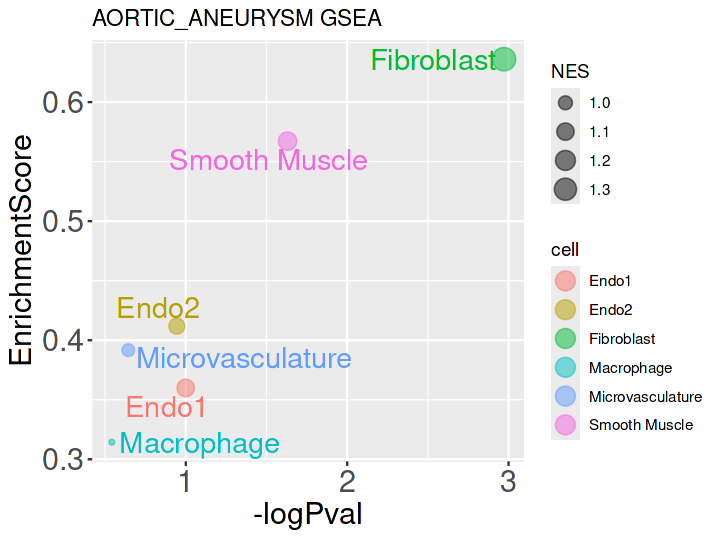

In [348]:
options(repr.plot.width=6, repr.plot.height=4.5)
ggplot(combined_results, aes(x=-log(pvalue), y=enrichmentScore,label=cell)) + 
		geom_point(shape=19, alpha=0.5, aes(size=NES,color=cell)) + 
		ylab("EnrichmentScore") + xlab("-logPval") + 
		ggtitle ("AORTIC_ANEURYSM GSEA") + 
		theme(axis.text=element_text(size=18), 
				axis.title=element_text(size=18))+
		guides(color = guide_legend(override.aes = list(size = 5)))+
		geom_text_repel(aes(label=cell, color = cell), size=6,show.legend=F)

In [350]:
Dis_geneset <- read.table("~/baldar/app/GWASanalytics/CVD.genes", header = F)

In [360]:
colnames(Dis_geneset)<-c('gene_ID','gs_name')
Dis_geneset <- Dis_geneset[, c(2, 1)] 

In [361]:
gsea_res<-lapply(gene_list_all,gsea_plot,ref=Dis_geneset)

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



In [391]:
combined_results <- do.call(rbind, lapply(gsea_res, function(df) {
  df@result[, c("enrichmentScore", "pvalue",'NES')]
}))
combined_results <- combined_results %>% 
  rownames_to_column(var = "rowname") %>%
  separate(rowname, into = c("cell", "term"), sep = "\\.")
combined_results$nlogp <- -log10(combined_results$pvalue)
dcast(combined_results,term~cell,value.var = 'nlogp',fun.aggregate = mean)->dat_p
dat_p[is.na(dat_p)] <- 0
dat_p$term->rownames(dat_p)
dat_p[,2:ncol(dat_p)]->dat_p
dat_p <- dat_p[rowSums(dat_p != 0) > 0, colSums(dat_p != 0) > 0]

In [393]:
write.table(dat_p, 'Markers/GWAS/disease_gsea.tsv',quote=F, sep='\t')

In [394]:
read.table('Markers/GWAS/disease_gsea.tsv',header=T,row.names = 1, sep='\t')->dat_p

In [397]:
dat_p <- dat_p %>% filter(apply(., 1, max) >= 1)

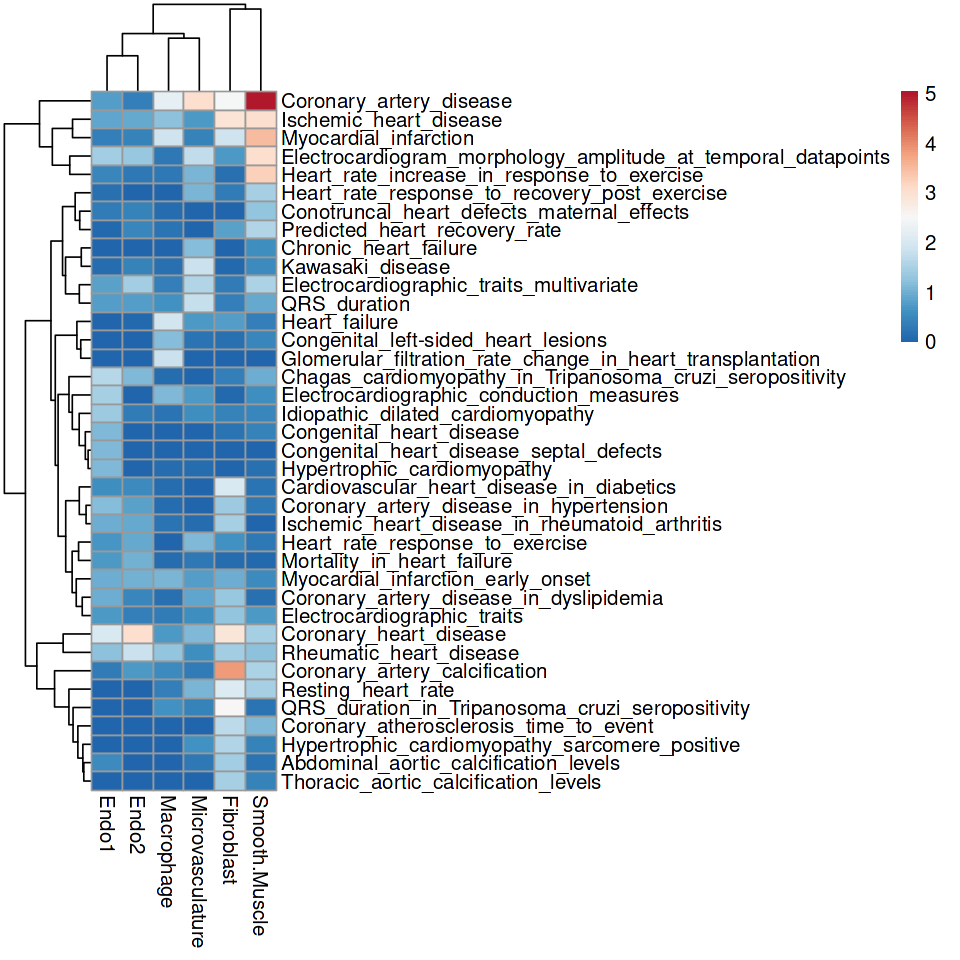

In [399]:
options(repr.plot.width=8, repr.plot.height=8)
pheatmap(dat_p,cluster_rows =T,cluster_cols = T,show_rownames = T,scale='none',fontsize = 12,
         color=colorRampPalette(rev(brewer.pal(9,"RdBu")))(100))

In [12]:
readRDS('RDS/RCA_spatial2.rds')->rca

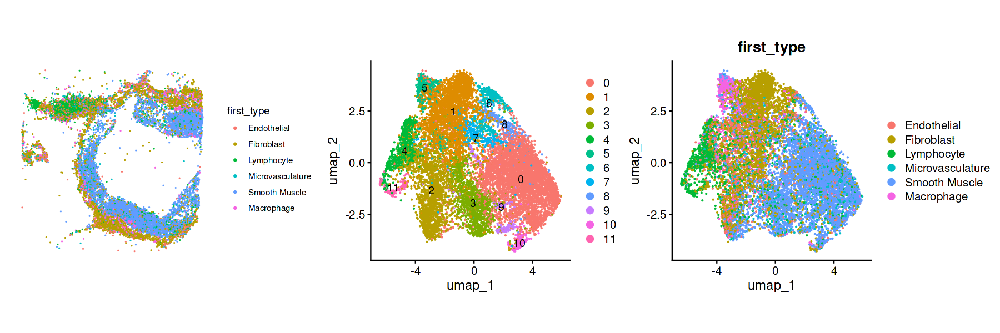

In [420]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(rca, group.by = "first_type",stroke=0)
p2 <- DimPlot(rca, reduction = "umap", label = TRUE)
p3 <- DimPlot(rca, reduction = "umap", label = F,group.by = "first_type")
p1+p2+p3

In [ ]:
DefaultAssay(rca)<-'SCT'
FindClusters(rca, resolution = 0.1, verbose = FALSE)->rca

In [45]:
rctd_proc_2<-function(i,meta, n=30){
    Idents(czi) <- czi[[meta]]
    # extract information to pass to the RCTD Reference function
    counts <- czi@assays$RNA@counts
    cluster <- as.factor(czi[[meta]][[1]])
    names(cluster) <- colnames(czi)
    nUMI <- czi$nCount_RNA
    names(nUMI) <- colnames(czi)
    reference <- Reference(counts, cluster, nUMI)
    # set up query with the RCTD function SpatialRNA
    counts <- i[["RNA"]]@counts
    coords <- GetTissueCoordinates(i)
    colnames(coords) <- c("x", "y")
    coords[is.na(colnames(coords))] <- NULL
    query <- SpatialRNA(coords, counts, colSums(counts))
    RCTD <- create.RCTD(query, reference, max_cores = n)
    RCTD <- run.RCTD(RCTD, doublet_mode = "doublet")
    i <- AddMetaData(i, metadata = RCTD@results$results_df)
    return(i)
}

In [14]:
rca$first_type->rca$celltype1

In [432]:
rctd_proc_2(rca,celltype3)->rca

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 62077

process_cell_type_info: number of genes in reference: 23024




           Macrophage      Microvasculature            Fibroblast 
                10000                 10000                 10000 
          Endothelial Smooth Muscle_Intimal  Smooth Muscle_Medial 
                10000                  9818                 10000 
           Lymphocyte 
                 2259 


End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Macrophage found DE genes: 219

get_de_genes: Microvasculature found DE genes: 103

get_de_genes: Fibroblast found DE genes: 113

get_de_genes: Endothelial found DE genes: 126

get_de_genes: Smooth Muscle_Intimal found DE genes: 96

get_de_genes: Smooth Muscle_Medial found DE genes: 109

get_de_genes: Lymphocyte found DE genes: 94

get_de_genes: total DE genes: 717

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: Macrophage found DE genes: 421

get_de_genes: Microvasculature found DE genes: 206

get_de_genes: Fibroblast found DE genes: 216

get_de_genes: Endothelial found DE genes: 280

get_de_genes: Smooth Muscle_Intimal found DE genes: 222

get_de_genes: Smooth Muscle_Medial found DE genes: 218

get_de_genes: Lymphocyte found DE genes: 178

get_de_genes: total DE genes: 1328

fitBulk: decomposing bulk

chooseSigma: using initi

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"
[1] "gather_results: finished 7000"
[1] "gather_results: finished 8000"
[1] "gather_results: finished 9000"
[1] "gather_results: finished 10000"
[1] "gather_results: finished 11000"
[1] "gather_results: finished 12000"


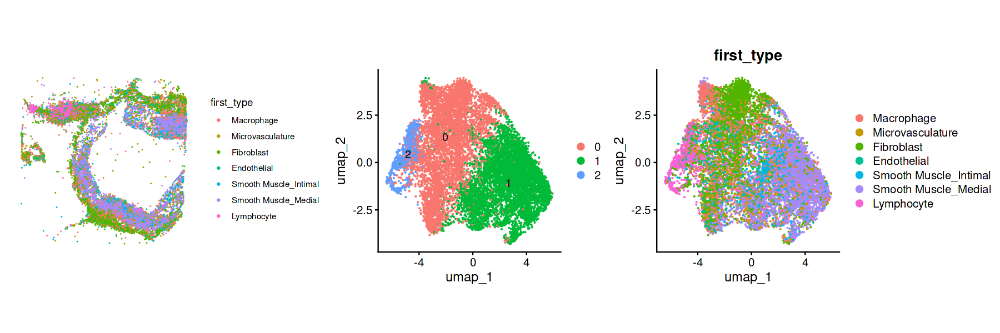

In [440]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(rca, group.by = "first_type",stroke=0)
p2 <- DimPlot(rca, reduction = "umap", label = TRUE)
p3 <- DimPlot(rca, reduction = "umap", label = F,group.by = "first_type")
p1+p2+p3

In [441]:
rca$first_type->rca$celltype2

In [449]:
rca<-FindSubCluster(rca,'1', 'SCT_snn',subcluster.name = "smc_sub", resolution = 0.3,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5965
Number of edges: 177822

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8023
Number of communities: 7
Elapsed time: 0 seconds


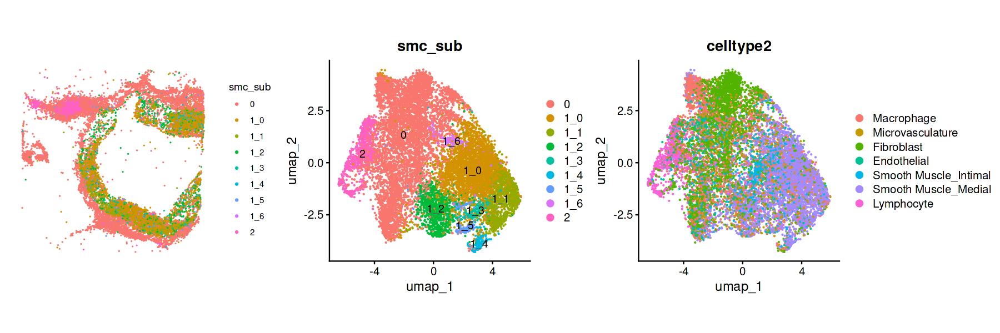

In [450]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(rca, group.by = "smc_sub",stroke=0)
p2 <- DimPlot(rca, reduction = "umap", group.by='smc_sub',label = TRUE)
p3 <- DimPlot(rca, reduction = "umap", label = F,group.by = "celltype2")
p1+p2+p3

In [63]:
readRDS('RDS/Aorta_spatial2.rds')->aorta

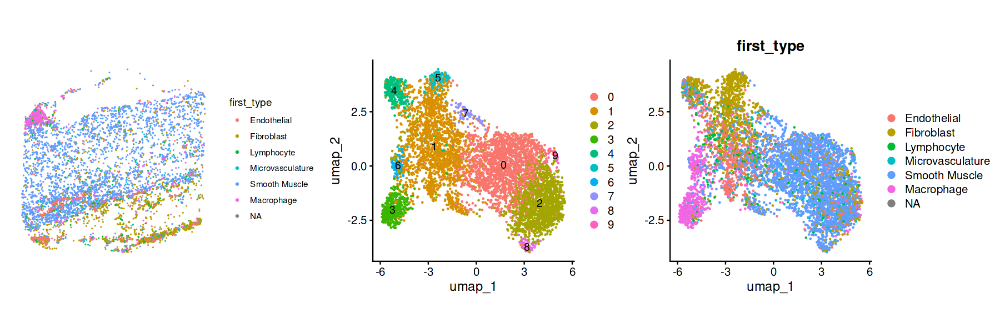

In [452]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(aorta, group.by = "first_type",stroke=0)
p2 <- DimPlot(aorta, reduction = "umap", label = TRUE)
p3 <- DimPlot(aorta, reduction = "umap", label = F,group.by = "first_type")
p1+p2+p3

In [454]:
DefaultAssay(aorta)<-'SCT'
FindClusters(aorta, resolution = 0.1, verbose = FALSE)->rca

In [455]:
aorta$first_type->aorta$celltype1

In [456]:
rctd_proc_2(aorta,celltype3)->aorta

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 62077

process_cell_type_info: number of genes in reference: 23024




           Macrophage      Microvasculature            Fibroblast 
                10000                 10000                 10000 
          Endothelial Smooth Muscle_Intimal  Smooth Muscle_Medial 
                10000                  9818                 10000 
           Lymphocyte 
                 2259 


End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Macrophage found DE genes: 216

get_de_genes: Microvasculature found DE genes: 99

get_de_genes: Fibroblast found DE genes: 109

get_de_genes: Endothelial found DE genes: 126

get_de_genes: Smooth Muscle_Intimal found DE genes: 94

get_de_genes: Smooth Muscle_Medial found DE genes: 107

get_de_genes: Lymphocyte found DE genes: 81

get_de_genes: total DE genes: 698

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: Macrophage found DE genes: 419

get_de_genes: Microvasculature found DE genes: 197

get_de_genes: Fibroblast found DE genes: 213

get_de_genes: Endothelial found DE genes: 282

get_de_genes: Smooth Muscle_Intimal found DE genes: 220

get_de_genes: Smooth Muscle_Medial found DE genes: 218

get_de_genes: Lymphocyte found DE genes: 163

get_de_genes: total DE genes: 1308

fitBulk: decomposing bulk

chooseSigma: using initia

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"


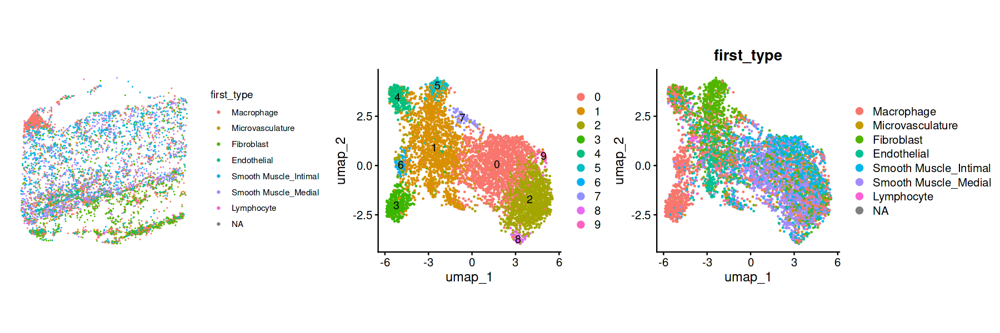

In [457]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(aorta, group.by = "first_type",stroke=0)
p2 <- DimPlot(aorta, reduction = "umap", label = TRUE)
p3 <- DimPlot(aorta, reduction = "umap", label = F,group.by = "first_type")
p1+p2+p3

In [458]:
aorta<-FindSubCluster(aorta,c('0','2','8','9'), 'SCT_snn',subcluster.name = "smc_sub", resolution = 0.3,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3400
Number of edges: 131223

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7584
Number of communities: 4
Elapsed time: 0 seconds


In [463]:
aorta$first_type->aorta$celltype2

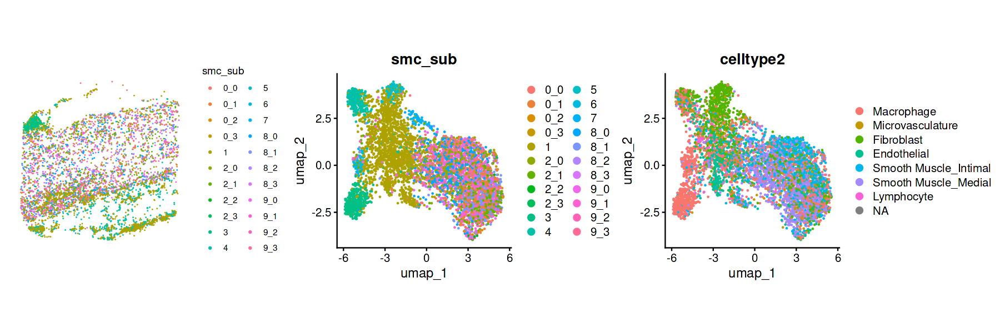

In [464]:
options(repr.plot.width=15, repr.plot.height=5)
p1 <- SpatialDimPlot(aorta, group.by = "smc_sub",stroke=0)
p2 <- DimPlot(aorta, reduction = "umap", group.by='smc_sub',label = F)
p3 <- DimPlot(aorta, reduction = "umap", label = F,group.by = "celltype2")
p1+p2+p3

In [4]:
levels(czi)

[1] "Macrophage"              "Microvasculature"       
[3] "Fibroblast"              "Endothelial"            
[5] "Smooth Muscle_Intimal"   "Smooth Muscle_Medial"   
[7] "Lymphocyte"              "Other Mesencyhmal cells"

In [8]:
names(czi@graphs)

[1] "integrated_nn"  "integrated_snn"

In [9]:
czi<-FindSubCluster(czi,'Microvasculature', 'integrated_snn',subcluster.name = "Micro_sub", resolution = 0.05,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 15257
Number of edges: 571873

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9684
Number of communities: 2
Elapsed time: 2 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



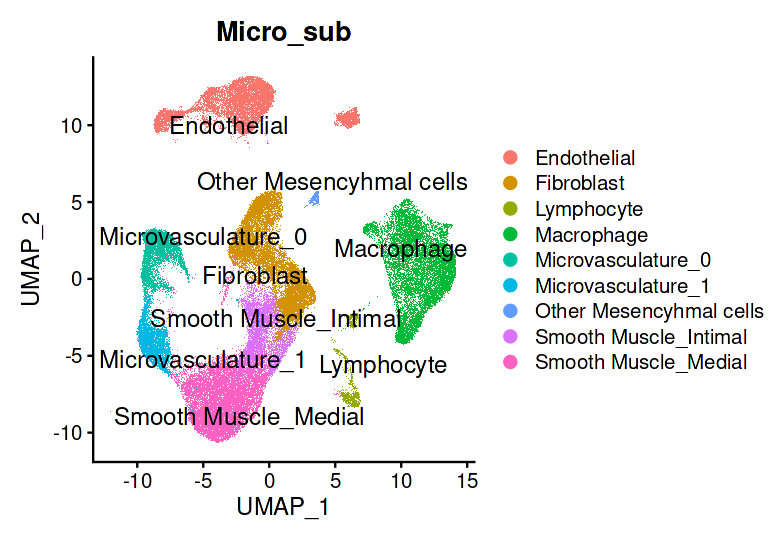

In [11]:
options(repr.plot.width=6.5, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'Micro_sub')

In [55]:
czi<-FindSubCluster(czi,'Fibroblast', 'integrated_snn',subcluster.name = "FB_sub", resolution = 0.2,algorithm = 1)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 22291
Number of edges: 803172

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9063
Number of communities: 3
Elapsed time: 4 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



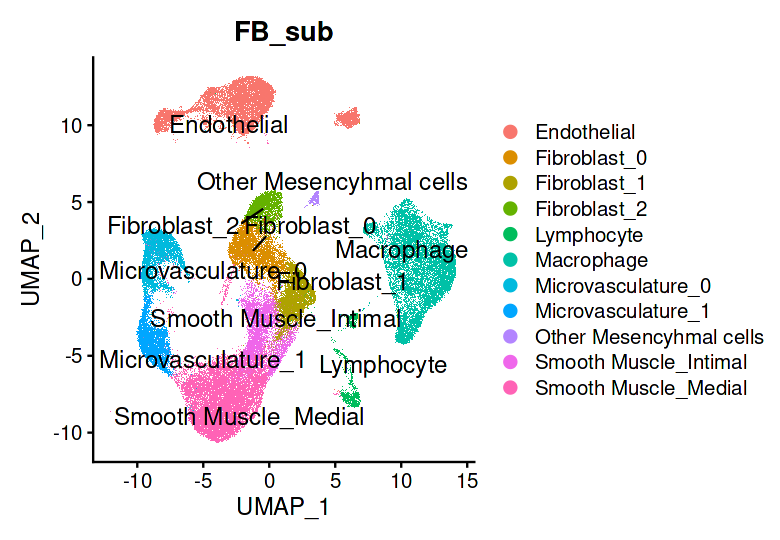

In [56]:
options(repr.plot.width=6.5, repr.plot.height=4.5)
DimPlot(czi, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'FB_sub')

In [57]:
rctd_proc_2(rca, "FB_sub")->rca

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 80278

process_cell_type_info: number of genes in reference: 23024




            Endothelial            Fibroblast_0            Fibroblast_1 
                  10000                    9039                    8353 
           Fibroblast_2              Lymphocyte              Macrophage 
                   4899                    2259                   10000 
     Microvasculature_0      Microvasculature_1 Other Mesencyhmal cells 
                   8403                    6854                     653 
  Smooth Muscle_Intimal    Smooth Muscle_Medial 
                   9818                   10000 


End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 131

get_de_genes: Fibroblast_0 found DE genes: 75

get_de_genes: Fibroblast_1 found DE genes: 53

get_de_genes: Fibroblast_2 found DE genes: 115

get_de_genes: Lymphocyte found DE genes: 101

get_de_genes: Macrophage found DE genes: 226

get_de_genes: Microvasculature_0 found DE genes: 86

get_de_genes: Microvasculature_1 found DE genes: 116

get_de_genes: Other Mesencyhmal cells found DE genes: 56

get_de_genes: Smooth Muscle_Intimal found DE genes: 82

get_de_genes: Smooth Muscle_Medial found DE genes: 101

get_de_genes: total DE genes: 823

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 286

get_de_genes: Fibroblast_0 found DE genes: 180

get_de_genes: Fibroblast_1 found DE genes: 147

get_de_genes: Fibroblast_2 found DE genes: 251

get_de_genes: Lymphocyte found DE ge

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"
[1] "gather_results: finished 7000"
[1] "gather_results: finished 8000"
[1] "gather_results: finished 9000"
[1] "gather_results: finished 10000"
[1] "gather_results: finished 11000"
[1] "gather_results: finished 12000"


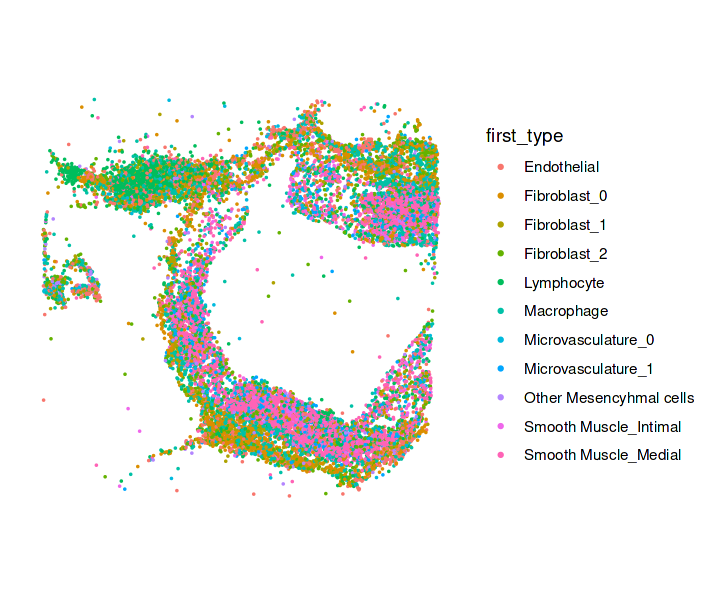

In [60]:
options(repr.plot.width=6, repr.plot.height=5)
Idents(rca)<-rca$first_type
SpatialDimPlot(rca, group.by = "first_type",stroke=0)

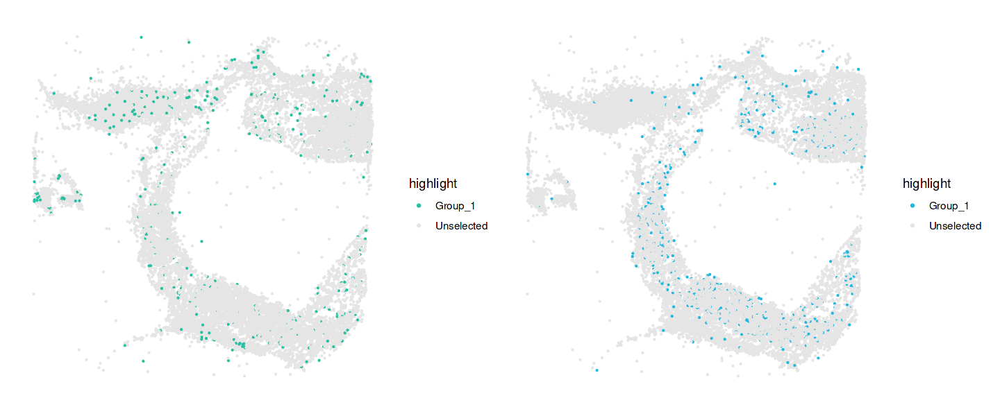

In [77]:
options(repr.plot.width=12, repr.plot.height=5)
p1 <- SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Microvasculature_0"))),
         cols.highlight = c("#24C0A0", "grey90"),stroke=0)
p2 <- SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Microvasculature_1"))),
         cols.highlight = c("#21B8E0", "grey90"),stroke=0)
p1+p2

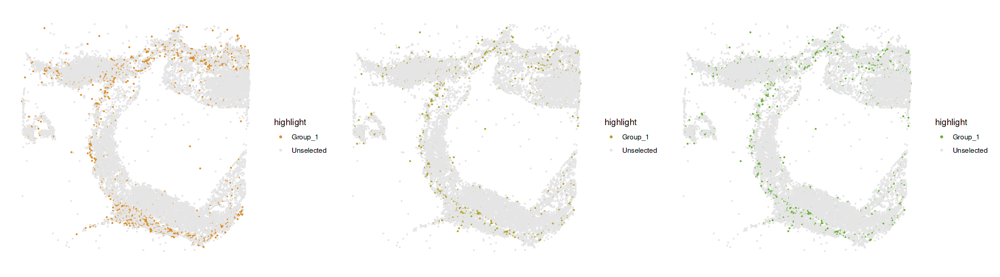

In [76]:
options(repr.plot.width=18, repr.plot.height=5)
p1 <- SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Fibroblast_0"))),
         cols.highlight = c("#D98F2B", "grey90"),stroke=0)
p2 <- SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Fibroblast_1"))),
         cols.highlight = c("#AEA22D", "grey90"),stroke=0)
p3 <- SpatialDimPlot(rca, label=F, cells.highlight= list( WhichCells(rca, idents = c("Fibroblast_1"))),
         cols.highlight = c("#68B12F", "grey90"),stroke=0)
p1+p2+p3

In [64]:
rctd_proc_2(aorta, "FB_sub")->aorta

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 80278

process_cell_type_info: number of genes in reference: 23024




            Endothelial            Fibroblast_0            Fibroblast_1 
                  10000                    9039                    8353 
           Fibroblast_2              Lymphocyte              Macrophage 
                   4899                    2259                   10000 
     Microvasculature_0      Microvasculature_1 Other Mesencyhmal cells 
                   8403                    6854                     653 
  Smooth Muscle_Intimal    Smooth Muscle_Medial 
                   9818                   10000 


End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 132

get_de_genes: Fibroblast_0 found DE genes: 75

get_de_genes: Fibroblast_1 found DE genes: 54

get_de_genes: Fibroblast_2 found DE genes: 113

get_de_genes: Lymphocyte found DE genes: 89

get_de_genes: Macrophage found DE genes: 225

get_de_genes: Microvasculature_0 found DE genes: 84

get_de_genes: Microvasculature_1 found DE genes: 111

get_de_genes: Other Mesencyhmal cells found DE genes: 51

get_de_genes: Smooth Muscle_Intimal found DE genes: 81

get_de_genes: Smooth Muscle_Medial found DE genes: 99

get_de_genes: total DE genes: 801

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: Endothelial found DE genes: 288

get_de_genes: Fibroblast_0 found DE genes: 179

get_de_genes: Fibroblast_1 found DE genes: 148

get_de_genes: Fibroblast_2 found DE genes: 248

get_de_genes: Lymphocyte found DE gene

[1] "gather_results: finished 1000"
[1] "gather_results: finished 2000"
[1] "gather_results: finished 3000"
[1] "gather_results: finished 4000"
[1] "gather_results: finished 5000"
[1] "gather_results: finished 6000"


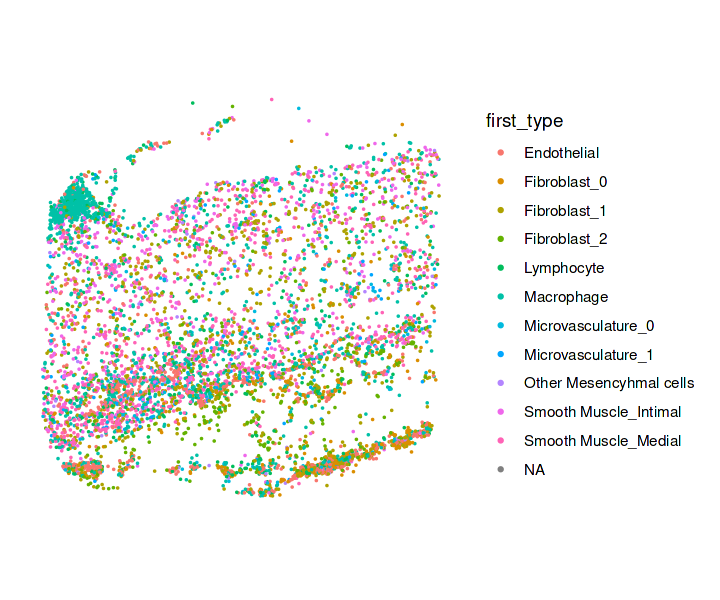

In [65]:
options(repr.plot.width=6, repr.plot.height=5)
Idents(aorta)<-aorta$first_type
SpatialDimPlot(aorta, group.by = "first_type",stroke=0)

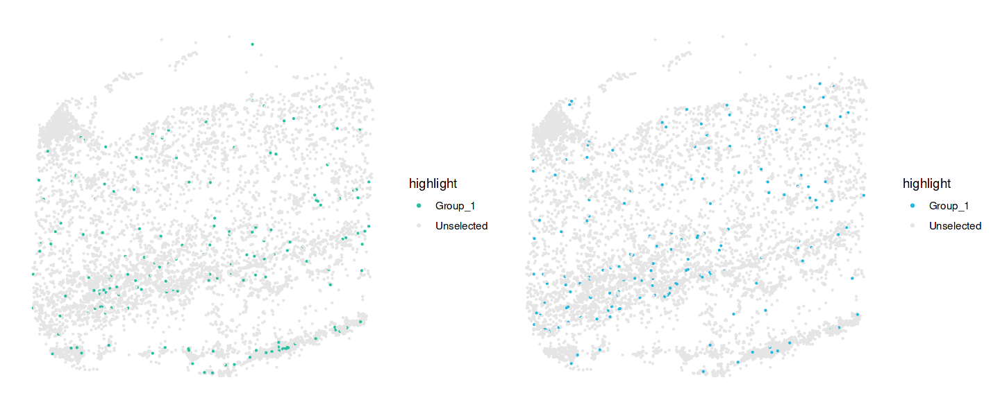

In [74]:
options(repr.plot.width=12, repr.plot.height=5)
p1 <- SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Microvasculature_0"))),
         cols.highlight = c("#24C0A0", "grey90"),stroke=0)
p2 <- SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Microvasculature_1"))),
         cols.highlight = c("#21B8E0", "grey90"),stroke=0)
p1+p2

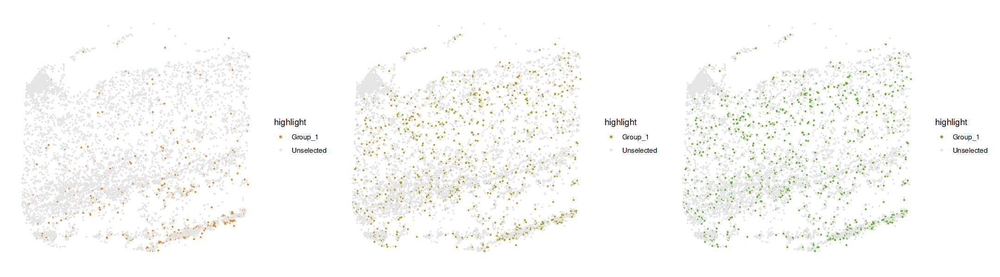

In [75]:
options(repr.plot.width=18, repr.plot.height=5)
p1 <- SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Fibroblast_0"))),
         cols.highlight = c("#D98F2B", "grey90"),stroke=0)
p2 <- SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Fibroblast_1"))),
         cols.highlight = c("#AEA22D", "grey90"),stroke=0)
p3 <- SpatialDimPlot(aorta, label=F, cells.highlight= list( WhichCells(aorta, idents = c("Fibroblast_1"))),
         cols.highlight = c("#68B12F", "grey90"),stroke=0)
p1+p2+p3

In [465]:
readRDS('~/baldar/SharedSC/RDS/Athero_hs_smc_rpca.RDS')->ref_hs_smc

In [472]:
DefaultAssay(ref_hs_smc)<-'SCT'
ref_hs_smc <- RunPCA(ref_hs_smc, verbose = FALSE,reduction.name = "pca_sct")
ref_hs_smc <- RunUMAP(ref_hs_smc, dims = 1:30, verbose = FALSE,reduction='pca_sct',reduction.name = "umap_sct")
ref_hs_smc <- FindNeighbors(ref_hs_smc, dims = 1:30, verbose = FALSE,reduction='pca_sct')
ref_hs_smc <- FindClusters(ref_hs_smc, resolution = 0.1,verbose = FALSE)

In [476]:
ref_hs_smc <- RunHarmony(object = ref_hs_smc, group.by.vars = 'batch', 
                            reduction.use = 'pca_sct', assay.use = 'SCT', project.dim = FALSE)

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



In [477]:
ref_hs_smc <- RunUMAP(ref_hs_smc, reduction = 'harmony', dims = 1:30, reduction.name='umap_h',verbose = F)

In [508]:
ref_hs_smc <- FindNeighbors(ref_hs_smc, dims = 1:30,reduction = 'harmony')
ref_hs_smc <- FindClusters(ref_hs_smc, resolution = 0.1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1740
Number of edges: 75373

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9099
Number of communities: 2
Elapsed time: 0 seconds


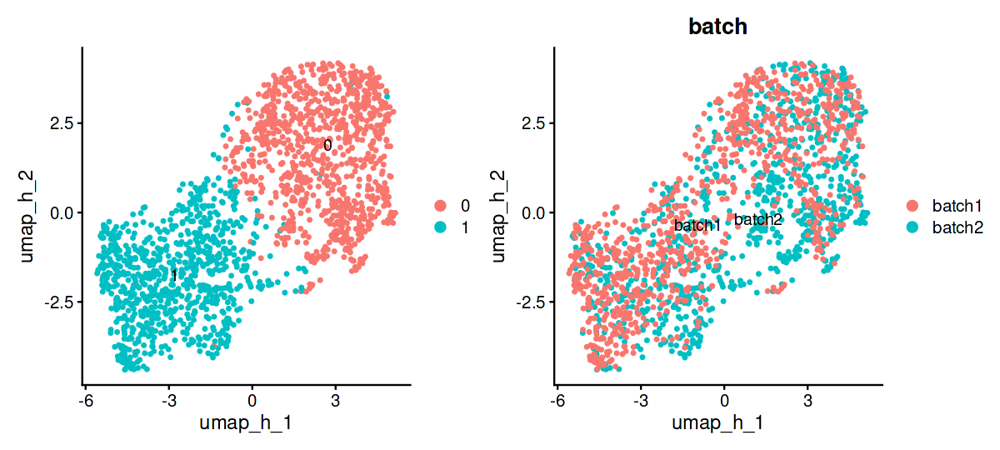

In [510]:
options(repr.plot.width=10, repr.plot.height=4.5)
DimPlot(ref_hs_smc, reduction = "umap_h",label=T)->p1
DimPlot(ref_hs_smc, reduction = "umap_h",label=T,group.by='batch')->p2
p1+p2

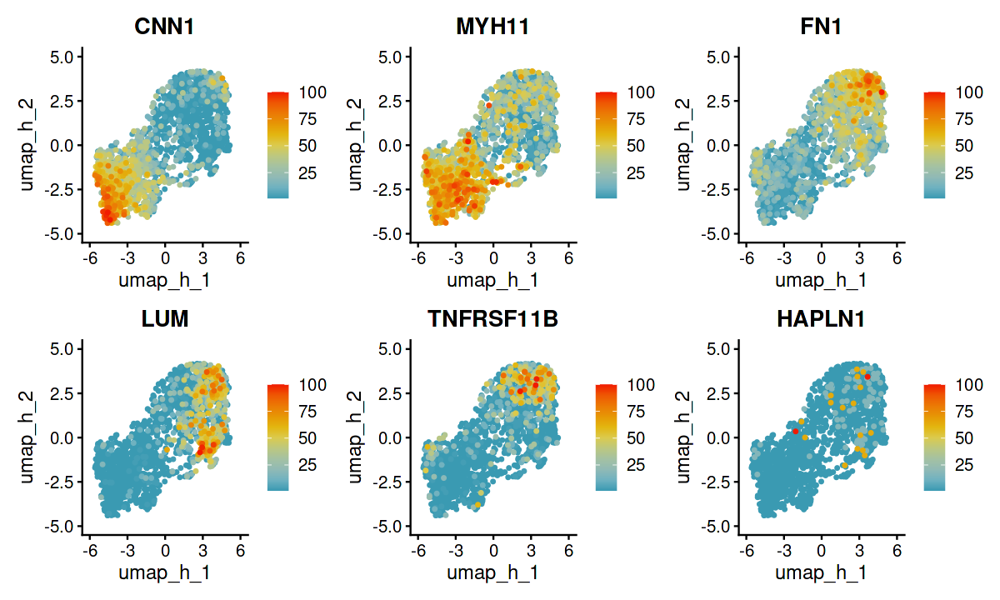

In [491]:
options(repr.plot.width=10, repr.plot.height=6)
FeaturePlot(ref_hs_smc, features = c('CNN1','MYH11','FN1','LUM','TNFRSF11B','HAPLN1'),ncol=3,
            order=T, cols = pal,min.cutoff = 1,reduction = 'umap_h')

In [511]:
Idents(ref_hs_smc)<-ref_hs_smc$seurat_clusters
cluster.ids <- c("mod SMC", "mature SMC")
names(cluster.ids) <- levels(ref_hs_smc)
ref_hs_smc <- RenameIdents(ref_hs_smc, cluster.ids)

In [513]:
Idents(ref_hs_smc)->ref_hs_smc$celltype

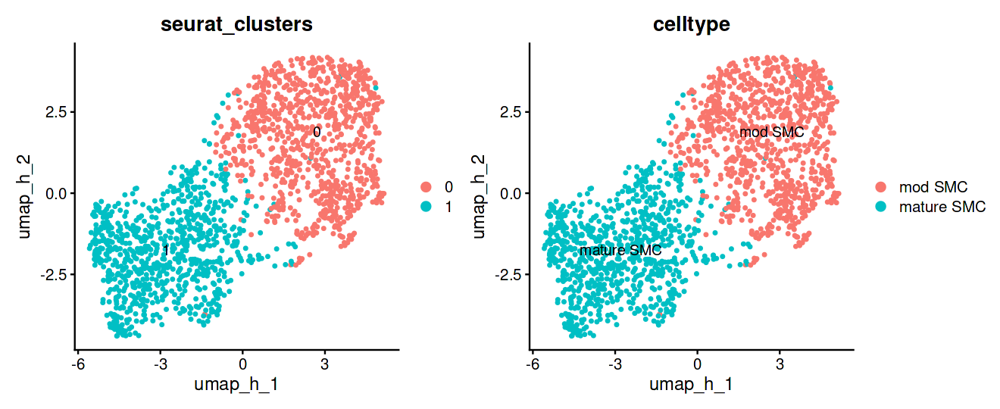

In [516]:
options(repr.plot.width=11, repr.plot.height=4.5)
DimPlot(ref_hs_smc, reduction = "umap_h",label=T,group.by='seurat_clusters')->p1
DimPlot(ref_hs_smc, reduction = "umap_h",label=T,group.by='celltype')->p2
p1+p2

In [534]:
ref_hs_smc <- RunUMAP(ref_hs_smc, dims = 1:30, reduction = "harmony", return.model = TRUE,verbose=F, reduction.name='umap_h')
DefaultAssay(smc)<-'SCT'
anchors <- FindTransferAnchors(reference = ref_hs_smc, query = smc,dims = 1:30, reference.reduction = "pca_sct")

Normalizing query using reference SCT model

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 3751 anchors

Filtering anchors

	Retained 857 anchors



In [535]:
smc <- MapQuery(anchorset = anchors, reference = ref_hs_smc, query = smc,refdata = list(celltype = "celltype"), 
                  reference.reduction = "pca_sct", reduction.model = "umap_h")

Finding integration vectors

Finding integration vector weights

Predicting cell labels


Integrating dataset 2 with reference dataset

Finding integration vectors

Integrating data

Computing nearest neighbors

Running UMAP projection

13:46:21 Read 33897 rows

13:46:21 Processing block 1 of 1

13:46:21 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

13:46:22 Initializing by weighted average of neighbor coordinates using 1 thread

13:46:22 Commencing optimization for 167 epochs, with 1016910 positive edges

13:46:31 Finished



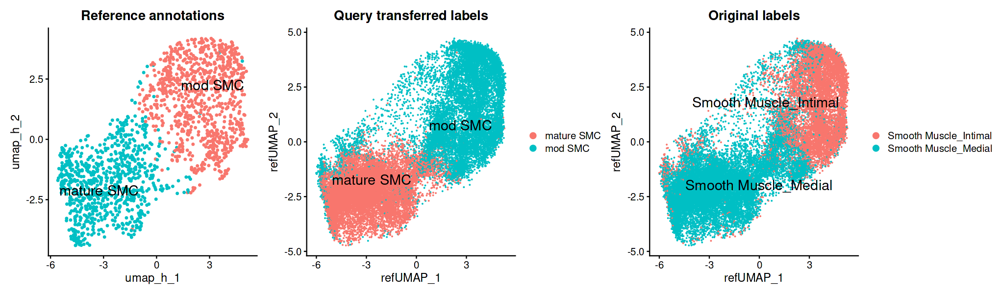

In [536]:
options(repr.plot.width=17, repr.plot.height=5)
p1 <- DimPlot(ref_hs_smc, reduction = "umap_h", group.by = "celltype", label = TRUE, label.size = 6,
    repel = TRUE) + NoLegend() + ggtitle("Reference annotations")
p2 <- DimPlot(smc, reduction = "ref.umap", group.by = "predicted.celltype", label = TRUE,
    label.size = 6, repel = TRUE) + ggtitle("Query transferred labels")
p3 <- DimPlot(smc, reduction = "ref.umap", group.by = "celltype3", label = TRUE,
    label.size = 6, repel = TRUE) + ggtitle("Original labels")
p1 + p2 + p3

In [51]:
readRDS('/VOSNE/wenduogu/scRNAseq_files/Disha_SMC_KOs/IntegratedDatasets7_noChen_noLDR.combined.rds')->master

In [53]:
subset(master, subset=Dataset1=='Paul_WT')->mouse_wt

In [54]:
mouse_wt

An object of class Seurat 
24063 features across 20121 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

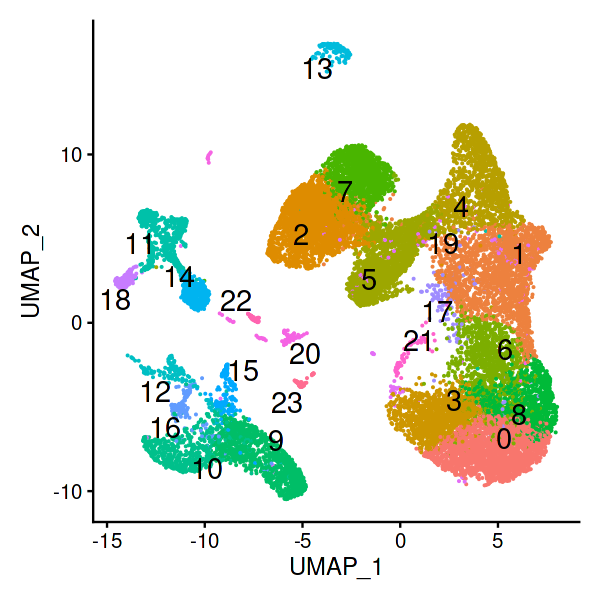

In [55]:
options(repr.plot.width=5, repr.plot.height=5)
DimPlot(mouse_wt, reduction = "umap", label = TRUE, label.size = 6,
    repel = TRUE) + NoLegend() 

In [56]:
DefaultAssay(mouse_wt)<-'RNA'
ScaleData(mouse_wt)->mouse_wt

Centering and scaling data matrix



Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


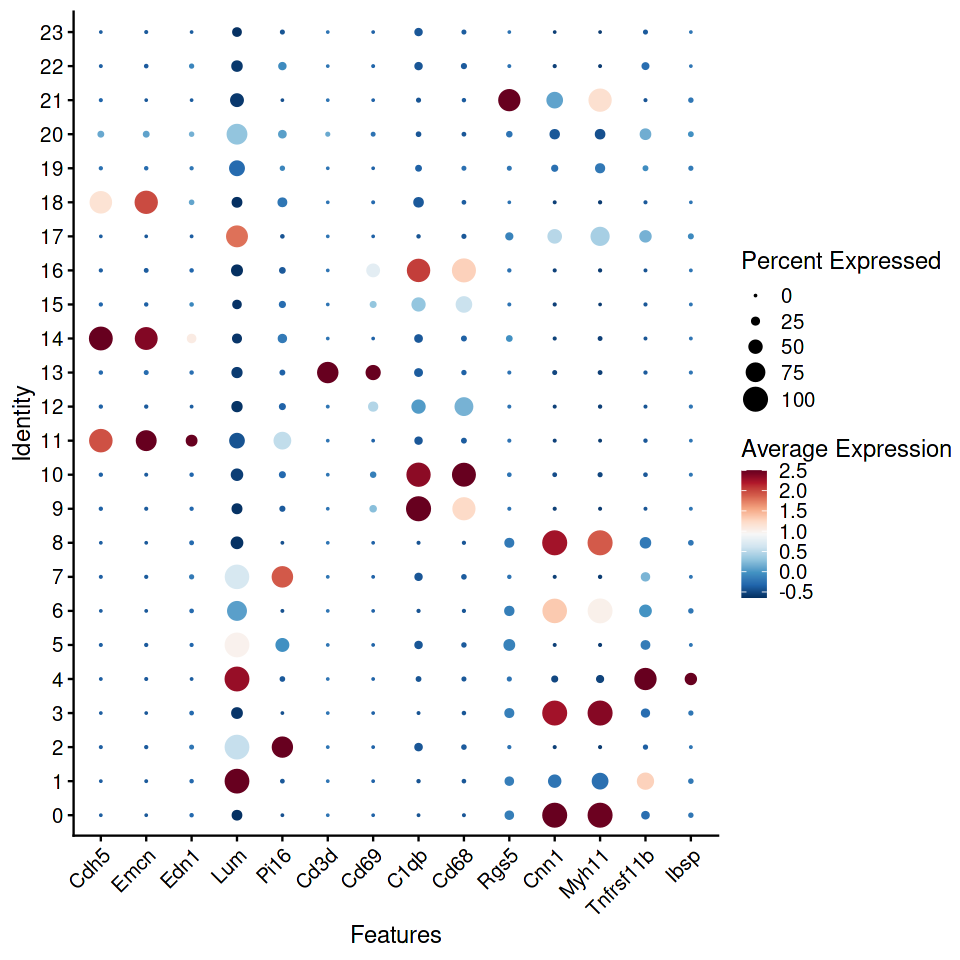

In [57]:
DefaultAssay(mouse_wt)<-'RNA'
options(repr.plot.width=8, repr.plot.height=8)
DotPlot(mouse_wt, features = c("Cdh5","Emcn","Edn1",#EC,
                          "Lum",'Pi16',#FB
                         "Cd3d",'Cd69', #Lymphocyte
                         "C1qb","Cd68",#MP
                          "Rgs5", #Microvasculature
                         "Cnn1","Myh11","Tnfrsf11b",'Ibsp'
                        ))+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [58]:
subset(mouse_wt,idents=c('0','1','3','4','6','8','17','19','21'))->ms_smc_lin

In [59]:
ms_smc_lin

An object of class Seurat 
24063 features across 9301 samples within 2 assays 
Active assay: RNA (22063 features, 0 variable features)
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [60]:
ms_smc_lin@assays$RNA@counts->counts

In [61]:
mouse2human(rownames(counts))->tran_gene

In [62]:
new_rownames <- tran_gene$humanGene[match(rownames(counts), tran_gene$mouseGene)]
rownames(counts) <- ifelse(is.na(new_rownames), rownames(counts), new_rownames)

In [63]:
ms_smc <- CreateSeuratObject(counts = counts, project = "mouse_SMC_lineage")

In [64]:
NormalizeData(ms_smc, verbose = FALSE)->ms_smc
FindVariableFeatures(ms_smc, verbose = FALSE)->ms_smc
ms_smc <- ScaleData(ms_smc, features = rownames(ms_smc))
ms_smc <- RunPCA(ms_smc, features = VariableFeatures(object = ms_smc), verbose=F)
ms_smc <- RunUMAP(ms_smc, dims = 1:30, reduction = "pca", return.model = TRUE,verbose=F)

Centering and scaling data matrix



In [65]:
ms_smc<-FindNeighbors(ms_smc, dims = 1:30,verbose = F)
ms_smc<-FindClusters(ms_smc, resolution=0.3, dims = 1:30,verbose = F)

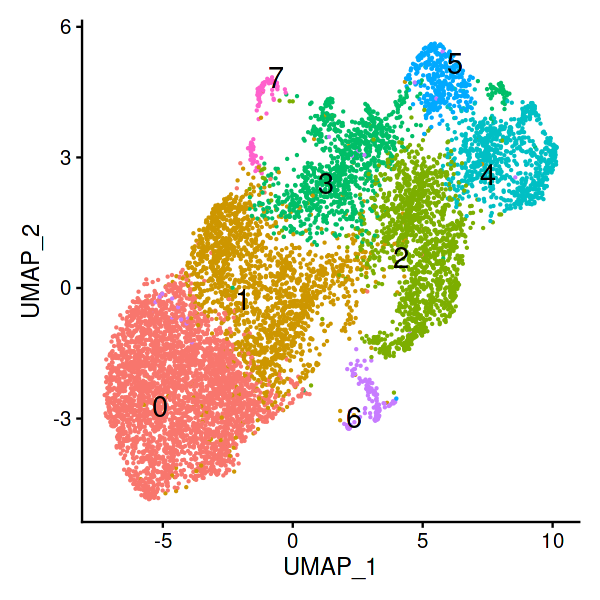

In [66]:
options(repr.plot.width=5, repr.plot.height=5)
DimPlot(ms_smc, reduction = "umap", label = TRUE, label.size = 6,
    repel = TRUE) + NoLegend() 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


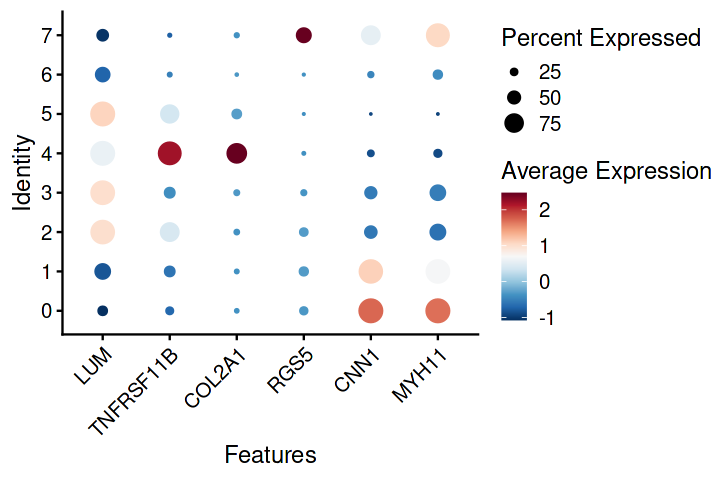

In [179]:
DefaultAssay(mouse_wt)<-'RNA'
options(repr.plot.width=6, repr.plot.height=4)
DotPlot(ms_smc, features = c( "LUM",'TNFRSF11B','COL2A1',
                          "RGS5",
                         "CNN1","MYH11"
                        ))+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

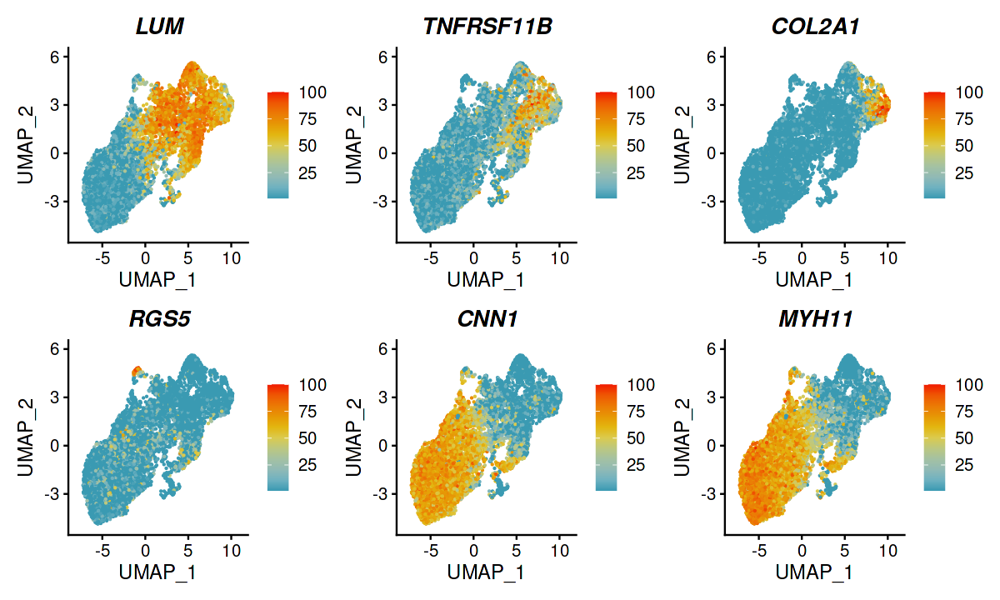

In [180]:
options(repr.plot.width=10, repr.plot.height=6)
FeaturePlot(ms_smc,features = c( "LUM",'TNFRSF11B','COL2A1',
                          "RGS5",
                         "CNN1","MYH11"
                        ), cols = pal, ncol=3,  min.cutoff = 0.01) &theme( plot.title = element_text(face='bold.italic'))

In [67]:
ms_smc$seurat_clusters->Idents(ms_smc)
cluster.ids <- c("SMC", "SMC", "FMC", "FMC", "CMC","FMC","SMC",'Pericyte')
names(cluster.ids) <- levels(ms_smc)
ms_smc <- RenameIdents(ms_smc, cluster.ids)
ms_smc$celltype<-Idents(ms_smc)

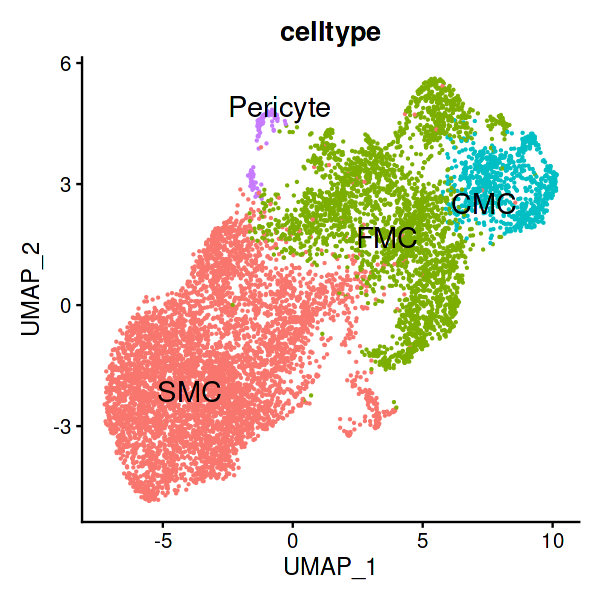

In [68]:
options(repr.plot.width=5, repr.plot.height=5)
DimPlot(ms_smc, reduction = "umap", label = TRUE, label.size = 6,group.by='celltype',
    repel = TRUE) + NoLegend() 

In [79]:
ms_smc <- RunUMAP(ms_smc, dims = 1:30, reduction = "pca", return.model = TRUE,verbose=F, reduction.name='umap')
DefaultAssay(smc_micro)<-'RNA'
anchors <- FindTransferAnchors(reference = ms_smc, query = smc_micro,dims = 1:30, reference.reduction = "pca")

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 1715 anchors

Filtering anchors

	Retained 309 anchors



In [80]:
smc_micro <- MapQuery(anchorset = anchors, reference = ms_smc, query = smc_micro,refdata = list(celltype = "celltype"), 
                  reference.reduction = "pca", reduction.model = "umap")

Finding integration vectors

Finding integration vector weights

Predicting cell labels


Integrating dataset 2 with reference dataset

Finding integration vectors

Integrating data

Computing nearest neighbors

Running UMAP projection

12:45:24 Read 49154 rows

12:45:24 Processing block 1 of 1

12:45:24 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

12:45:24 Initializing by weighted average of neighbor coordinates using 1 thread

12:45:25 Commencing optimization for 167 epochs, with 1474620 positive edges

12:45:39 Finished



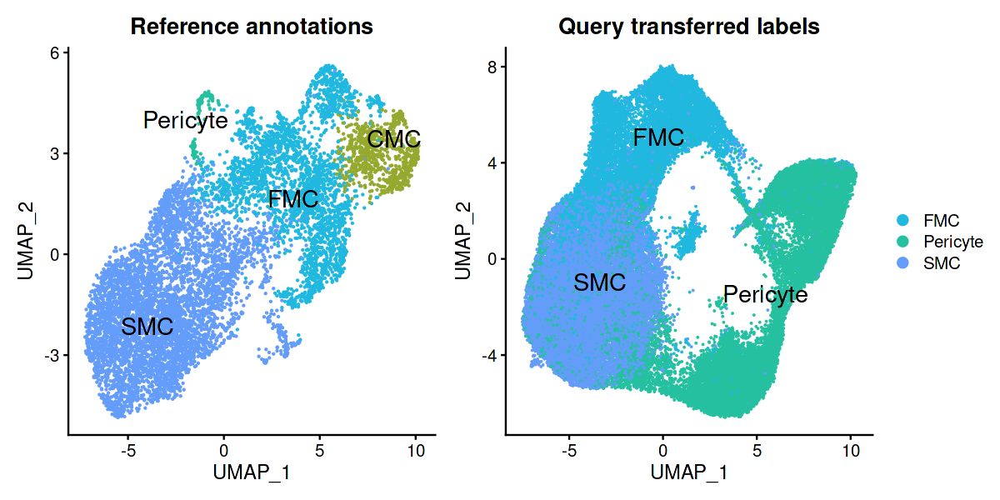

In [92]:
options(repr.plot.width=10, repr.plot.height=5)
p1 <- DimPlot(ms_smc, reduction = "umap", group.by = "celltype", label = TRUE, label.size = 6,
    repel = TRUE) + NoLegend() + ggtitle("Reference annotations")+scale_color_manual(values=c('#639CF9','#21B8E0','#94A92E','#24C0A0'))
p2 <- DimPlot(smc_micro, reduction = "umap", group.by = "predicted.celltype", label = TRUE,
    label.size = 6, repel = TRUE) + ggtitle("Query transferred labels")+scale_color_manual(values=c('#21B8E0','#24C0A0','#639CF9'))
p1 + p2 

In [538]:
DESeqADmarkers<-function(obj){
    obj$Site->Idents(obj)
    FindMarkers(obj, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->mks
    return(mks)
}
DESeqRDmarkers<-function(obj){
    obj$Site->Idents(obj)
    FindMarkers(obj, ident.1='RCA',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->mks
    return(mks)
}

In [542]:
subset(czi,subset= Site %in% c('ASC','DESC','RCA'))->ad_rd

In [548]:
seurat_list <- SplitObject(ad_rd, split.by = "Site")
subsampled_list <- list()

for (site_name in names(seurat_list)) {
  site_obj <- seurat_list[[site_name]]
  celltype_list <- SplitObject(site_obj, split.by = "celltype")
  
  for (celltype_name in names(celltype_list)) {
    celltype_obj <- celltype_list[[celltype_name]]
    cell_count <- ncol(celltype_obj)

    if (cell_count > 2000) {
      selected_cells <- sample(colnames(celltype_obj), 2000)
      celltype_obj <- subset(celltype_obj, cells = selected_cells)
    }
    
    subsampled_list[[paste(celltype_name, site_name, sep = "_")]] <- celltype_obj
  }
}

In [549]:
merged_list <- list()
celltypes <- unique(ad_rd$celltype)

for (celltype in celltypes) {
  celltype_subsets <- subsampled_list[grepl(paste0("^", celltype, "_"), names(subsampled_list))]
    
  if (length(celltype_subsets) > 1) {
    merged_list[[celltype]] <- merge(celltype_subsets[[1]], y = celltype_subsets[-1])
  } else {
    merged_list[[celltype]] <- celltype_subsets[[1]]
  }
}

In [552]:
deseq_rd_results <- list()
deseq_ad_results <- list()

for (celltype in names(merged_list)) {
  cat("Processing:", celltype, "\n")
  seurat_obj <- merged_list[[celltype]]

  deseq_rd_results[[celltype]] <- DESeqRDmarkers(seurat_obj)
  deseq_ad_results[[celltype]] <- DESeqADmarkers(seurat_obj)
}

Processing: Macrophage 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Microvasculature 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Fibroblast 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Endothelial 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Smooth Muscle 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Lymphocyte 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



Processing: Other Mesencyhmal cells 


converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [582]:
get_num_ad<-function(mk){
    mk[which(mk$p_val_adj<0.05& mk$avg_log2FC>0.1),]->mk
    return(nrow(mk))
}
get_num_rd<-function(mk){
    mk[which(mk$p_val_adj<0.0001& mk$avg_log2FC>0.25),]->mk
    return(nrow(mk))
}

In [583]:
num_ad_results <- data.frame(
  CellType = names(deseq_ad_results),
  Num_AD = sapply(deseq_ad_results, get_num_ad)
)
num_rd_results <- data.frame(
  CellType = names(deseq_rd_results),
  Num_AD = sapply(deseq_rd_results, get_num_rd)
)

In [584]:
num_ad_results$comparasion<-'ASC vs DESC'
num_rd_results$comparasion<-'RCA vs DESC'
rbind(num_ad_results,num_rd_results)->dat

In [585]:
dat[dat$CellType != 'Other Mesencyhmal cells',]->dat

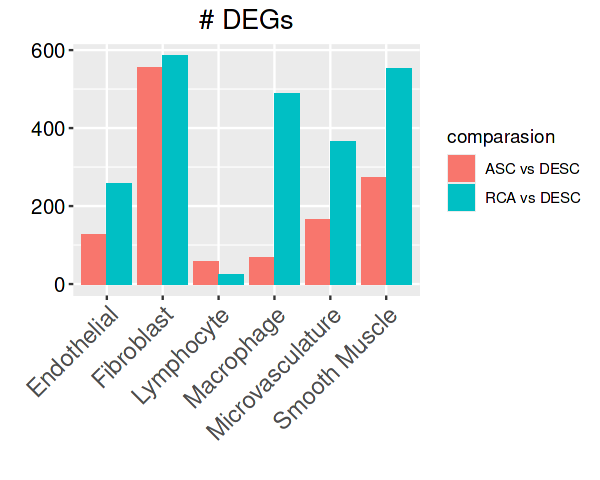

In [586]:
options(repr.plot.width=5, repr.plot.height=4)
ggplot(dat, aes(x=CellType, y=Num_AD,fill=comparasion)) + 
	geom_bar(stat= 'identity',position=position_dodge())+
	labs(x="",y='',
		title="# DEGs")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


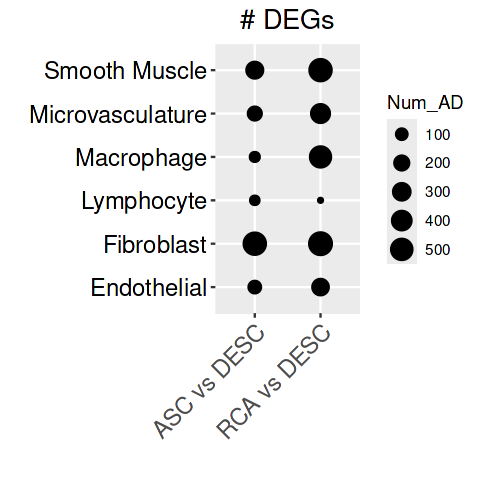

In [587]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(dat, aes(y=CellType, x=comparasion)) + 
	geom_point(aes(size=Num_AD))+
	labs(x="",y='',
		title="# DEGs")+
    #scale_size(range = c(1, 10))+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [87]:
readRDS('RDS/lnc_only_int_rna.rds')->lnc

In [88]:
colnames(lnc@meta.data)

[1] "orig.ident"             "nCount_RNA"             "nFeature_RNA"          
 [4] "czi.ident"              "Age"                    "Gender"                
 [7] "Site"                   "celltype"               "Pt"                    
[10] "RNA_snn_res.0.1"        "seurat_clusters"        "nCount_SCT"            
[13] "nFeature_SCT"           "SCT_snn_res.0.1"        "integrated_snn_res.0.1"

In [96]:
czi$celltype3->meta

In [103]:
unique(czi$celltype3)

[1] Macrophage              Microvasculature        Fibroblast             
[4] Endothelial             Smooth Muscle_Intimal   Smooth Muscle_Medial   
[7] Lymphocyte              Other Mesencyhmal cells
8 Levels: Macrophage Microvasculature Fibroblast ... Other Mesencyhmal cells

In [252]:
lnc <- AddMetaData(object = lnc, metadata = meta,col.name = 'czi.id') 

In [253]:
lnc$czi.id->Idents(lnc)

In [254]:
expr_mat <- lnc@assays$RNA@counts
feature_count_per_cell <- Matrix::colSums(expr_mat > 0)

In [255]:
lnc$feature_count_gt0 <- feature_count_per_cell

In [256]:
lnc@meta.data %>%
  group_by(czi.id) %>%
  summarise(mean_features_gt0 = mean(feature_count_gt0),
            median_features_gt0 = median(feature_count_gt0),
            sd_features_gt0 = sd(feature_count_gt0),
            n_cells = n())

czi.id,mean_features_gt0,median_features_gt0,sd_features_gt0,n_cells
<fct>,<dbl>,<dbl>,<dbl>,<int>
Macrophage,508.6155,449,287.3654,20868
Microvasculature,364.7936,308,222.8158,15257
Fibroblast,399.3341,336,253.7240,22287
Endothelial,486.7348,382,355.5020,18076
Smooth Muscle_Intimal,345.0801,302,195.5110,9814
Smooth Muscle_Medial,279.9561,239,166.2833,24070
Lymphocyte,364.9057,325,187.6913,2258
Other Mesencyhmal cells,351.0322,304,202.1804,653


In [268]:
subset(lnc, idents=c('Smooth Muscle_Intimal','Smooth Muscle_Medial'))->smc_lnc

In [269]:
Idents(smc_lnc) <- factor(Idents(smc_lnc), levels = c('Smooth Muscle_Intimal','Smooth Muscle_Medial'), labels = c("Intimal", "Medial"))


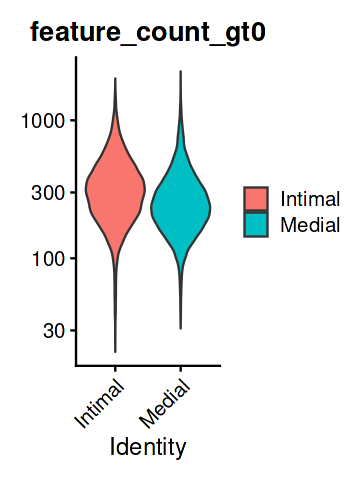

In [270]:
options(repr.plot.width=3, repr.plot.height=4)
VlnPlot(smc_lnc, features = c('feature_count_gt0'), ncol=1,pt.size=0,log = T)

In [278]:
features <- c('CDKN2B-AS1','CERNA1','CHROMR','COLCA1','GAS5',
              'H19','KCNQ1OT1','LINC01123','TP53COR1','MALAT1',
              'MARS1','SMANTIS','MIAT','NEAT1','NEXN-AS1',
              'PCA3','PELATON','SNHG12','SNHG14','SNHG16',
              'MIR34A','ZNF800')

Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found (10 out of 17 shown): CDKN2B-AS1, CERNA1, CHROMR, COLCA1, GAS5, KCNQ1OT1, TP53COR1, MARS1, SMANTIS, MIAT”


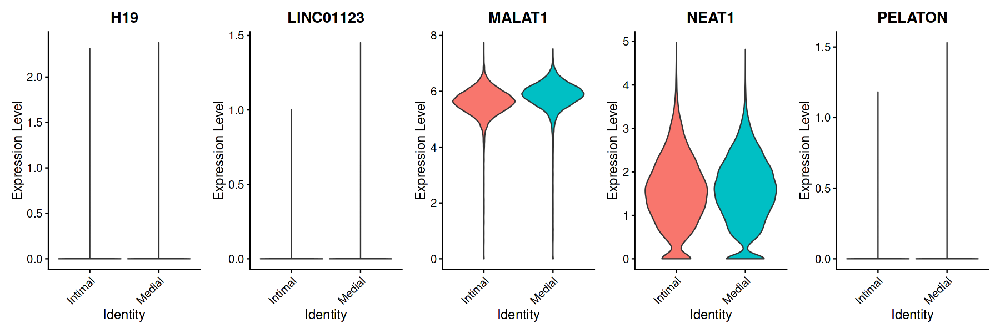

In [272]:
options(repr.plot.width=15, repr.plot.height=5)
VlnPlot(smc_lnc, features = features, ncol=5,pt.size=0,assay='RNA')

In [264]:
smc$celltype3->Idents(smc)

Warning message in FetchData.Seurat(object = object, vars = features, slot = slot):
“The following requested variables were not found: CHROMR, GAS5, H19, TP53COR1, MARS1, SMANTIS, PELATON, SNHG14, SNHG16, MIR34A”


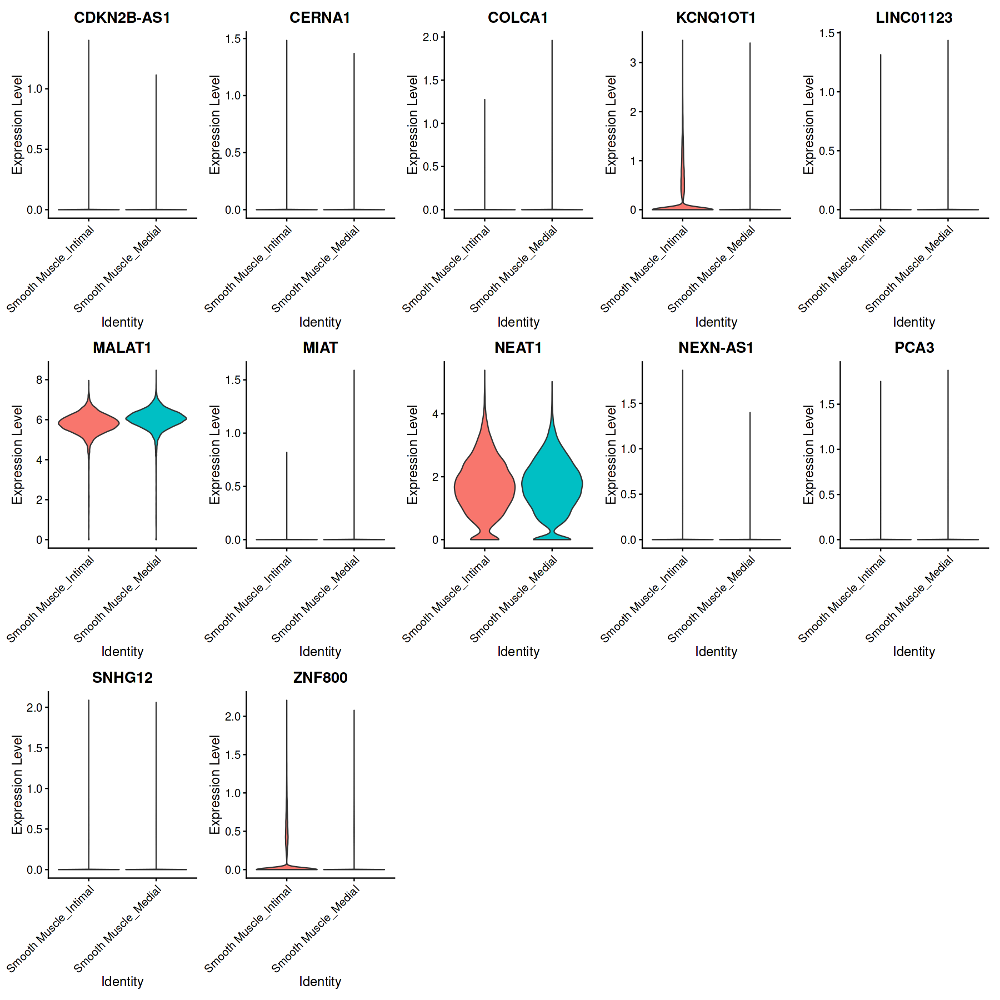

In [266]:
options(repr.plot.width=15, repr.plot.height=15)
VlnPlot(smc, features = features, ncol=5,pt.size=0,assay='RNA')

Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found (10 out of 17 shown): CDKN2B-AS1, CERNA1, CHROMR, COLCA1, GAS5, KCNQ1OT1, TP53COR1, MARS1, SMANTIS, MIAT”
Warning message:
“Scaling data with a low number of groups may produce misleading results”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


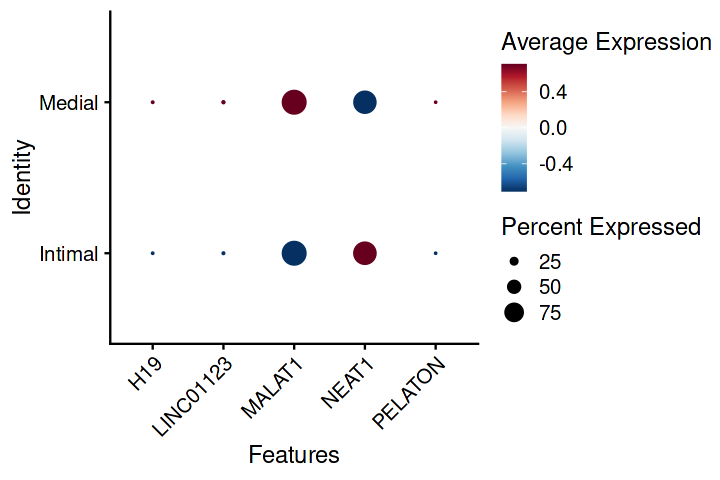

In [275]:
options(repr.plot.width=6, repr.plot.height=4)
DotPlot(smc_lnc,  features=features,assay='RNA')+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [280]:
Idents(smc) <- factor(Idents(smc), levels = c('Smooth Muscle_Intimal','Smooth Muscle_Medial'), labels = c("Intimal", "Medial"))

Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found: CHROMR, GAS5, H19, TP53COR1, MARS1, SMANTIS, PELATON, SNHG14, SNHG16, MIR34A”
Warning message:
“Scaling data with a low number of groups may produce misleading results”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


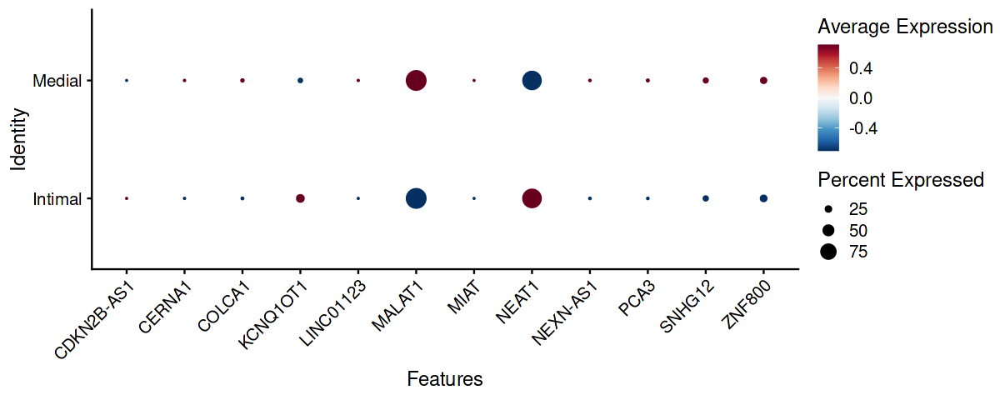

In [281]:
options(repr.plot.width=10, repr.plot.height=4)
DotPlot(smc,  features=features,assay='RNA')+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

In [285]:
dot1 <- DotPlot(smc, features=features, assay='RNA')$data
dot2 <- DotPlot(smc_lnc, features=features, assay='RNA')$data

dot_combined <- bind_rows(dot1, dot2)
dot_combined <- distinct(dot_combined, features.plot, id, .keep_all = TRUE)

Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found: CHROMR, GAS5, H19, TP53COR1, MARS1, SMANTIS, PELATON, SNHG14, SNHG16, MIR34A”
Warning message:
“Scaling data with a low number of groups may produce misleading results”
Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found (10 out of 17 shown): CDKN2B-AS1, CERNA1, CHROMR, COLCA1, GAS5, KCNQ1OT1, TP53COR1, MARS1, SMANTIS, MIAT”
Warning message:
“Scaling data with a low number of groups may produce misleading results”


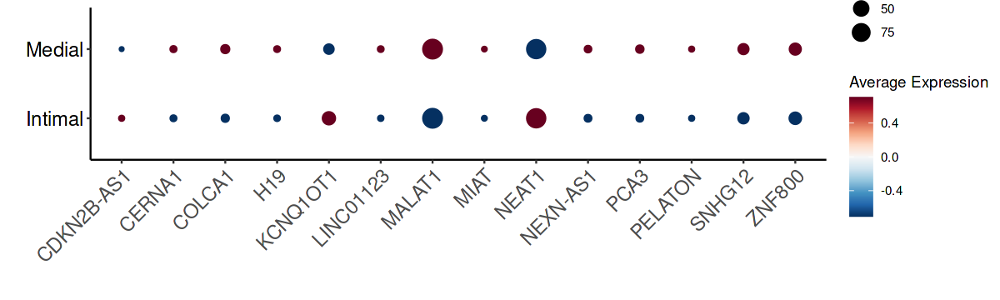

In [294]:
options(repr.plot.width=10, repr.plot.height=3)
ggplot(dot_combined, aes(x = features.plot, y = id, size = pct.exp, color = avg.exp.scaled)) +
  geom_point() +
  RotatedAxis() +
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu"))) +
  theme_classic()+
  labs(x = "", y = "", color = "Average Expression", size='Percent Expressed') +
  	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14)
	)